In [1]:
# !pip install scikit-learn

In [2]:
# !pip install nltk

In [3]:
# !pip install spacy

In [4]:
# !python -m spacy download en_core_web_lg

In [5]:
# import spacy

# nlp = spacy.load('en_core_web_md')

In [6]:
# !ls data/all_netzero_data_textract20200906/

In [7]:
# !pip install pandas

In [8]:
!ls data/all_netzero_data_09062020/

Abasan Al-Kabira.pdf
Adelaide_carbon-neutral-action-plan (1).pdf
Adelaide_report-carbon-neutral-adelaide-status-report-july-19.pdf
Alameda, CA.pdf
Albany, NY.pdf
Amman.pdf
Amsterdam.pdf
Ann Arbor, MI.pdf
Arlington, VA.pdf
ArlingtonFinal-CEP-CLEAN-003.pdf
Asheville, NC.pdf
Aspen, CO.pdf
Atlanta, GA.pdf
Auckland.pdf
Austin, TX.pdf
BCP Council.pdf
Barcelona.pdf
Barcelona_Climate_Plan.pdf
Bath & North East Somerset Climate Emergency Action Plan.pdf
Bath & North East Somerset.pdf
Belo Horizonte.pdf
Berkeley_CA_2020-07-21 Special Item 05 Climate Action Plan (1).pdf
Berlin Climate Neutral.pdf
Berlin Climate Strategy.pdf
Blacksburg, VA.pdf
Boston, MA.pdf
Boulder County, CO.pdf
Boulder, CO.pdf
Bristol_UK_Mayor's Climate Emergency Action Plan 2019 FINAL.pdf
Bristol_UK_Mayor_s Climate Emergency Action Plan 2019 FINAL.pdf
Bristol_UK_one-city-climate-strategy.pdf
Buenos Aires.pdf
Burlingame, CA.pdf
Burlington, VT.pdf
Bursa.pdf
Byron Shire.pdf
Calgary climate-resilience-plan.pdf
Calgary_imagineCALGA

## TODO:

* Reconcile characteristic + netzero data, make sure it's perfect, not missing anything
* reconcile topics, complete lexicon construction to be exhaustive
* Perform Unsupervised/visualization
    * Topic distributions by
        * region
        * population
        * net zero target status
    * PCA/clusters/LSA


* Set up tuning to be exhaustive, searching over:
1. feature selection tuning using:
    * LASSO
    * Stepwise regression
2. Postprocessing methodology
    * Count normalization
    * Tfidf vs. counts
    * single vs. multiple instance
    * Try direct term featurization


In [400]:
import os
import json

data = []
extraction_path = 'data/all_netzero_data_textract20200906/'
pdf_fnames = [name for name in os.listdir(extraction_path) if name.endswith('.json')]
len(pdf_fnames)

172

In [401]:
for fname in pdf_fnames:
    city_name = fname.split(',')[0].split('_')[0]
    path = os.path.join(extraction_path, fname)
    with open(path, 'r') as f:
        text_json = json.load(f)
        if text_json['-1'] is not None:
            raw_text = text_json['-1']['raw_text']
            ocr_method = text_json['-1']['method']
        else:
            raw_text = None
            ocr_method = None
        row = {
            'full_json': json.dumps(text_json),
            'text': raw_text,
            'ocr_method': ocr_method,
            'city': city_name,
            'path': path
        }
        data.append(row)

In [402]:
import pandas as pd

df = pd.DataFrame(data)
df

,full_json,text,ocr_method,city,path
0,"{""-1"": {""raw_text"": ""\f\f\f\f\f"", ""method"": ""p...",,pdftotext,Fremont,data/all_netzero_data_textract20200906/Fremont...
1,"{""-1"": {""raw_text"": ""URBANA CLIMATE INHERITANC...",URBANA CLIMATE INHERITANCE RESOLUTION\nWHEREAS...,pdftotext,Urbana,"data/all_netzero_data_textract20200906/Urbana,..."
2,"{""-1"": {""raw_text"": ""ALAMEDA\nClimate Action a...",ALAMEDA\nClimate Action and\nResiliency Plan (...,pdftotext,Alameda,data/all_netzero_data_textract20200906/Alameda...
3,"{""-1"": {""raw_text"": ""\fS\n\nU\n\nS\n\nT\n\nA\n...",S\n\nU\n\nS\n\nT\n\nA\n\nI\n\nN\n\nA\n\nB\n\n...,pdftotext,Asheville,data/all_netzero_data_textract20200906/Ashevil...
4,"{""-1"": {""raw_text"": ""INTRODUCTION\n\n1\n\nCIRC...",INTRODUCTION\n\n1\n\nCIRCULAR BOULDER\nPioneer...,pdftotext,Boulder,data/all_netzero_data_textract20200906/Boulder...
...,...,...,...,...,...
167,"{""-1"": {""raw_text"": "" \n\fXY\n\nuly\nRGA,\nKS ...","\n XY\n\nuly\nRGA,\nKS 2\n\n%\nRESILIENCY ELE...",tesseract,Indianapolis,data/all_netzero_data_textract20200906/Indiana...
168,"{""-1"": {""raw_text"": ""Climate Plan 2018-2030\n\...",Climate Plan 2018-2030\n\nCLIMATE\nLIMATE\n\nP...,pdftotext,Barcelona,data/all_netzero_data_textract20200906/Barcelo...
169,"{""-1"": {""raw_text"": ""Net Zero Energy Roadmap\n...",Net Zero Energy Roadmap\nfor the\nCity of Burl...,pdftotext,Burlington,data/all_netzero_data_textract20200906/Burling...
170,"{""-1"": {""raw_text"": ""Climate Action Plan for I...",Climate Action Plan for Internal Operations\n\...,pdftotext,Sacramento,data/all_netzero_data_textract20200906/Sacrame...


In [403]:
# !pip install spacy-langdetect

In [404]:
!python -m spacy download en_core_web_md

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_md')


In [405]:
from tqdm import tqdm
import spacy

tqdm.pandas()
nlp = spacy.load('en_core_web_md')

df['doc'] = df['text'].progress_apply(nlp)

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/tqdm/std.py:668: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
100%|██████████| 172/172 [10:00<00:00,  3.49s/it]


In [406]:
#df.to_pickle('processed.pkl')

In [407]:
# !pip install spacy

In [408]:
import spacy

In [409]:
# import pandas as pd

# df = pd.read_pickle('processed.pkl')

In [410]:
# df['city'].to_csv('carbon_zero_nlp_cities.csv', index=False)

In [411]:
# !head carbon_zero_nlp_cities.csv

In [412]:
from spacy_langdetect import LanguageDetector

help(LanguageDetector)

Help on class LanguageDetector in module spacy_langdetect.spacy_langdetect:

class LanguageDetector(builtins.object)
 |  LanguageDetector(language_detection_function=None)
 |  
 |  Fully customizable language detection pipeline for spaCy.
 |  
 |  Arguments:
 |      language_detection_function: An optional custom language_detection_function. (Default None).
 |                                   If None uses, langdetect package to detect language
 |  
 |  # writing a custom language_detection_function:
 |      The function must take in a spacy Doc or Span object only as input and can return the detected language.
 |      This is stored in Doc._.language, Span._.language and Token._.language attributes.
 |  
 |  Methods defined here:
 |  
 |  __call__(self, doc)
 |      Call self as a function.
 |  
 |  __init__(self, language_detection_function=None)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  -----------------------------------------------------------

In [413]:
df['doc']

0                                                (




)
1      (URBANA, CLIMATE, INHERITANCE, RESOLUTION, \n,...
2      (ALAMEDA, \n, Climate, Action, and, \n, Resili...
3      (
, S, \n\n, U, \n\n, S, \n\n, T, \n\n, A, \n\...
4      (INTRODUCTION, \n\n, 1, \n\n, CIRCULAR, BOULDE...
                             ...                        
167    ( \n
, XY, \n\n, uly, \n, RGA, ,, \n, KS, 2, \...
168    (Climate, Plan, 2018, -, 2030, \n\n, CLIMATE, ...
169    (Net, Zero, Energy, Roadmap, \n, for, the, \n,...
170    (Climate, Action, Plan, for, Internal, Operati...
171    (CITY, OF, ALBANY, \n\n, Issued, January, 2015...
Name: doc, Length: 172, dtype: object

In [414]:
from tqdm import tqdm

tqdm.pandas()

detector = LanguageDetector()

detector(df['doc'].iloc[0])

In [415]:
df['language'] = df['doc'].progress_apply(lambda doc: detector(doc)._.language['language'])

100%|██████████| 172/172 [00:21<00:00,  7.99it/s]


In [416]:
inp_data = df[df['language'] == 'en']

In [417]:
inp_data['city'].unique()

array(['Urbana', 'Alameda', 'Asheville', 'Boulder', 'Victoria', 'Boston',
       'Bristol', 'Stockholm', 'Byron Shire', 'Hong Kong', 'Piedmont',
       'Davis', 'Santa Cruz', 'Columbia', 'Charlotte', 'Auckland',
       'London', 'Mississauga', 'LA', 'Winnipeg', 'Chicago',
       'Salt Lake City', 'Turku', 'Dublin', 'Tacoma', 'Portland', 'Oslo',
       'Emeryville CAP 2016 Final', 'Washington D.C.', 'Eugene',
       'Lexington', 'Edmonton', 'Houston', 'Halifax', 'eThekweni',
       'San Francisco', 'Riga', 'Mexico', 'Bursa', 'Arlington', 'Amman',
       'Evanston', 'Amsterdam', 'Louiseville', 'Ann Arbor',
       'Philadelphia', 'Palo Alto', 'Copenhagen', 'Toronto',
       'Abasan Al-Kabira', 'Eau Claire', 'New Bedford', 'Austin',
       'Louisville', 'Adelaide', 'Manchester', 'Cape Town', 'Knoxville',
       'Hayward', 'Columbus', 'Denver', 'Sarasota', 'Tainan',
       'Greater Manchester', 'Lisbon', 'Barcelona', 'San Jose',
       'Cincinnati', 'St Catharines ', 'Emeryville', 'Vancouve

In [765]:
len(['Urbana', 'Alameda', 'Asheville', 'Boulder', 'Victoria', 'Boston',
       'Bristol', 'Stockholm', 'Byron Shire', 'Hong Kong', 'Piedmont',
       'Davis', 'Santa Cruz', 'Columbia', 'Charlotte', 'Auckland',
       'London', 'Mississauga', 'LA', 'Winnipeg', 'Chicago',
       'Salt Lake City', 'Turku', 'Dublin', 'Tacoma', 'Portland', 'Oslo',
       'Emeryville CAP 2016 Final', 'Washington D.C.', 'Eugene',
       'Lexington', 'Edmonton', 'Houston', 'Halifax', 'eThekweni',
       'San Francisco', 'Riga', 'Mexico', 'Bursa', 'Arlington', 'Amman',
       'Evanston', 'Amsterdam', 'Louiseville', 'Ann Arbor',
       'Philadelphia', 'Palo Alto', 'Copenhagen', 'Toronto',
       'Abasan Al-Kabira', 'Eau Claire', 'New Bedford', 'Austin',
       'Louisville', 'Adelaide', 'Manchester', 'Cape Town', 'Knoxville',
       'Hayward', 'Columbus', 'Denver', 'Sarasota', 'Tainan',
       'Greater Manchester', 'Lisbon', 'Barcelona', 'San Jose',
       'Cincinnati', 'St Catharines ', 'Emeryville', 'Vancouver',
       'Flagstaff', 'Edina', 'City of Santa Cruz Climate Action Plan',
       'Saskatoon', 'Orlando', 'Guelph', 'Umea', 'Blacksburg', 'Atlanta',
       'Berkeley',
       'Bath & North East Somerset Climate Emergency Action Plan',
       'Cupertino Climate Action Plan', 'Cambridge', 'Uppsala',
       'Burlingame', 'Ljubljana', 'Northhampton', 'Paris',
       'New York City', 'Bath & North East Somerset', 'Plymouth',
       'Kansas', 'St Louis', 'Berlin Climate Strategy', 'San Carlos',
       'Wyndham', 'New Orleans', 'Sydney',
       'Mississauga Climate Change Action Plan', 'Providence',
       'Fort Collins', 'ArlingtonFinal-CEP-CLEAN-003', 'Wollongong',
       'BCP Council', 'Melbourne', 'KwaDukuza',
       'Calgary climate-resilience-plan', 'Kampala Climate Change Action',
       'Aspen', 'Pittsburgh', 'Mornington Peninsula', 'Calgary',
       'The Espoo Story in English', 'Sonama', 'Berlin Climate Neutral',
       'Somerville', 'Glasgow', 'Cleveland', 'Medford',
       'Tainan City Climate Action 2016', 'Victoria Climate Action Plan',
       'Reykjavík', 'Tokyo', 'Buenos Aires', 'Belo Horizonte',
       'Singapore', 'Espoo', 'Dallas', 'Boulder County',
       'Santiago Action Plan -COP25 - final', 'Erie County',
       'Upssala Climate and Energy Programme 2014-2023', 'Indianapolis',
       'Burlington', 'Sacramento', 'Albany'])

137

## Marker Data

In [418]:
# city_markers = pd.read_csv('/Users/siddharthsachdeva/data/SCRIPTS/DATA/D_FINAL.tsv', delimiter='\t')
# city_markers['City name']

In [419]:
# inp_data

In [420]:
# cities = pd.Series(inp_data['city'].unique())#city_markers['City name']
# cities

In [421]:
# city_markers['City name'].sort_values().tolist()

In [422]:
# cities = cities.reset_index()[[0]]
# cities.columns=['city_name']

In [423]:
# cities['found'] = False

In [424]:
# cities['city_name'].str.lower().isin(city_markers['City name'].str.lower())]['found'] = True
# cities[cities['city_name'].str.lower().isin(city_markers['City name'].str.lower())]['found_meth'] = None

In [425]:
# cities['found'].sum()

In [426]:
# cities['first term'] = cities['city_name'].apply(lambda name: name.split()[0])
# city_markers['first term'] = city_markers['City name'].apply(lambda name: name.split()[0])
# cities[(cities['first term'].str.lower().isin(city_markers['first term'].str.lower()) & (cities['found']==False))]

## Merge city characteristics

In [427]:
city_characteristics = pd.read_csv('/Users/siddharthsachdeva/personal/geo/buyin/data/net_zero_plan_cities_Siddharth.csv')
city_characteristics

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year
0,"Fremont, CA",City,United States of America,USA,234962.0,200.646525,California,"Alameda County, CA",GlobalCovenantofMayors2019;Carbonn2019;WeAreSt...,37.548270,-121.988572,North America,1660000.0,2005.0
1,"Urbana, IL",City,United States of America,USA,42014.0,5.697978,Illinois,"Champaign County, IL",ClimateMayors;GlobalCovenantofMayors2019;Carbo...,40.109660,-88.204250,North America,NaN,NaN
2,"Alameda, CA",City,United States of America,USA,78906.0,27.039496,California,"Alameda County, CA",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,37.756111,-122.274444,North America,367294.0,2005.0
3,"Asheville, NC",City,United States of America,USA,89121.0,117.326547,North Carolina,"Buncombe County, NC",CDPCities2018;ClimateMayors;Carbonn2019;WeAreS...,35.595100,-82.551500,North America,NaN,NaN
4,"Boulder, CO",City,United States of America,USA,105112.0,64.335352,Colorado,"Boulder County, CO",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,40.015000,-105.270556,North America,NaN,2005.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,"Erie County, NY",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,"Indianapolis, IN",City,United States of America,USA,864711.0,936.307285,Indiana,"Marion County, IN",GlobalCovenantofMayors2019;WeAreStillIn2019;CD...,39.768403,-86.158068,North America,NaN,NaN
132,"Burlington, VT",City,United States of America,USA,42239.0,34.744716,Vermont,New England,ClimateMayors;WeAreStillIn2019;Carbonn2019;Glo...,44.475833,-73.211944,North America,NaN,NaN
133,"Sacramento, CA",City,United States of America,USA,495234.0,259.283900,California,"Sacramento County, CA",Under2Coalition2019;CDPCities2018;WeAreStillIn...,38.555556,-121.468889,North America,NaN,2005.0


In [428]:
city_characteristics['city_name'] = city_characteristics.name.str.split(',').apply(lambda ps: ps[0])
city_characteristics['city_name']

0           Fremont
1            Urbana
2           Alameda
3         Asheville
4           Boulder
           ...     
130     Erie County
131    Indianapolis
132      Burlington
133      Sacramento
134          Albany
Name: city_name, Length: 135, dtype: object

In [429]:
inp_data.columns

Index(['full_json', 'text', 'ocr_method', 'city', 'path', 'doc', 'language'], dtype='object')

In [430]:
city_characteristics

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name
0,"Fremont, CA",City,United States of America,USA,234962.0,200.646525,California,"Alameda County, CA",GlobalCovenantofMayors2019;Carbonn2019;WeAreSt...,37.548270,-121.988572,North America,1660000.0,2005.0,Fremont
1,"Urbana, IL",City,United States of America,USA,42014.0,5.697978,Illinois,"Champaign County, IL",ClimateMayors;GlobalCovenantofMayors2019;Carbo...,40.109660,-88.204250,North America,NaN,NaN,Urbana
2,"Alameda, CA",City,United States of America,USA,78906.0,27.039496,California,"Alameda County, CA",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,37.756111,-122.274444,North America,367294.0,2005.0,Alameda
3,"Asheville, NC",City,United States of America,USA,89121.0,117.326547,North Carolina,"Buncombe County, NC",CDPCities2018;ClimateMayors;Carbonn2019;WeAreS...,35.595100,-82.551500,North America,NaN,NaN,Asheville
4,"Boulder, CO",City,United States of America,USA,105112.0,64.335352,Colorado,"Boulder County, CO",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,40.015000,-105.270556,North America,NaN,2005.0,Boulder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130,"Erie County, NY",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Erie County
131,"Indianapolis, IN",City,United States of America,USA,864711.0,936.307285,Indiana,"Marion County, IN",GlobalCovenantofMayors2019;WeAreStillIn2019;CD...,39.768403,-86.158068,North America,NaN,NaN,Indianapolis
132,"Burlington, VT",City,United States of America,USA,42239.0,34.744716,Vermont,New England,ClimateMayors;WeAreStillIn2019;Carbonn2019;Glo...,44.475833,-73.211944,North America,NaN,NaN,Burlington
133,"Sacramento, CA",City,United States of America,USA,495234.0,259.283900,California,"Sacramento County, CA",Under2Coalition2019;CDPCities2018;WeAreStillIn...,38.555556,-121.468889,North America,NaN,2005.0,Sacramento


In [431]:
city_characteristics['region'].value_counts(dropna=False)

North America                      72
Europe                             24
NaN                                20
East Asia and the Pacific          11
Sub-Saharan Africa                  3
Latin America and Caribbean         3
Eastern Europe and Central Asia     1
Middle East and North Africa        1
Name: region, dtype: int64

In [432]:
list(city_characteristics['region'].unique())

['North America',
 'Europe',
 'East Asia and the Pacific',
 nan,
 'Sub-Saharan Africa',
 'Latin America and Caribbean',
 'Eastern Europe and Central Asia',
 'Middle East and North Africa']

In [433]:
city_characteristics[city_characteristics['region'].isnull()]

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name
13,Høje-Taastrup,City,Denmark,DNK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Høje-Taastrup
15,"Columbia, SC",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Columbia
23,Västervik,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Västervik
27,Dublin,City,Ireland,IRL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Dublin
54,Abasan Al-Kabira,City,Palestine,PSE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Abasan Al-Kabira
71,"San José, CA",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,San José
80,Umeå,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Umeå
86,"Cambridge, UK",City,United Kingdom,GBR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cambridge
89,Ljubljana,City,Slovenia,SVN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Ljubljana
90,Northampton,City,United Kingdom,GBR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Northampton


In [434]:
country2missing_regions = {
    'Denmark': 'Europe',
    'United States of America': 'North America',
    'United States': 'North America',
    'Sweden': 'Europe',
    'Ireland': 'Europe',
    'Palestine': 'Middle East and North Africa',
    'United Kingdom': 'Europe',
    'Philippines':'East Asia and the Pacific',
    'South Africa': 'Sub-Saharan Africa',
    'Iceland': 'Europe',
    'Brazil': 'Latin America and Caribbean',
    'Singapore': 'East Asia and the Pacific',
    'Slovenia': 'Europe'
}

# city_characteristics['country'].map(country2missing_regions)
city_characteristics.loc[city_characteristics['region'].isnull(), 'region'] = city_characteristics[city_characteristics['region'].isnull()]['country'].map(country2missing_regions)

In [435]:
city_characteristics[city_characteristics['region'].isnull()]

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name


In [436]:
city_characteristics.region.value_counts()

North America                      77
Europe                             34
East Asia and the Pacific          13
Sub-Saharan Africa                  4
Latin America and Caribbean         4
Middle East and North Africa        2
Eastern Europe and Central Asia     1
Name: region, dtype: int64

In [437]:
city_characteristics[city_characteristics.population.isnull()]

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name
13,Høje-Taastrup,City,Denmark,DNK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Høje-Taastrup
15,"Columbia, SC",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,North America,NaN,NaN,Columbia
23,Västervik,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Västervik
27,Dublin,City,Ireland,IRL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Dublin
54,Abasan Al-Kabira,City,Palestine,PSE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Middle East and North Africa,NaN,NaN,Abasan Al-Kabira
71,"San José, CA",City,United States of America,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,North America,NaN,NaN,San José
80,Umeå,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Umeå
86,"Cambridge, UK",City,United Kingdom,GBR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Cambridge
89,Ljubljana,City,Slovenia,SVN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Ljubljana
90,Northampton,City,United Kingdom,GBR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Northampton


In [438]:
city_characteristics.sort_values('population', ascending=False)

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name
38,Durban,City,South Africa,ZAF,38201740.0,2291.00000,KwaZulu-Natal,eThekwini,Carbonn2019;C40Cities2019;CDPCities2018;Global...,-29.883333,31.050000,Sub-Saharan Africa,NaN,NaN,Durban
123,Tokyo,City,Japan,JPN,13929286.0,2122.00000,Tokyo Metropolis,Honshu,Carbonn2019;C40Cities2019;GlobalCovenantofMayo...,35.683330,139.683300,East Asia and the Pacific,NaN,NaN,Tokyo
18,"London, UK",City,United Kingdom,GBR,8883800.0,1737.88329,Greater London,NaN,CDPCities2018;C40Cities2019;GlobalCovenantofMa...,51.504800,-0.078680,Europe,45050000.0,1990.0,London
41,Mexico City,City,Mexico,MEX,8851080.0,NaN,State of Mexico,Latin America and the Caribbean,C40Cities2019;Carbonn2019;Under2Coalition2019;...,19.433333,-99.133333,Latin America and Caribbean,NaN,NaN,Mexico City
92,"New York City, NY",City,United States of America,USA,8537673.0,783.84230,New York State,NaN,ClimateMayors;WeAreStillIn2019;WeAreStillIn201...,40.712700,-74.005900,North America,61062452.0,2005.0,New York City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,"Somerville, MA",City,United States,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,North America,NaN,NaN,Somerville
122,Reykjavík,City,Iceland,ISL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Reykjavík
125,Belo Horizonte,City,Brazil,BRA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Latin America and Caribbean,NaN,NaN,Belo Horizonte
126,Singapore,City,Singapore,SGP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia and the Pacific,NaN,NaN,Singapore


## Add national GDP

In [439]:
import pandas as pd

gdp_data = pd.read_csv('/Users/siddharthsachdeva/Downloads/country2gdppercapita.csv')
gdp_data

,Country,Most Recent Year,Most Recent Value,Unnamed: 3,Unnamed: 4,Unnamed: 5
0,Afghanistan,2019.0,502.1,NaN,NaN,NaN
1,Albania,2019.0,"5,352.9",NaN,NaN,NaN
2,Algeria,2019.0,"3,948.3",NaN,NaN,NaN
3,American Samoa,2018.0,"11,466.7",NaN,NaN,NaN
4,Andorra,2019.0,"40,886.4",NaN,NaN,NaN
...,...,...,...,...,...,...
243,Low & middle income,2019.0,"5,080.4",NaN,NaN,NaN
244,Low income,2019.0,779.8,NaN,NaN,NaN
245,Lower middle income,2019.0,"2,176.6",NaN,NaN,NaN
246,Middle income,2019.0,"5,575.4",NaN,NaN,NaN


In [440]:
gdp_dict = gdp_data.to_dict()

In [441]:
percapita = {gdp_dict['Country'][idx]: gdp_dict['Most Recent Value'][idx] for idx in range(len(gdp_data))}

In [442]:
gdp_data['Country'].sort_values().tolist()

['Afghanistan',
 'Albania',
 'Algeria',
 'American Samoa',
 'Andorra',
 'Angola',
 'Antigua and Barbuda',
 'Arab World',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas, The',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'British Virgin Islands',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burundi',
 'Cabo Verde',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Caribbean small states',
 'Cayman Islands',
 'Central African Republic',
 'Central Europe and the Baltics',
 'Chad',
 'Channel Islands',
 'Chile',
 'China',
 'Colombia',
 'Comoros',
 'Congo, Dem. Rep.',
 'Congo, Rep.',
 'Costa Rica',
 "Cote d'Ivoire",
 'Croatia',
 'Cuba',
 'Curacao',
 'Cyprus',
 'Czech Republic',
 'Denmark',
 'Djibouti',
 'Dominica',
 'Dominican Republic',
 'East Asia & Pacific',
 'East Asia & Pacific (excluding high income)',
 'Ecuador',
 'Egypt, 

In [443]:
country_remap = {'United States of America': 'United States',
                 'Hong Kong': 'Hong Kong SAR, China'}

city_characteristics.country = city_characteristics.country.map(lambda country: 
    country_remap[country] if country in country_remap else country)

In [444]:
city_characteristics[~city_characteristics.country.isin(gdp_data['Country'])].country.tolist()

['Palestine', 'Taiwan']

In [445]:
gdp_dict = gdp_data.to_dict()

In [446]:
percapita = {gdp_dict['Country'][idx]: gdp_dict['Most Recent Value'][idx] for idx in range(len(gdp_data))}

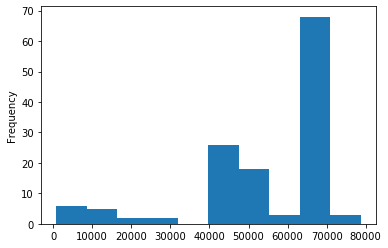

In [447]:
city_characteristics['country_percapita_gdp'] = city_characteristics.country.map(percapita).str.replace(',', '').apply(float)
city_characteristics['country_percapita_gdp'].plot.hist()

In [448]:
city_characteristics[city_characteristics.country_percapita_gdp.isnull()].region.value_counts()

Middle East and North Africa    1
East Asia and the Pacific       1
Name: region, dtype: int64

In [449]:
city_characteristics[city_characteristics.area.isnull()].region.value_counts()

Europe                          13
North America                   11
East Asia and the Pacific        3
Latin America and Caribbean      2
Middle East and North Africa     1
Sub-Saharan Africa               1
Name: region, dtype: int64

In [450]:
city_characteristics.baseline_emissions.isnull().value_counts()

False    69
True     66
Name: baseline_emissions, dtype: int64

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:482: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
  ax.set_xlim(self.xlim)


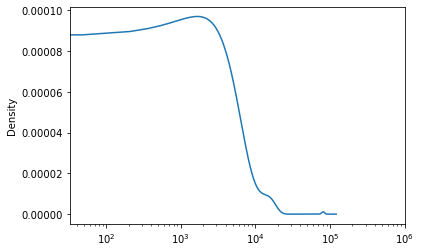

In [451]:
city_characteristics['density'] = city_characteristics['population'] / city_characteristics['area']
densities = city_characteristics['density'].sort_values().reset_index(drop=True)
densities.plot.density(xlim=(-1000, 1000000), logx=True)

In [452]:
city_characteristics.sort_values('density')

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name,country_percapita_gdp,density
59,Adelaide,City,Australia,AUS,23916.0,3257.7,South Australia,NaN,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-34.928889,138.601111,East Asia and the Pacific,NaN,NaN,Adelaide,54907.1,7.341376
98,Louisiana,Region,United States,USA,4648794.0,135382.0,NaN,NaN,NaN,31.000000,-92.000000,North America,215000000.0,2005.0,Louisiana,65118.4,34.338346
55,Kristianstad,City,Sweden,SWE,78000.0,1818.0,SkÃ¥ne,NaN,Carbonn2019;EUCovenantofMayors2019;GlobalCoven...,56.029444,14.156667,Europe,619057.0,1990.0,Kristianstad,51610.1,42.904290
9,Byron Shire,City,Australia,AUS,32723.0,556.0,New South Wales,NaN,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-28.550000,153.500000,East Asia and the Pacific,18660.0,2015.0,Byron Shire,54907.1,58.854317
21,Orebro,City,Sweden,SWE,140000.0,1620.0,NÃ¤rke,NaN,Carbonn2019;EUCovenantofMayors2019;GlobalCoven...,59.273889,15.207500,Europe,893191.0,2000.0,Orebro,51610.1,86.419753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,"Somerville, MA",City,United States,USA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,North America,NaN,NaN,Somerville,65118.4,NaN
122,Reykjavík,City,Iceland,ISL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Reykjavík,66944.8,NaN
125,Belo Horizonte,City,Brazil,BRA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Latin America and Caribbean,NaN,NaN,Belo Horizonte,8717.2,NaN
126,Singapore,City,Singapore,SGP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,East Asia and the Pacific,NaN,NaN,Singapore,65233.3,NaN


In [453]:
map_names = {
    
                         'ArlingtonFinal-CEP-CLEAN-003': 'Arlington',
                                          'BCP Council': 'Bournemouth',
    'Bath & North East Somerset Climate Emergency Action Plan': 'Bath & North East Somerset',
                               'Berlin Climate Neutral': 'Berlin',
                              'Berlin Climate Strategy': 'Berlin',
                      'Calgary climate-resilience-plan': 'Calgary',
               'City of Santa Cruz Climate Action Plan': 'Santa Cruz',
                        'Cupertino Climate Action Plan': 'Cupertino',
                            'Emeryville CAP 2016 Final': 'Emeryville',
                        'Kampala Climate Change Action': 'Kampala',
                                               'Kansas': 'Kansas City',
                                                   'LA': 'Los Angeles',
                                          'Louiseville': 'Louisville',
                                               'Mexico': 'Mexico City',
               'Mississauga Climate Change Action Plan': 'Mississauga',
                                 'Mornington Peninsula': 'Mornington Peninsula Shire',
                                         'Northhampton': 'Northampton',
                                           'Reykjavík': 'Reykjavík',
                                             'San Jose': 'San José',
                                             'San Jose': 'San José',
                  'Santiago Action Plan -COP25 - final': 'Santiago',
                                               'Sonama': 'Sonama',
                                       'St Catharines ': 'St Catharines',
                                             'St Louis': 'St. Louis',
                                             'St Louis': 'St. Louis',
                      'Tainan City Climate Action 2016': 'Tainan',
                           'The Espoo Story in English': 'Espoo',
                                                 'Umea': 'Umeå',
       'Upssala Climate and Energy Programme 2014-2023': 'Upssala',
                         'Victoria Climate Action Plan': 'Victoria',
                                            'eThekweni': 'Durban',
                                            'Sonama': 'Sonoma',
                                            'St Catharines': 'St. Catharines',
                                            'Upssala': 'Uppsala'
}

In [454]:
inp_data['city'] = inp_data['city'].map(lambda c: map_names[c] if c in map_names else c)

<ipython-input-454-e41515647a67>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inp_data['city'] = inp_data['city'].map(lambda c: map_names[c] if c in map_names else c)


In [455]:
inp_data[~inp_data['city'].isin(city_characteristics['city_name'])]['city'].tolist()

['St Catharines', 'Upssala']

In [456]:
inp_data['city'].sort_values().tolist()

['Abasan Al-Kabira',
 'Adelaide',
 'Adelaide',
 'Alameda',
 'Albany',
 'Amman',
 'Amsterdam',
 'Ann Arbor',
 'Arlington',
 'Arlington',
 'Asheville',
 'Aspen',
 'Atlanta',
 'Auckland',
 'Austin',
 'Barcelona',
 'Barcelona',
 'Bath & North East Somerset',
 'Bath & North East Somerset',
 'Belo Horizonte',
 'Berkeley',
 'Berlin',
 'Berlin',
 'Blacksburg',
 'Boston',
 'Boulder',
 'Boulder County',
 'Bournemouth',
 'Bristol',
 'Bristol',
 'Bristol',
 'Buenos Aires',
 'Burlingame',
 'Burlington',
 'Bursa',
 'Byron Shire',
 'Calgary',
 'Calgary',
 'Cambridge',
 'Cape Town',
 'Charlotte',
 'Charlotte',
 'Chicago',
 'Cincinnati',
 'Cleveland',
 'Columbia',
 'Columbus',
 'Copenhagen',
 'Cupertino',
 'Dallas',
 'Davis',
 'Denver',
 'Denver',
 'Dublin',
 'Durban',
 'Eau Claire',
 'Edina',
 'Edmonton',
 'Emeryville',
 'Emeryville',
 'Erie County',
 'Espoo',
 'Espoo',
 'Eugene',
 'Eugene',
 'Evanston',
 'Flagstaff',
 'Fort Collins',
 'Glasgow',
 'Greater Manchester',
 'Guelph',
 'Halifax',
 'Hayward

In [457]:
len(inp_data['city'].unique())

126

In [458]:
city_characteristics[~city_characteristics['city_name'].isin(inp_data['city'])]

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name,country_percapita_gdp,density
0,"Fremont, CA",City,United States,USA,234962.0,200.646525,California,"Alameda County, CA",GlobalCovenantofMayors2019;Carbonn2019;WeAreSt...,37.548270,-121.988572,North America,1660000.0,2005.0,Fremont,65118.4,1171.024515
13,Høje-Taastrup,City,Denmark,DNK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Høje-Taastrup,59822.1,NaN
21,Orebro,City,Sweden,SWE,140000.0,1620.000000,NÃ¤rke,NaN,Carbonn2019;EUCovenantofMayors2019;GlobalCoven...,59.273889,15.207500,Europe,893191.0,2000.0,Orebro,51610.1,86.419753
23,Västervik,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Västervik,51610.1,NaN
47,Heidelberg,City,Germany,DEU,150054.0,108.830000,Baden-WÃ¼rttemberg,NaN,CDPCities2018;EUCovenantofMayors2019;GlobalCov...,49.398800,8.672430,Europe,1270299.0,1993.0,Heidelberg,46258.9,1378.792612
55,Kristianstad,City,Sweden,SWE,78000.0,1818.000000,SkÃ¥ne,NaN,Carbonn2019;EUCovenantofMayors2019;GlobalCoven...,56.029444,14.156667,Europe,619057.0,1990.0,Kristianstad,51610.1,42.904290
73,"St. Catharines, ON",City,Canada,CAN,131400.0,378.680000,Ontario,Niagara,CDPCities2018;GlobalCovenantofMayors2019;NAZCA,43.159400,-79.246900,North America,NaN,1990.0,St. Catharines,46194.7,346.994824
96,Elsinore,City,Denmark,DNK,47364.0,121.610000,Capital Region,NaN,CDPCities2018;EUCovenantofMayors2019;GlobalCov...,56.030800,12.592100,Europe,415408.0,2008.0,Elsinore,59822.1,389.474550
98,Louisiana,Region,United States,USA,4648794.0,135382.000000,NaN,NaN,NaN,31.000000,-92.000000,North America,215000000.0,2005.0,Louisiana,65118.4,34.338346
111,Trondheim,City,Norway,NOR,185000.0,321.810000,TrÃ¸ndelag,Trondheim Region,EUCovenantofMayors2019;GlobalCovenantofMayors2...,63.429720,10.393330,Europe,370516.1,1991.0,Trondheim,75419.6,574.873372


In [459]:
inp_data['city_name'] = inp_data['city']

<ipython-input-459-febf25039409>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inp_data['city_name'] = inp_data['city']


In [460]:
inp_data = pd.merge(inp_data, city_characteristics, on='city_name')

In [461]:
inp_data['region'].value_counts()

North America                      96
Europe                             36
East Asia and the Pacific          16
Sub-Saharan Africa                  4
Latin America and Caribbean         4
Middle East and North Africa        2
Eastern Europe and Central Asia     1
Name: region, dtype: int64

In [462]:
inp_data.columns

Index(['full_json', 'text', 'ocr_method', 'city', 'path', 'doc', 'language',
       'city_name', 'name', 'entity_type', 'country', 'iso', 'population',
       'area', 'state', 'admin_1', 'initiatives_committed', 'lat', 'lng',
       'region', 'baseline_emissions', 'baseline_year',
       'country_percapita_gdp', 'density'],
      dtype='object')

In [463]:
inp_data[inp_data['region'].isnull()]

,full_json,text,ocr_method,city,path,doc,language,city_name,name,entity_type,...,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,country_percapita_gdp,density


In [464]:
inp_data['fname'] = inp_data['path'].str.split('/').apply(lambda a: a[-1])

In [465]:
inp_data['fname']

0      Urbana, IL Resolution_textract20200906.json
1                Alameda, CA_textract20200906.json
2              Asheville, NC_textract20200906.json
3                Boulder, CO_textract20200906.json
4                   Victoria_textract20200906.json
                          ...                     
154          Erie County, NY_textract20200906.json
155         Indianapolis, IN_textract20200906.json
156           Burlington, VT_textract20200906.json
157           Sacramento, CA_textract20200906.json
158               Albany, NY_textract20200906.json
Name: fname, Length: 159, dtype: object

In [466]:
inp_data.groupby('city_name')

In [467]:
inp_data.columns

Index(['full_json', 'text', 'ocr_method', 'city', 'path', 'doc', 'language',
       'city_name', 'name', 'entity_type', 'country', 'iso', 'population',
       'area', 'state', 'admin_1', 'initiatives_committed', 'lat', 'lng',
       'region', 'baseline_emissions', 'baseline_year',
       'country_percapita_gdp', 'density', 'fname'],
      dtype='object')

In [468]:
inp_data = inp_data[['text', 'city_name', 'doc', 'entity_type', 'country', 'iso', 'population',
       'area', 'state', 'admin_1', 'initiatives_committed', 'lat', 'lng',
       'region', 'baseline_emissions', 'baseline_year', 'density', 'country_percapita_gdp']]

In [469]:
import spacy

nlp = spacy.load('en_core_web_md')

In [470]:
city_characteristics.sort_values('name')

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,city_name,country_percapita_gdp,density
54,Abasan Al-Kabira,City,Palestine,PSE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Middle East and North Africa,NaN,NaN,Abasan Al-Kabira,NaN,NaN
59,Adelaide,City,Australia,AUS,23916.0,3257.700000,South Australia,NaN,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-34.928889,138.601111,East Asia and the Pacific,NaN,NaN,Adelaide,54907.1,7.341376
2,"Alameda, CA",City,United States,USA,78906.0,27.039496,California,"Alameda County, CA",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,37.756111,-122.274444,North America,367294.0,2005.0,Alameda,65118.4,2918.175737
134,"Albany, NY",City,United States,USA,98566.0,55.399886,New York State,"Albany County, NY",GlobalCovenantofMayors2019;CDPCities2018;Clima...,42.651167,-73.754968,North America,NaN,NaN,Albany,65118.4,1779.173333
44,Amman,City,Jordan,JOR,3800000.0,1680.000000,Amman Governorate,NaN,CDPCities2018;Carbonn2019;C40Cities2019;Global...,31.945400,35.928400,Middle East and North Africa,7400000.0,2014.0,Amman,4330.3,2261.904762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23,Västervik,City,Sweden,SWE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe,NaN,NaN,Västervik,51610.1,NaN
32,Washington D.C.,City,United States,USA,693972.0,158.118900,NaN,United States,ClimateMayors;WeAreStillIn2019;WeAreStillIn201...,38.904720,-77.016390,North America,NaN,NaN,Washington D.C.,65118.4,4388.925043
22,"Winnipeg, MB",City,Canada,CAN,749500.0,464.080000,Manitoba,Winnipeg Metro Region,CDPCities2018;NAZCA,49.899700,-97.137500,North America,5379024.0,2011.0,Winnipeg,46194.7,1615.023272
105,Wollongong,City,Australia,AUS,208875.0,572.200000,New South Wales,Illawarra,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-34.433060,150.883100,East Asia and the Pacific,NaN,NaN,Wollongong,54907.1,365.038448


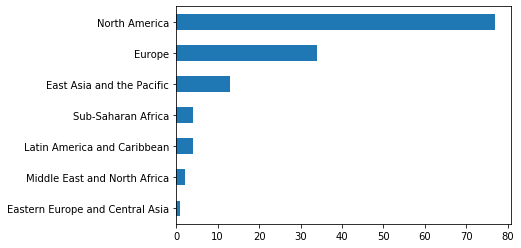

In [764]:
city_characteristics.region.value_counts()[::-1].plot.barh()

In [472]:
import numpy as np

def combine(city_reports):
    #print(city_reports)
    res = city_reports[~city_reports['text'].duplicated()]
    if len(res) == 1:
        return res
    new = dict()
    for col in city_reports.columns:
        data = city_reports[col]
        data = data[data.notnull()]
        data = data[~data.duplicated()]
        if len(data) == 0:
            new[col] = np.nan
        elif len(data) == 1:
            new[col] = data.iloc[0]
        elif col == 'text':
            new[col] = '\n\n\n'.join(city_reports[col].tolist())
        elif col == 'doc':
            new[col] = nlp('\n\n\n'.join(city_reports['text'].tolist()))
        else:
            new[col] = data.tolist()
            print(col)
            print(type(new[col][0]))
    return pd.DataFrame([pd.Series(new)])

inp_data = inp_data.groupby('city_name').apply(combine).reset_index(drop=True)

## Merge netzero targets

In [473]:
netzero_targets = pd.read_csv('/Users/siddharthsachdeva/personal/geo/buyin/data/net_zero_plan_cities_targets_Siddharth.csv')
netzero_targets

,name,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,net_zero_target_status,percent_reduction,target_year
0,"Asheville, NC",City,United States of America,USA,89121,117.326547,North Carolina,"Buncombe County, NC",CDPCities2018;ClimateMayors;Carbonn2019;WeAreS...,35.595100,-82.551500,North America,NaN,2002.0,"1,4",80,2050
1,"Boulder, CO",City,United States of America,USA,105112,64.335352,Colorado,"Boulder County, CO",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,40.015000,-105.270556,North America,NaN,2005.0,"1,2,4",80,2050
2,Victoria,City,Canada,CAN,85792,NaN,NaN,NaN,Carbonn;ICLEI - Local Governments for Sustaina...,48.428400,-123.366000,North America,412875.0,2007.0,"1,4",80,2050
3,Bristol,City,United Kingdom,GBR,441300,NaN,NaN,NaN,Under2Coalition2019;Carbonn2019;GlobalCovenant...,51.450000,-2.583333,Europe,2382697.0,2005.0,"1,2,4",80,Long term
4,"Piedmont, CA",City,United States of America,USA,11236,25.433700,California,"Alameda County, CA",GlobalCovenantofMayors2019;CDPCities2018;NAZCA,37.824372,-122.231635,North America,48820.0,2005.0,1,80,2050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,"Pittsburgh, PA",City,United States of America,USA,305704,151.100000,Pennsylvania,"Allegheny County, PA",CDPCities2018;Under2Coalition2019;GlobalCovena...,40.440600,-79.995900,North America,5987870.0,2003.0,NaN,80,2050
67,Espoo,City,Finland,FIN,279044,528.140000,Uusimaa,Greater Helsinki,Carbonn2019;EUCovenantofMayors2019;GlobalCoven...,60.205556,24.655556,Europe,1055027.0,1990.0,"1,4",80,2030
68,"Cleveland, OH",City,United States of America,USA,389521,213.600000,Ohio,"Cuyahoga County, OH",Carbonn2019;ClimateMayors;WeAreStillIn2019;WeA...,41.482222,-81.669722,North America,12910872.0,2010.0,NaN,80,2050
69,"Boulder County, CO",City,United States of America,USA,322226,1917.000000,Colorado,NaN,CDPCities2018;NAZCA,40.150000,-105.500000,North America,5021236.0,2005.0,"1,4",90,2050


In [474]:
original_netzero = pd.read_csv('/Users/siddharthsachdeva/Downloads/net_zero_plan_cities_targets_Siddharth_original.csv')
original_netzero

,name,entity_type,iso
0,"Fremont, CA",City,USA
1,"Urbana, IL",City,USA
2,"Asheville, NC",City,USA
3,"Boulder, CO",City,USA
4,Victoria,City,CAN
...,...,...,...
103,Santiago,City,CHL
104,"Indianapolis, IN",City,USA
105,"Burlington, VT",City,USA
106,"Sacramento, CA",City,USA


In [475]:
original_netzero[~original_netzero['name'].isin(netzero_targets.name)]

,name,entity_type,iso
0,"Fremont, CA",City,USA
1,"Urbana, IL",City,USA
5,"Boston, MA",City,USA
7,Stockholm,City,SWE
8,Byron Shire,City,AUS
10,"Davis, CA",City,USA
13,Auckland,City,NZL
17,Orebro,City,SWE
29,"Edmonton, AB",City,CAN
35,Mexico City,City,MEX


In [476]:
netzero_targets = original_netzero

## ALL OF THESE HAVE PROPER NET ZERO TGTS, SO I'LL JUST USE THESE

In [477]:
netzero_targets['city_name'] = netzero_targets.name.str.split(',').apply(lambda ps: ps[0])

In [478]:
df[df['city'].isin(netzero_targets[~netzero_targets['city_name'].isin(inp_data['city_name'])]['city_name'])]

,full_json,text,ocr_method,city,path,doc,language
0,"{""-1"": {""raw_text"": ""\f\f\f\f\f"", ""method"": ""p...",,pdftotext,Fremont,data/all_netzero_data_textract20200906/Fremont...,( ),UNKNOWN
21,"{""-1"": {""raw_text"": ""Underlagsrapport till\nKl...",Underlagsrapport till\nKlimatstrategi för\nÖre...,pdftotext,Orebro,data/all_netzero_data_textract20200906/Orebro_...,"(Underlagsrapport, till, \n, Klimatstrategi, f...",sv
48,"{""-1"": {""raw_text"": ""Konzept f\u00fcr den\nMas...",Konzept für den\nMasterplan 100 % Klimaschutz\...,pdftotext,Heidelberg,data/all_netzero_data_textract20200906/Heidelb...,"(Konzept, für, den, \n, Masterplan, 100, %, Kl...",de
56,"{""-1"": {""raw_text"": ""Klimatberedningen\n\nKlim...",Klimatberedningen\n\nKlimat- och energistrateg...,pdftotext,Kristianstad,data/all_netzero_data_textract20200906/Kristia...,"(Klimatberedningen, \n\n, Klimat-, och, energi...",sv
111,"{""-1"": {""raw_text"": ""PLAN FOR KLIMA OG B\u00c6...",PLAN FOR KLIMA OG BÆREDYGTIGHED\nI HELSINGØR K...,pdftotext,Elsinore,data/all_netzero_data_textract20200906/Elsinor...,"(PLAN, FOR, KLIMA, OG, BÆREDYGTIGHED, \n, I, H...",da
129,"{""-1"": {""raw_text"": ""Kommunedelplan:\n\nenergi...",Kommunedelplan:\n\nenergi og klima\n2017-2030\...,pdftotext,Trondheim,data/all_netzero_data_textract20200906/Trondhe...,"(Kommunedelplan, :, \n\n, energi, og, klima, \...",no


In [479]:
inp_data.sort_values('city_name')

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,initiatives_committed,lat,lng,region,baseline_emissions,baseline_year,density,country_percapita_gdp
0,Sustainable Energy Action\nPlan of Abasan Al-K...,Abasan Al-Kabira,"(Sustainable, Energy, Action, \n, Plan, of, Ab...",City,Palestine,PSE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Middle East and North Africa,NaN,NaN,NaN,NaN
1,CARBON\nNEUTRAL\nADELAIDE\n\nAction Plan 2016–...,Adelaide,"(CARBON, \n, NEUTRAL, \n, ADELAIDE, \n\n, Acti...",City,Australia,AUS,23916.0,3257.700000,South Australia,NaN,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-34.928889,138.601111,East Asia and the Pacific,NaN,NaN,7.341376,54907.1
2,ALAMEDA\nClimate Action and\nResiliency Plan (...,Alameda,"(ALAMEDA, \n, Climate, Action, and, \n, Resili...",City,United States,USA,78906.0,27.039496,California,"Alameda County, CA",WeAreStillIn2019;ClimateMayors;WeAreStillIn201...,37.756111,-122.274444,North America,367294.0,2005.0,2918.175737,65118.4
3,CITY OF ALBANY\n\nIssued January 2015\n\n Tabl...,Albany,"(CITY, OF, ALBANY, \n\n, Issued, January, 2015...",City,United States,USA,98566.0,55.399886,New York State,"Albany County, NY",GlobalCovenantofMayors2019;CDPCities2018;Clima...,42.651167,-73.754968,North America,NaN,NaN,1779.173333,65118.4
4,Ministry of Environment\n\nTHE\n\nAMMAN\nCLIMA...,Amman,"(Ministry, of, Environment, \n\n, THE, \n\n, A...",City,Jordan,JOR,3800000.0,1680.000000,Amman Governorate,NaN,CDPCities2018;Carbonn2019;C40Cities2019;Global...,31.945400,35.928400,Middle East and North Africa,7400000.0,2014.0,2261.904762,4330.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,CITY OF VICTORIA\nCLIMATE LEADERSHIP PLAN\nStr...,Victoria,"(CITY, OF, VICTORIA, \n, CLIMATE, LEADERSHIP, ...",City,Canada,CAN,85792.0,NaN,NaN,NaN,Carbonn;ICLEI - Local Governments for Sustaina...,48.428400,-123.366000,North America,412875.0,2007.0,NaN,46194.7
120,CLEAN ENERGY DC\nTHE DISTRICT OF COLUMBIA CLIM...,Washington D.C.,"(CLEAN, ENERGY, DC, \n, THE, DISTRICT, OF, COL...",City,United States,USA,693972.0,158.118900,NaN,United States,ClimateMayors;WeAreStillIn2019;WeAreStillIn201...,38.904720,-77.016390,North America,NaN,NaN,4388.925043,65118.4
121,Winnipeg’s Climate Action Plan\n1.1\n\nPlannin...,Winnipeg,"(Winnipeg, ’s, Climate, Action, Plan, \n, 1.1,...",City,Canada,CAN,749500.0,464.080000,Manitoba,Winnipeg Metro Region,CDPCities2018;NAZCA,49.899700,-97.137500,North America,5379024.0,2011.0,1615.023272,46194.7
122,Wollongong City Council Draft Climate Change ...,Wollongong,"( , Wollongong, City, Council, Draft, Climate,...",City,Australia,AUS,208875.0,572.200000,New South Wales,Illawarra,Carbonn2019;GlobalCovenantofMayors2019;CDPCiti...,-34.433060,150.883100,East Asia and the Pacific,NaN,NaN,365.038448,54907.1


In [480]:
inp_data['netzero_target'] = inp_data['city_name'].isin(netzero_targets['city_name'])

In [481]:
inp_data[~inp_data['netzero_target']]['city_name']

0      Abasan Al-Kabira
2               Alameda
7             Arlington
10              Atlanta
15       Belo Horizonte
22          Bournemouth
27                Bursa
30            Cambridge
36             Columbia
43               Dublin
49          Erie County
60            Hong Kong
66            KwaDukuza
69            Ljubljana
74              Medford
82          Northampton
93            Reykjavík
97           San Carlos
99             San José
104           Singapore
105          Somerville
106              Sonoma
111              Tainan
115                Umeå
Name: city_name, dtype: object

## Preprocess Raw Text into Tokens

In [482]:
def combinations(city):
    ps = city.lower().split(' ')
    cs = []
    for i in range(len(ps)):
        for j in range(i+1, len(ps)+1):
            cs.append(' '.join(ps[i:j]))
    
    return cs

combinations('new york city')

['new', 'new york', 'new york city', 'york', 'york city', 'city']

In [483]:
all_cities = set(inp_data['city_name'].apply(combinations).explode())
all_cities

{'&',
 '& north',
 '& north east',
 '& north east somerset',
 'abasan',
 'abasan al-kabira',
 'adelaide',
 'aires',
 'al-kabira',
 'alameda',
 'albany',
 'alto',
 'amman',
 'amsterdam',
 'angeles',
 'ann',
 'ann arbor',
 'arbor',
 'arlington',
 'asheville',
 'aspen',
 'atlanta',
 'auckland',
 'austin',
 'barcelona',
 'bath',
 'bath &',
 'bath & north',
 'bath & north east',
 'bath & north east somerset',
 'bedford',
 'belo',
 'belo horizonte',
 'berkeley',
 'berlin',
 'blacksburg',
 'boston',
 'boulder',
 'boulder county',
 'bournemouth',
 'bristol',
 'buenos',
 'buenos aires',
 'burlingame',
 'burlington',
 'bursa',
 'byron',
 'byron shire',
 'calgary',
 'cambridge',
 'cape',
 'cape town',
 'carlos',
 'charlotte',
 'chicago',
 'cincinnati',
 'city',
 'claire',
 'cleveland',
 'collins',
 'columbia',
 'columbus',
 'copenhagen',
 'county',
 'cruz',
 'cupertino',
 'd.c.',
 'dallas',
 'davis',
 'denver',
 'dublin',
 'durban',
 'east',
 'east somerset',
 'eau',
 'eau claire',
 'edina',
 'ed

In [484]:
'york' in all_cities

True

In [485]:
def include_token(tok):
    not_a_city = tok.text.lower() not in all_cities
    return tok.has_vector and not tok.is_punct and tok.is_alpha and len(tok.text) > 2 and not_a_city and tok.pos_ != 'PRON' and tok.lemma_.lower() != '-pron-'

for sent in df['doc'].iloc[2].sents:
    toks = [tok for tok in sent if include_token(tok)]
    if len(toks):
        print('Got')
        print(toks)

Got
[Climate, Action, and, Resiliency, Plan, CARP, September]
Got
[Table, Contents]
Got
[Vision]
Got
[xii]
Got
[Reducing, GHG, Emissions]
Got
[xii, Current, Status, and, Projections]
Got
[xii, Actions]
Got
[xiii]
Got
[Building, Resilience]
Got
[xiii, Current, Vulnerabilities]
Got
[xiv, Actions]
Got
[Implementing, the, CARP]
Got
[Funding]
Got
[Responsibilities, Structure, and, Staffing]
Got
[xvi, Monitoring, Reporting, and, Metrics]
Got
[xvi, Partners, Stakeholders, and, Communities]
Got
[xvi, Call, Action]
Got
[xvii]
Got
[Climate, Safe, Path, Adaptation, and, GHG, Reduction]
Got
[CARP, Vision, and, Goals]
Got
[CARP, Scope, and, Content]
Got
[Aligning, with, State, Goals]
Got
[Building, Regional, Planning]
Got
[Supporting, Targets]
Got
[Committing, Equity]
Got
[CARP, Development, Process]
Got
[Stakeholder, Engagement]
Got
[GHG, Emissions, Inventory, and, Projections]
Got
[GHG, Emissions, Reduction, Goals]
Got
[GHG, Emissions, Reduction, Actions]
Got
[Actions, Already, Committed, Additio

Got
[Provide, targeted, technical, assistance, commercial, and, multifamily, sectors, Create, food, recovery, program, and, enhance, organics, management, Update, the, construction, and, demolition, ordinance, and, conduct, outreach, and, Expand, the, high, diversion, franchise, agreement]
Got
[benefits]
Got
[Increases, available, compost, which, has, numerous, benefits, when, applied, soil, and]
Got
[Reduces, waste, generation, saving, resources, and, avoiding, upstream, emissions]
Got
[Plant, trees]
Got
[benefits]
Got
[Decreases, water, use, from, drought, tolerant, plants, Provides, shade, Slows, soil, erosion, Blocks, sound, Helps, settle, particles, the, air, Reduces, heat, island, effect, Provides, bird, habitat, and, Enhances, beauty, the, and, desirability, the, community]
Got
[Total, emissions, reduction, from, current, actions]
Got
[Source]
Got
[Appendix]
Got
[Appendix, and, the, community, wide, GHG, inventory, and, projection, goal, COA]
Got
[impact, lowered, percent, diver

Got
[Bayview, Weir, and]
Got
[High]
Got
[None]
Got
[High]
Got
[High]
Got
[High]
Got
[and, Posey, Webster, Tubes]
Got
[Moderate]
Got
[High, flood]
Got
[High]
Got
[High]
Got
[Low]
Got
[Low]
Got
[High, flood]
Got
[Moderate]
Got
[High]
Got
[Moderate]
Got
[Moderate]
Got
[High, flood]
Got
[Low]
Got
[High]
Got
[Moderate]
Got
[Asset, Name]
Got
[Storm, Drain, Pipes, and, Pump, Stations]
Got
[Critical, and, High, Use, Roadways, used, Transportation, Transit]
Got
[Doolittle, Drive]
Got
[Adaptive]
Got
[Exposure, sea, level, rise]
Got
[Moderate]
Got
[High]
Got
[Exposure, precipitation, event, flood, levels, above, surface, flooding, flood, levels, flood, levels, Sensitivity]
Got
[flood, water, recedes, without, major, damage, asset, will, damaged, flooding, office, but, equipment, not, highly, sensitive, asset, highly, sensitive, already, failing, and, provides, sensitive, habitat, protected, species]
Got
[Consequence]
Got
[minor, temporary, precipitation, based, flooding, residential, neighborhood

Got
[Ensure, resilience, and, long, term, functionality, stormwater, and, sewer, systems]
Got
[Encourage, the, adoption, distributed, green, infrastructure, solutions, private, property, rain, barrels, rain, gardens, pervious, pavement]
Got
[Amend, the, Municipal, Code, prohibit, residents, from, pouring, concrete, other, non, porous, material, planter, strips, along, public, roadways]
Got
[Medium]
Got
[Ensure, resilience, and, long, term, functionality, stormwater, and, sewer, systems]
Got
[Collaborate, with, and, participate, wastewater, system, resiliency, efforts]
Got
[Implement, wastewater, resilience, best, practices, for, the, sewer, system, incorporating, sea, level, rise, projections, into, the, next, Sewer, Management, Plan]
Got
[Short]
Got
[Expand, green, infrastructure]
Got
[Implement, the, recommendations, guidance, and, strategies, the, Green, Infrastructure, Plan, where, appropriate]
Got
[Incorporate, green, infrastructure, into, buildings, and, within, parks]
Got
[Conti

[Annual, report, include, updated, GHG, inventory, and, updates, key, issues, such, Climate, Fund, carbon, offsets, status, natural, gas, bans, and, right, mix, incentives, requirements, for, GHG, reductions]
Got
[All, Phase, GHG, milestones, will, carry, over, into, Phase]
Got
[Implement, ban, gas, powered, leaf, blowers]
Got
[Implement, requirement, that, residential, construction, all, electric]
Got
[Fill, critical, information, gaps, related, shoreline, condition, and, jurisdiction, create, additional, shovel, ready, shoreline, adaptation, work]
Got
[Integrate, findings, groundwater, rise, into, adaptation, planning, process]
Got
[Continue, implementing, Storm, Drain, Master, Plan]
Got
[Continue, implementing, Green, Infrastructure, Plan]
Got
[Apply, compost, parks, and, open, spaces]
Got
[Construct, shoreline, adaptation, project, Veteran, Court, seawall]
Got
[Design, and, permit, shovel, ready, adaptation, project, areas, location, based, priority, flooding]
Got
[PHASE]
Got
[MILE

In [486]:
from tqdm import tqdm
tqdm.pandas()

def get_tokens(doc):
    return [tok for tok in doc if include_token(tok)]

inp_data['tokens'] = inp_data['doc'].progress_apply(get_tokens)

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/tqdm/std.py:668: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel
100%|██████████| 124/124 [00:12<00:00, 10.12it/s]


In [487]:
def get_lemmatized_tokens(tokens):
    return [tok.lemma_.lower() for tok in tokens]

inp_data['lemmatized_tokens'] = inp_data['tokens'].apply(get_lemmatized_tokens)

In [488]:
# def get_lemmatized_token_offsets(doc):
#     return [tok.offset for tok in doc if include_token(tok)]

# inp_data['lemmatized_tokens_offsets'] = inp_data['doc'].progress_apply(get_lemmatized_token_offsets)
# (inp_data['lemmatized_tokens_offsets'].apply(len) != inp_data['tokens'].apply(len)).sum()

In [489]:
inp_data['lemmatized_tokens'].explode().value_counts().head(100).index.tolist()

['the',
 'and',
 'for',
 'energy',
 'be',
 'climate',
 'that',
 'with',
 'emission',
 'action',
 'plan',
 'will',
 'use',
 'from',
 'community',
 'have',
 'building',
 'this',
 'reduce',
 'change',
 'water',
 'increase',
 'reduction',
 'program',
 'carbon',
 'more',
 'include',
 'waste',
 'ghg',
 'public',
 'can',
 'all',
 'cost',
 'gas',
 'local',
 'development',
 'other',
 'not',
 'provide',
 'support',
 'vehicle',
 'strategy',
 'transportation',
 'system',
 'project',
 'year',
 'work',
 'low',
 'efficiency',
 'impact',
 'goal',
 'business',
 'area',
 'green',
 'these',
 'renewable',
 'which',
 'need',
 'develop',
 'measure',
 'through',
 'also',
 'target',
 'policy',
 'level',
 'electricity',
 'make',
 'infrastructure',
 'high',
 'fuel',
 'service',
 'solar',
 'management',
 'time',
 'source',
 'well',
 'sector',
 'resident',
 'improve',
 'food',
 'environmental',
 'per',
 'consumption',
 'natural',
 'implement',
 'opportunity',
 'base',
 'such',
 'create',
 'require',
 'air',
 'gre

In [490]:
(inp_data['lemmatized_tokens'].apply(len) < 100).value_counts()

False    122
True       2
Name: lemmatized_tokens, dtype: int64

In [491]:
inp_data = inp_data[(inp_data['lemmatized_tokens'].apply(len) > 100)]
inp_data = inp_data[~inp_data.text.duplicated()]

In [492]:
inp_data

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,...,lat,lng,region,baseline_emissions,baseline_year,density,country_percapita_gdp,netzero_target,tokens,lemmatized_tokens
0,Sustainable Energy Action\nPlan of Abasan Al-K...,Abasan Al-Kabira,"(Sustainable, Energy, Action, \n, Plan, of, Ab...",City,Palestine,PSE,NaN,NaN,NaN,NaN,...,NaN,NaN,Middle East and North Africa,NaN,NaN,NaN,NaN,False,"[Sustainable, Energy, Action, Plan, Aug, Date,...","[sustainable, energy, action, plan, aug, date,..."
1,CARBON\nNEUTRAL\nADELAIDE\n\nAction Plan 2016–...,Adelaide,"(CARBON, \n, NEUTRAL, \n, ADELAIDE, \n\n, Acti...",City,Australia,AUS,23916.0,3257.700000,South Australia,NaN,...,-34.928889,138.601111,East Asia and the Pacific,NaN,NaN,7.341376,54907.1,True,"[CARBON, NEUTRAL, Action, Plan, the, State, Go...","[carbon, neutral, action, plan, the, state, go..."
2,ALAMEDA\nClimate Action and\nResiliency Plan (...,Alameda,"(ALAMEDA, \n, Climate, Action, and, \n, Resili...",City,United States,USA,78906.0,27.039496,California,"Alameda County, CA",...,37.756111,-122.274444,North America,367294.0,2005.0,2918.175737,65118.4,False,"[Climate, Action, and, Resiliency, Plan, CARP,...","[climate, action, and, resiliency, plan, carp,..."
3,CITY OF ALBANY\n\nIssued January 2015\n\n Tabl...,Albany,"(CITY, OF, ALBANY, \n\n, Issued, January, 2015...",City,United States,USA,98566.0,55.399886,New York State,"Albany County, NY",...,42.651167,-73.754968,North America,NaN,NaN,1779.173333,65118.4,True,"[Issued, January, Table, Contents, Introductio...","[issue, january, table, contents, introduction..."
4,Ministry of Environment\n\nTHE\n\nAMMAN\nCLIMA...,Amman,"(Ministry, of, Environment, \n\n, THE, \n\n, A...",City,Jordan,JOR,3800000.0,1680.000000,Amman Governorate,NaN,...,31.945400,35.928400,Middle East and North Africa,7400000.0,2014.0,2261.904762,4330.3,True,"[Ministry, Environment, THE, CLIMATE, PLAN, VI...","[ministry, environment, the, climate, plan, vi..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,CITY OF VICTORIA\nCLIMATE LEADERSHIP PLAN\nStr...,Victoria,"(CITY, OF, VICTORIA, \n, CLIMATE, LEADERSHIP, ...",City,Canada,CAN,85792.0,NaN,NaN,NaN,...,48.428400,-123.366000,North America,412875.0,2007.0,NaN,46194.7,True,"[CLIMATE, LEADERSHIP, PLAN, Strategies, and, a...","[climate, leadership, plan, strategy, and, act..."
120,CLEAN ENERGY DC\nTHE DISTRICT OF COLUMBIA CLIM...,Washington D.C.,"(CLEAN, ENERGY, DC, \n, THE, DISTRICT, OF, COL...",City,United States,USA,693972.0,158.118900,NaN,United States,...,38.904720,-77.016390,North America,NaN,NaN,4388.925043,65118.4,True,"[CLEAN, ENERGY, THE, DISTRICT, CLIMATE, AND, E...","[clean, energy, the, district, climate, and, e..."
121,Winnipeg’s Climate Action Plan\n1.1\n\nPlannin...,Winnipeg,"(Winnipeg, ’s, Climate, Action, Plan, \n, 1.1,...",City,Canada,CAN,749500.0,464.080000,Manitoba,Winnipeg Metro Region,...,49.899700,-97.137500,North America,5379024.0,2011.0,1615.023272,46194.7,True,"[Climate, Action, Plan, Planning, for, Climate...","[climate, action, plan, plan, for, climate, ch..."
122,Wollongong City Council Draft Climate Change ...,Wollongong,"( , Wollongong, City, Council, Draft, Climate,...",City,Australia,AUS,208875.0,572.200000,New South Wales,Illawarra,...,-34.433060,150.883100,East Asia and the Pacific,NaN,NaN,365.038448,54907.1,True,"[Council, Draft, Climate, Change, Mitigation, ...","[council, draft, climate, change, mitigation, ..."


## Vectorize input

In [493]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

help(CountVectorizer)

Help on class CountVectorizer in module sklearn.feature_extraction.text:

class CountVectorizer(_VectorizerMixin, sklearn.base.BaseEstimator)
 |  CountVectorizer(*, input='content', encoding='utf-8', decode_error='strict', strip_accents=None, lowercase=True, preprocessor=None, tokenizer=None, stop_words=None, token_pattern='(?u)\\b\\w\\w+\\b', ngram_range=(1, 1), analyzer='word', max_df=1.0, min_df=1, max_features=None, vocabulary=None, binary=False, dtype=<class 'numpy.int64'>)
 |  
 |  Convert a collection of text documents to a matrix of token counts
 |  
 |  This implementation produces a sparse representation of the counts using
 |  scipy.sparse.csr_matrix.
 |  
 |  If you do not provide an a-priori dictionary and you do not use an analyzer
 |  that does some kind of feature selection then the number of features will
 |  be equal to the vocabulary size found by analyzing the data.
 |  
 |  Read more in the :ref:`User Guide <text_feature_extraction>`.
 |  
 |  Parameters
 |  ------

In [494]:
def dummy(doc):
    return doc

cv = CountVectorizer(stop_words='english', tokenizer=dummy, preprocessor=dummy, min_df=0.05)
cv_2grams = CountVectorizer(stop_words='english', tokenizer=dummy, preprocessor=dummy, ngram_range=(1,2), min_df=0.1)
cv.fit(inp_data['lemmatized_tokens'])
cv_2grams.fit(inp_data['lemmatized_tokens'])

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:484: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:383: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['b', 'c', 'd', 'e', 'f', 'g', 'h', 'k', 'l', 'm', 'n', 'o', 'p', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '


CountVectorizer(min_df=0.1, ngram_range=(1, 2),
                preprocessor=<function dummy at 0x2e7cad940>,
                stop_words='english',
                tokenizer=<function dummy at 0x2e7cad940>)

In [495]:
len(cv.vocabulary_)

5687

In [496]:
len(cv_2grams.vocabulary_)

10796

In [497]:
pd.Series(list(cv_2grams.vocabulary_.keys()))[pd.Series(list(cv_2grams.vocabulary_.keys())).str.contains('offset')]

587              offset
1854            offsets
2150      offset carbon
2256      carbon offset
2922    offset emission
9769        help offset
dtype: object

In [498]:
x = cv.transform(inp_data['lemmatized_tokens'])
x_2g = cv_2grams.transform(inp_data['lemmatized_tokens'])

In [499]:
from sklearn.feature_extraction.text import TfidfTransformer

help(TfidfTransformer)

Help on class TfidfTransformer in module sklearn.feature_extraction.text:

class TfidfTransformer(sklearn.base.TransformerMixin, sklearn.base.BaseEstimator)
 |  TfidfTransformer(*, norm='l2', use_idf=True, smooth_idf=True, sublinear_tf=False)
 |  
 |  Transform a count matrix to a normalized tf or tf-idf representation
 |  
 |  Tf means term-frequency while tf-idf means term-frequency times inverse
 |  document-frequency. This is a common term weighting scheme in information
 |  retrieval, that has also found good use in document classification.
 |  
 |  The goal of using tf-idf instead of the raw frequencies of occurrence of a
 |  token in a given document is to scale down the impact of tokens that occur
 |  very frequently in a given corpus and that are hence empirically less
 |  informative than features that occur in a small fraction of the training
 |  corpus.
 |  
 |  The formula that is used to compute the tf-idf for a term t of a document d
 |  in a document set is tf-idf(t, d)

In [500]:
tfidf = TfidfTransformer(use_idf=True, sublinear_tf=True)
normalized_x = tfidf.fit_transform(x)
normalized_x2g = tfidf.fit_transform(x_2g)

## Show tfidf keywords

In [501]:
normalized_x.shape

(122, 5687)

In [502]:
print(inp_data.shape)

(122, 21)


In [503]:
from wordcloud import WordCloud
help(WordCloud)

Help on class WordCloud in module wordcloud.wordcloud:

class WordCloud(builtins.object)
 |  WordCloud(font_path=None, width=400, height=200, margin=2, ranks_only=None, prefer_horizontal=0.9, mask=None, scale=1, color_func=None, max_words=200, min_font_size=4, stopwords=None, random_state=None, background_color='black', max_font_size=None, font_step=1, mode='RGB', relative_scaling='auto', regexp=None, collocations=True, colormap=None, normalize_plurals=True, contour_width=0, contour_color='black', repeat=False, include_numbers=False, min_word_length=0, collocation_threshold=30)
 |  
 |  Word cloud object for generating and drawing.
 |  
 |  Parameters
 |  ----------
 |  font_path : string
 |      Font path to the font that will be used (OTF or TTF).
 |      Defaults to DroidSansMono path on a Linux machine. If you are on
 |      another OS or don't have this font, you need to adjust this path.
 |  
 |  width : int (default=400)
 |      Width of the canvas.
 |  
 |  height : int (defaul

In [504]:
[tok.pos_ for tok in nlp('he did it.')]

['PRON', 'AUX', 'PRON', 'PUNCT']

In [505]:
print(len(inp_data))

122


In [506]:
import matplotlib.pyplot as plt

terms = cv_2grams.get_feature_names()
city_specific_keywords = dict()
for i, (city) in enumerate(inp_data['city_name']):
    row = normalized_x2g[i, :].toarray()[0]
    top_feats = list(sorted(enumerate(row), key=lambda t: t[1], reverse=True))
    top_terms = pd.DataFrame([(terms[idx], score) for idx, score in top_feats], columns=['term', 'score'])
    top_terms = top_terms[top_terms['score'] > 0]
    city_specific_keywords[city] = top_terms
#     top_terms.set_index('term', inplace=True)
#     top_terms.head(20)[::-1].plot.barh(ax=axes[rownum][colnum])
#     axes[rownum][colnum].set_title(city + ' keywords')

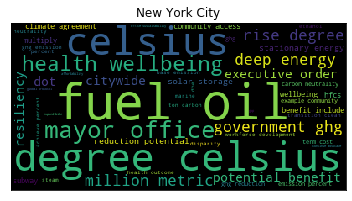

In [507]:
def plot_wordcloud(city, ax):
    top_terms = city_specific_keywords[city]
    tt = {row['term']: row['score'] for _, row in top_terms.head(50).iterrows()}
    wc = WordCloud().generate_from_frequencies(tt)
    ax.imshow(wc)
    ax.set_title(city)
    ax.set_xticks([])
    ax.set_yticks([])
    
fig, ax = plt.subplots()
plot_wordcloud('New York City', ax=ax)

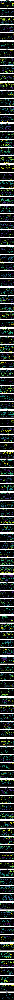

In [508]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(city_specific_keywords), figsize=(10, len(city_specific_keywords)*5))

for city, ax in zip(city_specific_keywords, axes):
    plot_wordcloud(city, ax)
plt.savefig('all_wordclouds.png')

In [509]:
city_specific_keywords

{'Abasan Al-Kabira':                 term     score
 0     ongoing action  0.084101
 1              annex  0.082352
 2           tertiary  0.082352
 3                com  0.081218
 4                mwh  0.075370
 ...              ...       ...
 1194     opportunity  0.009657
 1195         process  0.009657
 1196          create  0.009501
 1197           waste  0.009501
 1198         achieve  0.009424
 
 [1199 rows x 2 columns],
 'Adelaide':                   term     score
 0            australia  0.082463
 1                ongoe  0.062180
 2     state government  0.056034
 3                 tram  0.054651
 4       carbon neutral  0.052449
 ...                ...       ...
 2753          specific  0.005637
 2754              step  0.005637
 2755             cover  0.005591
 2756            social  0.005591
 2757          possible  0.005545
 
 [2758 rows x 2 columns],
 'Alameda':                     term     score
 0              shoreline  0.052338
 1            water level  0.049998
 

In [510]:
# city_specific_vectors = {city: np.array([nlp(kw).vector for kw in city_specific_keywords[city]['term']]).mean(axis=1)
#                          for city in city_specific_keywords}
# city_specific_vectors

## Word2vec graph viz

In [511]:
!pip install pyvis

In [512]:
# from pyvis.network import Network

# net = Network()
# for i, row in inp_data.iterrows():
#     net.add_node(i, label=row['city_name'])

In [513]:
inp_data['doc_vec'] = inp_data['doc'].progress_apply(lambda d: d.vector)

100%|██████████| 122/122 [00:22<00:00,  5.35it/s]


## Visualize Document Level Similarities

In [514]:
from sklearn.metrics.pairwise import cosine_similarity

doc_sims = cosine_similarity(np.stack(inp_data['doc_vec']))

In [515]:
# corr_data = []

# for i, city in enumerate(inp_data['city_name']):
#     for j, city2 in enumerate(inp_data['city_name']):
#         if j > i:
#             corr_data.append([city, city2, doc_sims[i, j]])
            
# corr_data

In [516]:
import pygraphviz

In [517]:
norm_sims = (doc_sims - doc_sims.mean()) / doc_sims.std()

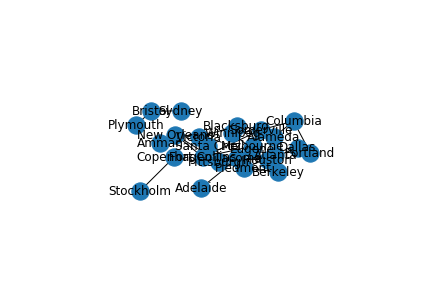

In [518]:
import networkx as nx

G = nx.from_numpy_array(doc_sims**100)
G = nx.relabel_nodes(G, dict(zip(range(len(G.nodes())),inp_data['city_name'])))    
sim_thresh = 0.7
subG = G.edge_subgraph([(u, v) for u, v, data in G.edges(data=True) 
                        if data['weight'] > sim_thresh and u!=v])
#subG.edges(data=True)
nx.draw(subG, with_labels=True, pos=nx.layout.spring_layout(G, weight='weight', k=0.05))
plt.show()

In [519]:
from sklearn.metrics.pairwise import cosine_distances

dists = cosine_distances(np.stack(inp_data['doc_vec']))

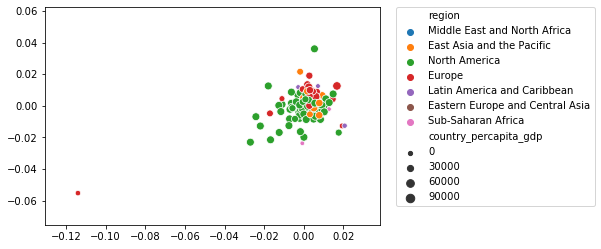

In [520]:
from sklearn.manifold import MDS
import seaborn as sns

mds = MDS( dissimilarity='precomputed')
mds_x = mds.fit_transform(dists)
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'], size=inp_data['country_percapita_gdp'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

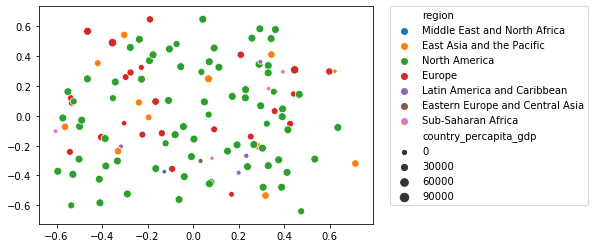

In [521]:
from sklearn.manifold import MDS
import seaborn as sns

mds = MDS( dissimilarity='precomputed', metric=False)
mds_x = mds.fit_transform(dists)
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'], size=inp_data['country_percapita_gdp'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Tf-idf based similarity

In [522]:
normalized_x2g.A

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.02734985, 0.0066607 , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.02684447, 0.01588302, ..., 0.01411086, 0.00915922,
        0.        ],
       ...,
       [0.02698981, 0.01259271, 0.01255381, ..., 0.01666193, 0.        ,
        0.        ],
       [0.        , 0.01276209, 0.01368835, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.01163355, ..., 0.        , 0.        ,
        0.        ]])

In [523]:
std_norm_2g = (normalized_x2g - normalized_x2g.mean(axis=0)) / normalized_x2g.A.std(axis=0)

In [524]:
inp_data[inp_data['city_name'] == 'San Carlos']

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,...,lng,region,baseline_emissions,baseline_year,density,country_percapita_gdp,netzero_target,tokens,lemmatized_tokens,doc_vec
97,OCTOBER 2009\nExecutive Summary\n\nCity of\n\n...,San Carlos,"(OCTOBER, 2009, \n, Executive, Summary, \n\n, ...",City,Philippines,PHL,NaN,NaN,NaN,NaN,...,NaN,East Asia and the Pacific,NaN,NaN,NaN,3485.1,False,"[OCTOBER, Executive, Summary, Climate, Action,...","[october, executive, summary, climate, action,...","[-0.07207145, 0.17915326, -0.05573616, -0.0620..."


In [525]:
inp_data

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,...,lng,region,baseline_emissions,baseline_year,density,country_percapita_gdp,netzero_target,tokens,lemmatized_tokens,doc_vec
0,Sustainable Energy Action\nPlan of Abasan Al-K...,Abasan Al-Kabira,"(Sustainable, Energy, Action, \n, Plan, of, Ab...",City,Palestine,PSE,NaN,NaN,NaN,NaN,...,NaN,Middle East and North Africa,NaN,NaN,NaN,NaN,False,"[Sustainable, Energy, Action, Plan, Aug, Date,...","[sustainable, energy, action, plan, aug, date,...","[-0.049449984, 0.14977002, -0.025678888, -0.04..."
1,CARBON\nNEUTRAL\nADELAIDE\n\nAction Plan 2016–...,Adelaide,"(CARBON, \n, NEUTRAL, \n, ADELAIDE, \n\n, Acti...",City,Australia,AUS,23916.0,3257.700000,South Australia,NaN,...,138.601111,East Asia and the Pacific,NaN,NaN,7.341376,54907.1,True,"[CARBON, NEUTRAL, Action, Plan, the, State, Go...","[carbon, neutral, action, plan, the, state, go...","[-0.029648436, 0.15775232, -0.03418764, -0.066..."
2,ALAMEDA\nClimate Action and\nResiliency Plan (...,Alameda,"(ALAMEDA, \n, Climate, Action, and, \n, Resili...",City,United States,USA,78906.0,27.039496,California,"Alameda County, CA",...,-122.274444,North America,367294.0,2005.0,2918.175737,65118.4,False,"[Climate, Action, and, Resiliency, Plan, CARP,...","[climate, action, and, resiliency, plan, carp,...","[-0.04445316941804743, 0.1448957741092701, -0...."
3,CITY OF ALBANY\n\nIssued January 2015\n\n Tabl...,Albany,"(CITY, OF, ALBANY, \n\n, Issued, January, 2015...",City,United States,USA,98566.0,55.399886,New York State,"Albany County, NY",...,-73.754968,North America,NaN,NaN,1779.173333,65118.4,True,"[Issued, January, Table, Contents, Introductio...","[issue, january, table, contents, introduction...","[-0.037597988, 0.13672262, -0.024277546, -0.07..."
4,Ministry of Environment\n\nTHE\n\nAMMAN\nCLIMA...,Amman,"(Ministry, of, Environment, \n\n, THE, \n\n, A...",City,Jordan,JOR,3800000.0,1680.000000,Amman Governorate,NaN,...,35.928400,Middle East and North Africa,7400000.0,2014.0,2261.904762,4330.3,True,"[Ministry, Environment, THE, CLIMATE, PLAN, VI...","[ministry, environment, the, climate, plan, vi...","[-0.040363736, 0.13641544, -0.043127492, -0.06..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119,CITY OF VICTORIA\nCLIMATE LEADERSHIP PLAN\nStr...,Victoria,"(CITY, OF, VICTORIA, \n, CLIMATE, LEADERSHIP, ...",City,Canada,CAN,85792.0,NaN,NaN,NaN,...,-123.366000,North America,412875.0,2007.0,NaN,46194.7,True,"[CLIMATE, LEADERSHIP, PLAN, Strategies, and, a...","[climate, leadership, plan, strategy, and, act...","[-0.04791677, 0.1565142, -0.053523567, -0.0689..."
120,CLEAN ENERGY DC\nTHE DISTRICT OF COLUMBIA CLIM...,Washington D.C.,"(CLEAN, ENERGY, DC, \n, THE, DISTRICT, OF, COL...",City,United States,USA,693972.0,158.118900,NaN,United States,...,-77.016390,North America,NaN,NaN,4388.925043,65118.4,True,"[CLEAN, ENERGY, THE, DISTRICT, CLIMATE, AND, E...","[clean, energy, the, district, climate, and, e...","[-0.053291623, 0.15436308, -0.036938, -0.04218..."
121,Winnipeg’s Climate Action Plan\n1.1\n\nPlannin...,Winnipeg,"(Winnipeg, ’s, Climate, Action, Plan, \n, 1.1,...",City,Canada,CAN,749500.0,464.080000,Manitoba,Winnipeg Metro Region,...,-97.137500,North America,5379024.0,2011.0,1615.023272,46194.7,True,"[Climate, Action, Plan, Planning, for, Climate...","[climate, action, plan, plan, for, climate, ch...","[-0.022641539382791093, 0.14016287620560422, -..."
122,Wollongong City Council Draft Climate Change ...,Wollongong,"( , Wollongong, City, Council, Draft, Climate,...",City,Australia,AUS,208875.0,572.200000,New South Wales,Illawarra,...,150.883100,East Asia and the Pacific,NaN,NaN,365.038448,54907.1,True,"[Council, Draft, Climate, Change, Mitigation, ...","[council, draft, climate, change, mitigation, ...","[-0.026073791, 0.14556858, -0.04888286, -0.055..."


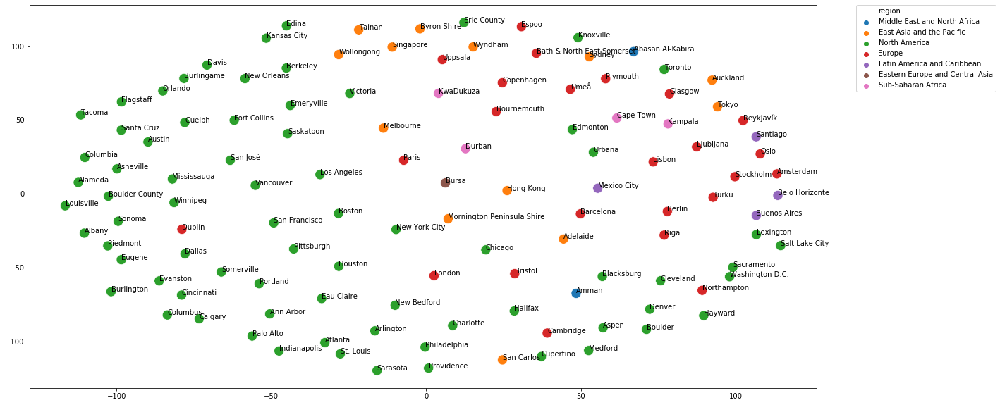

In [526]:
from sklearn.metrics.pairwise import euclidean_distances

euc_dists = euclidean_distances(std_norm_2g)
mds = MDS( dissimilarity='precomputed', random_state=10)
mds_x = mds.fit_transform(euc_dists)
fig, ax =plt.subplots(figsize=(20, 10))
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'],s=200)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for  point, city in zip(mds_x, inp_data['city_name']):
    ax.text(point[0]+.02, point[1]+0.02, str(city))

In [527]:
inp_data[inp_data['city_name'] == 'Victoria']

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,...,lng,region,baseline_emissions,baseline_year,density,country_percapita_gdp,netzero_target,tokens,lemmatized_tokens,doc_vec
119,CITY OF VICTORIA\nCLIMATE LEADERSHIP PLAN\nStr...,Victoria,"(CITY, OF, VICTORIA, \n, CLIMATE, LEADERSHIP, ...",City,Canada,CAN,85792.0,NaN,NaN,NaN,...,-123.366,North America,412875.0,2007.0,NaN,46194.7,True,"[CLIMATE, LEADERSHIP, PLAN, Strategies, and, a...","[climate, leadership, plan, strategy, and, act...","[-0.04791677, 0.1565142, -0.053523567, -0.0689..."


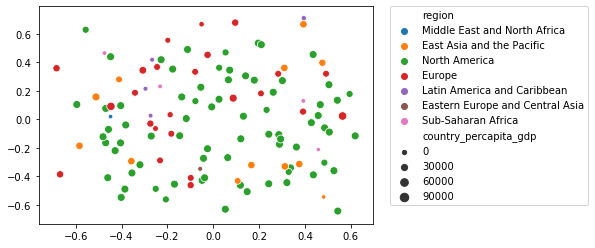

In [528]:
from sklearn.metrics.pairwise import euclidean_distances

euc_dists = euclidean_distances(std_norm_2g)
mds = MDS( dissimilarity='precomputed', metric=False)
mds_x = mds.fit_transform(euc_dists)
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'], size=inp_data['country_percapita_gdp'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

In [529]:
all_keywords = {'term': [], 'city': [], 'score': []}
for city in city_specific_keywords:
    city_terms = city_specific_keywords[city].reset_index()
    all_keywords['term'] += city_terms['term'].tolist()
    all_keywords['score'] += city_terms['score'].tolist()
    all_keywords['city'] += len(city_terms) * [city]
all_keywords = pd.DataFrame(all_keywords)
all_keywords

,term,city,score
0,ongoing action,Abasan Al-Kabira,0.084101
1,annex,Abasan Al-Kabira,0.082352
2,tertiary,Abasan Al-Kabira,0.082352
3,com,Abasan Al-Kabira,0.081218
4,mwh,Abasan Al-Kabira,0.075370
...,...,...,...
332247,natural,Wyndham,0.009222
332248,people,Wyndham,0.009222
332249,land,Wyndham,0.009148
332250,way,Wyndham,0.009148


In [530]:
keyword_set = list(set(all_keywords['term']))
len(keyword_set)

10796

In [531]:
import spacy

nlp = spacy.load('en_core_web_md')

keyword_vec = [nlp(kw).vector for kw in tqdm(keyword_set)]

100%|██████████| 10796/10796 [01:10<00:00, 153.44it/s]


In [532]:
x_2g

<122x10796 sparse matrix of type '<class 'numpy.int64'>'
	with 332252 stored elements in Compressed Sparse Row format>

In [533]:
import numpy as np

keyword_vec = np.array(keyword_vec)
keyword_vec

array([[-0.059596  ,  0.038195  ,  0.12648   , ...,  0.071631  ,
         0.29954   ,  0.042393  ],
       [-0.31946   ,  0.35569   , -0.033335  , ..., -0.300565  ,
         0.107645  ,  0.216929  ],
       [ 0.084518  ,  0.548696  , -0.45943502, ..., -0.1876835 ,
         0.19606   , -0.056987  ],
       ...,
       [ 0.074325  ,  0.2564005 ,  0.39131972, ...,  0.0533195 ,
        -0.19836   ,  0.28486001],
       [ 0.00307   ,  0.47377998,  0.145155  , ..., -0.05471001,
         0.01786   , -0.17981915],
       [-0.33192   ,  0.36152   , -0.32249   , ..., -0.29349   ,
         0.22      , -0.15264   ]], dtype=float32)

In [534]:
# from sklearn.cluster import DBSCAN
# from sklearn.metrics import silhouette_score

# dbscan = DBSCAN(metric='cosine')
# clusters = dbscan.fit_predict(keyword_vec)
# print(silhouette_score(keyword_vec, clusters, metric='cosine'))

In [535]:
# from sklearn.metrics.pairwise import cosine_distances

# kw_distances = cosine_distances(keyword_vec)

In [536]:
# from sklearn.cluster import AgglomerativeClustering
# from tqdm import tqdm

# results = []
# for threshold in tqdm(np.arange(0.05, 1, 0.01)):
#     cluster = AgglomerativeClustering(affinity='precomputed', distance_threshold=threshold, n_clusters=None, linkage='complete')
#     labels = cluster.fit_predict(kw_distances)
#     score = silhouette_score(keyword_vec, labels, metric='cosine')
#     results.append((score, threshold))
    
# results = pd.DataFrame(results, columns=['score', 'threshold']).set_index('threshold')
# results.plot()

In [537]:
# threshold = results.sort_values('score', ascending=False).index[0]
# threshold

In [538]:
# cluster = AgglomerativeClustering(
#     affinity='precomputed', distance_threshold=0.8, n_clusters=None, linkage='complete')
# labels = cluster.fit_predict(kw_distances)
# cluster.n_clusters_

In [539]:
#term2cluster = {term: label for term, label in zip(keyword_set, labels)}

In [540]:
# all_keywords['term_cluster'] = all_keywords['term'].apply(lambda c: term2cluster[c])
# all_keywords['term_cluster'].value_counts().plot.bar()

In [541]:
# df = pd.DataFrame({'labels': labels, 'terms':keyword_set}).sort_values('labels')

In [542]:
# cluster_scores = all_keywords.groupby('term_cluster').aggregate({
#     'city': lambda cities: len(cities.unique()),
#     'score': lambda scores: sum(scores)
# })
# relevant_clusters = cluster_scores[(cluster_scores['city'] > 10) & (cluster_scores['score'] > 1)]
# print(len(relevant_clusters))

In [543]:
# clusteridx2featidx = {k: v for v,k in relevant_clusters.reset_index()['term_cluster'].to_dict().items()}

In [544]:
# for i, (cluster, data) in enumerate(relevant_clusters.sort_values(['score', 'city'], ascending=False).iterrows()):
#     print(df[df['labels'] == cluster]['terms'].tolist())

In [545]:
# for i, (cluster, data) in enumerate(relevant_clusters.sort_values(['score', 'city'], ascending=False).iterrows()):
#     print(df[df['labels'] == cluster]['terms'].tolist())

In [546]:
# relevant_keywords = all_keywords[all_keywords['term_cluster'].isin(relevant_clusters.index)]
# relevant_keywords

In [547]:
s = [
    ['reducing', 'low', 'lower', 'considerable', 'decreased', 'excessive', 'high', 'increased', 'elevated', 'significant', 'reduced', 'reduce', 'minimal', 'levels', 'reductions', 'excess', 'increase', 'substantial', 'higher', 'level', 'decrease', 'reduction'],
['wind', 'turbine', 'kwh', 'electrification', 'electricty', 'voltaic', 'energy', 'megawatt', 'electricity', 'solar', 'photovoltaic', 'energies', 'photovoltaics', 'generating', 'generator', 'hydro', 'kilowatt', 'generate'],
['dioxide', 'gases', 'emissions', 'carbon', 'sequestration', 'biochar', 'greenhouse', 'footprints', 'fossil', 'footprint', 'methane', 'emission', 'floorspace', 'aquaponic', 'fossile'],
['plans', 'plan', 'visioning', 'projects', 'program', 'blueprint', 'programme', 'programmes', 'project', 'planning', 'programs', 'planner'],
['sectors', 'sector', 'business', 'marketplace', 'multinational', 'profitable', 'private', 'public', 'busines', 'businesses', 'corporations', 'consumer', 'industries', 'sectoral', 'subsector', 'industry', 'corporate', 'market'],
['role', 'roles', 'responsibility', 'action', 'involvement', 'acting', 'actions', 'act', 'involved', 'responsible'],
['-pron-'],
['build', 'renovation', 'builders', 'architecture', 'homebuilder', 'construction', 'builder', 'demolition', 'buildings', 'renovator', 'built', 'architect', 'architectural', 'building', 'architects'],
['pesticide', 'landfills', 'ecological', 'incinerator', 'contamination', 'chemical', 'smog', 'polluting', 'incineration', 'disposal', 'deforestation', 'sludge', 'environmental', 'contaminating', 'nonpoint', 'biowaste', 'waster', 'effluent', 'additive', 'ozone', 'groundwater', 'dispose', 'contaminated', 'contaminate', 'landfill', 'toxics', 'waste', 'decontaminate', 'pollution', 'polluter', 'contaminant', 'pollutant'],
['workable', 'alternative', 'greening', 'alternatives', 'implementable', 'biomass', 'hydropower', 'sustainably', 'cogeneration', 'sustainable', 'permaculture', 'feasible', 'biofuels', 'viable', 'hydroelectricity', 'cleantech', 'livable', 'geothermal', 'dispatchable', 'renewable', 'achievable', 'environmentally', 'renewables', 'biogas', 'liveable', 'bioenergy', 'sustainability', 'practicable', 'nonrenewable'],
['similar', 'common', 'associated', 'based', 'development', 'studies', 'particular', 'multidisciplinary', 'develop', 'developing', 'general', 'research', 'study', 'developed', 'related', 'basis', 'comparative', 'pediatric', 'certain'],
['diesel', 'fuel', 'petrol', 'liquefied', 'powered', 'motor', 'powering', 'gas', 'unleaded', 'electric', 'propane', 'kerosene', 'motors', 'gasoline', 'propulsion'],
['entergy', 'westchester', 'brt', 'galveston', 'staunton', 'ctr', 'wasatch', 'colonie', 'moines', 'delaware', 'willamette', 'woodbury', 'roxbury', 'maplewood', 'puyallup', 'champaign', 'puget', 'huron', 'marriott', 'bastrop', 'catawba', 'wilmington', 'sask', 'cumberland', 'milford', 'kentucky', 'saratoga', 'miami', 'scioto', 'aaa', 'alexandria', 'vancity', 'caltrans', 'fairmount', 'ohio', 'dorchester', 'roslindale', 'missouri', 'eap', 'carolina', 'kitsilano', 'kaiser', 'ottawa', 'breckenridge', 'champlain', 'coconino', 'washigton', 'dfw', 'peachtree', 'appalachian', 'intermountain', 'massachusetts', 'waterloo', 'slc', 'athabasca', 'fargo', 'newbury', 'skokie', 'hampshire', 'alabama', 'minnesota', 'chattahoochee', 'saskatchewan', 'utah', 'vallejo', 'kcmo', 'hendersonville', 'metra', 'angelos', 'nepean', 'montgomery', 'duquesne', 'lafayette', 'ypsilanti', 'chippewa', 'watsonville', 'nevada', 'bradenton', 'mcmurray', 'avon', 'payette', 'dundas', 'onondaga', 'virginia', 'georgia', 'millbrae', 'strathcona', 'alaska', 'danbury', 'halton', 'edison', 'hartwell', 'alberta', 'cotati', 'belmont', 'niagara', 'fairhaven', 'rancho', 'vincennes', 'pdx', 'dupage', 'brookings', 'solano', 'sault', 'rmv', 'acadia', 'washtenaw', 'colorado', 'pontchartrain', 'ccc', 'chp', 'minneapolis', 'hoosier', 'keystone', 'springfield', 'banff', 'atascocita', 'buncombe', 'riverside', 'arizona', 'windsor', 'michigan', 'dalhousie', 'suny', 'sunnyside', 'salisbury', 'raleigh', 'syracuse', 'fema', 'rochester', 'brunswick', 'loudoun', 'yonkers', 'charlestown', 'marion', 'indiana', 'vermont', 'maricopa', 'clermont', 'woburn', 'suffolk', 'nola', 'petaluma', 'kona', 'alaskan', 'amherst', 'pennsylvania', 'enfield', 'petersburg', 'westminster', 'peabody', 'wisconsin', 'toledo', 'carleton', 'wingate', 'cic', 'everett', 'longmont', 'platte', 'caledon', 'richmond', 'hampton', 'brookline', 'nys', 'illinois', 'scotia', 'healdsburg', 'pittsfield', 'florida', 'acadian', 'hennepin', 'carolinas', 'quebec', 'mecklenburg', 'dc', 'texas', 'genesee', 'oakland', 'harrisburg', 'welland', 'rohnert', 'ontario', 'mississippi', 'txdot', 'icbc', 'rhode', 'multnomah', 'mchenry', 'gilroy', 'moana', 'dnr', 'cdl'],
['exactly', 'actual', 'form', 'used', 'correct', 'use', 'proper', 'type', 'exact'],
['underserved', 'communities', 'diversity', 'mainstream', 'cultural', 'culture', 'community', 'media'],
['enhance', 'beautify', 'improve', 'optimize', 'augment', 'utilisation', 'flexibility', 'maximise', 'ease', 'enhancing', 'heighten', 'utilization', 'enrich', 'efficiency', 'maximize', 'optimal', 'optimum', 'optimise', 'efficient'],
['passenger', 'transport', 'carriers', 'transporter', 'occupant', 'carrier', 'transit', 'cargo', 'transports', 'transportation'],
['services', 'customer', 'offering', 'offer', 'provide', 'service', 'deliver', 'provider'],
['achieved', 'objectives', 'aim', 'achieve', 'achieving', 'consistent', 'strategies', 'consistently', 'successful', 'proven', 'objective', 'effective', 'success', 'effectiveness', 'strategy', 'strategic', 'succeed'],
['status', 'changes', 'change', 'changed'],
['realtors', 'property', 'real', 'estates', 'realty', 'residential', 'properties', 'housing', 'multifamily', 'house', 'estate', 'nonresidential', 'homes', 'residental', 'relocation', 'home'],
['muncipal', 'province', 'districts', 'capitol', 'precinct', 'provincial', 'governorate', 'capital', 'municipal', 'capitals', 'district', 'municipally', 'provincially', 'municipality', 'municipalities'],
['displace', 'attributable', 'harmful', 'adversely', 'harm', 'detrimental', 'prone', 'impact', 'cause', 'mitigate', 'transboundary', 'elevate', 'abate', 'mitigation', 'impacted', 'worsen', 'occur', 'affect', 'remediate', 'diminish', 'susceptibility', 'affected', 'impacts', 'avert', 'occurrence', 'occurence', 'damage', 'attenuate', 'amplify', 'deplete', 'susceptible'],
['toolkit', 'integrate', 'deployment', 'implementing', 'integrated', 'deploy', 'implementation', 'roadmap', 'deploying', 'implement', 'framework', 'integration'],
['total', 'annum', 'net', 'percentage', 'gross', 'percent', 'cent'],
['infrastructure', 'enterprises', 'entrepreneurial', 'innovate', 'entrepreneurialism', 'cloud', 'innovation', 'solution', 'technology', 'digitalization', 'innovations', 'technologies', 'solutions', 'infrastructures', 'modernization', 'entrepreneurship', 'technological', 'commercialisation', 'enterprise'],
['walkability', 'neighborhoods', 'bikeable', 'slum', 'cities', 'neighborhood', 'sprawl', 'neighbourhood', 'populated', 'conurbation', 'urban', 'walkable', 'neighbourhoods', 'suburban', 'towns', 'town', 'urbanized', 'rural', 'inhabitant', 'populate', 'suburb', 'gentrification', 'urbanization', 'city', 'metropolis'],
['governmental', 'govern', 'deregulated', 'regulator', 'ancillary', 'regulatory', 'rules', 'bylaws', 'rule', 'federal', 'state', 'jurisdiction', 'statute', 'harmonization', 'regulation', 'nongovernment', 'juris', 'authority', 'statutory', 'states', 'regulate', 'government', 'enforcement', 'intergovernmental', 'governments', 'regulated', 'jurisdictional', 'provision'],
['retrain', 'inquire', 'need', 'able', 'try', 'educate', 'sensitize', 'motivate', 'empower', 'want', 'mobilize', 'persuade', 'enlist', 'incent', 'let', 'ask', 'urge', 'inspire', 'nurture', 'energise', 'encourage', 'instill', 'tell', 'hesitate'],
['pool', 'water', 'arboretum', 'backyard', 'outdoors', 'gardener', 'botanic', 'gardens', 'indoor', 'garden', 'botanical', 'seawater', 'potable', 'swimming', 'gardening', 'ornamental', 'cascading', 'parkland', 'backyards', 'outdoor', 'cascade', 'fountain', 'pond', 'landscaped', 'pergola'],
['fine', 'decent', 'make', 'mind', 'ways', 'sort', 'feel', 'easier', 'making', 'plenty', 'kind', 'far', 'feeling', 'thing', 'doing', 'longer', 'better', 'way', 'instead', 'like', 'stuff', 'sense', 'allot', 'little', 'look', 'lot', 'bit', 'idea'],
['nonprofit', 'organisation', 'representatives', 'established', 'association', 'delegation', 'organizations', 'stakeholders', 'associations', 'organization', 'groundwork', 'establishment', 'ambassadors', 'national', 'regional', 'establish', 'representative'],
['funds', 'efforts', 'initiatives', 'initiative', 'campaign', 'raising', 'raise', 'funding', 'effort', 'donor', 'fund', 'spearhead', 'funded'],
['previous', 'days', 'recent', 'year', 'month', 'week', 'past', 'decade', 'day', 'ago'],
['appropriate', 'relevant', 'guidelines', 'requirement', 'specific', 'prerequisite', 'extent', 'determination', 'relation', 'necessary', 'guideline', 'speciﬁc', 'determined', 'apply', 'requirements', 'criteria', 'determine', 'require', 'disposition', 'ascertain', 'respect', 'criterion', 'required'],
['premium', 'features', 'signature', 'addition', 'feature', 'exclusive', 'include'],
['locally', 'local', 'statewide', 'citywide', 'serving', 'regionally', 'nationwide', 'serve'],
['suv', 'mileage', 'vehicle', 'automobile', 'mpg', 'cars', 'motorhome', 'ute', 'phev', 'vehicles', 'minivan', 'car', 'automaker'],
['spending', 'budget', 'expensive', 'costing', 'cost', 'costly', 'spend', 'budgeting', 'costs'],
['nominal', 'relative', 'offsetting', 'yield', 'equivalency', 'comparable', 'value', 'surpass', 'values', 'offsets', 'difference', 'exceed', 'equivalent', 'ratio', 'offset', 'maximum', 'zero', 'equal', 'minimum'],
['operation', 'amenities', 'onsite', 'operational', 'operating', 'operate', 'operations', 'units', 'unit', 'auxiliary', 'facility', 'facilities'],
['internal', 'externally', 'internally', 'support', 'core', 'supported', 'embed', 'platform', 'external'],
['managing', 'staff', 'managerial', 'supervise', 'supervision', 'mgmt', 'administrator', 'managers', 'administration', 'administrative', 'personnel', 'planners', 'management', 'manage'],
['lpg', 'aquarium', 'ghg', 'tank'],
['neighbouring', 'regions', 'neighboring', 'region', 'boundary', 'surrounding', 'outlying', 'area', 'border', 'areas'],
['enact', 'proposal', 'legislature', 'legislative', 'earmark', 'legislate', 'promulgate', 'legislation', 'reforming', 'amendment', 'amend', 'mandate', 'policy', 'reform', 'codify', 'enactment', 'agenda', 'proposed', 'deregulation', 'propose', 'modernisation'],
['nearly', 'totally', 'works', 'working', 'work', 'virtually', 'completely', 'entirely', 'technically'],
['pasture', 'husbandry', 'farms', 'landholder', 'forestry', 'acreage', 'aquaculture', 'parcel', 'farmland', 'farmers', 'agriculture', 'rangeland', 'acre', 'land', 'cattle', 'grower', 'landowner', 'irrigation', 'farmer', 'farm', 'agricultural', 'horticultural', 'livelihood', 'orchard', 'lands', 'cropland', 'agroforestry', 'homestead', 'hectare', 'arable', 'livestock', 'farming', 'frontage'],
['floodwater', 'snowfall', 'levee', 'rainstorm', 'snowmelt', 'downpour', 'flood', 'tornado', 'hail', 'microburst', 'inundated', 'weather', 'katrina', 'rainfall', 'rain', 'hurricane', 'siltation', 'storm', 'forecast', 'snowstorm', 'typhoon', 'snow', 'cyclone', 'flooding', 'blizzard', 'inundate', 'inundation'],
['goal', 'team', 'goals', 'squad', 'coach', 'teams', 'scoresheet'],
['coloured', 'pink', 'orange', 'green', 'red', 'black', 'colored', 'gray', 'brown', 'purple', 'blue', 'color', 'white', 'grey'],
['ensure', 'affordability', 'satisfied', 'guarantee', 'operability', 'highest', 'genuine', 'ensured', 'reliable', 'quality', 'guaranteeing', 'satisfaction', 'assurance', 'exceptional', 'outstanding', 'assure', 'reliability'],
['just', 'going', 'matter', 'excuse', 'say', 'probably', 'attention', 'apparent', 'simply', 'realize', 'thought', 'prove', 'despite', 'consider', 'reason', 'chance', 'think', 'unless', 'mention', 'regardless', 'thinking', 'assume', 'clearly', 'imagine', 'surprise', 'wrong', 'spite', 'actually', 'lack', 'sure', 'believe', 'aware', 'fact', 'doubt', 'moment', 'convinced', 'know', 'opinion', 'mean', 'maybe', 'wonder', 'mistake', 'setback'],
['mmt', 'measure', 'measured', 'analytics', 'measuring', 'yardstick', 'kpi', 'calibration', 'measurement', 'scorecard', 'metric', 'measures', 'metrics'],
['dividend', 'diversification', 'stock', 'invest', 'investment', 'shareholder', 'securities', 'hedge', 'investor', 'equities', 'portfolio', 'equity', 'asset', 'assets'],
['priority', 'minimisation', 'governance', 'consultative', 'priorities', 'prioritized', 'reprioritize', 'communitywide', 'stakeholder', 'prioritize', 'prioritization', 'organisational', 'taskforce', 'participatory', 'preventative', 'policymaking', 'accountability', 'preventive', 'prevention', 'prioritise', 'proactively'],
['creation', 'designers', 'create', 'creating', 'designer', 'designs', 'design'],
['developments', 'emerge', 'forefront', 'groundbreaking', 'breakthrough', 'unprecedented', 'emergence', 'progress', 'nascent', 'future', 'emergent', 'emerging'],
['dedicated', 'expertise', 'extensive', 'resource', 'technical', 'experts', 'specialist', 'comprehensive', 'resources', 'expert'],
['outpace', 'average', 'decline', 'forecasts', 'quartile', 'percentile', 'growth', 'median', 'midpoint', 'margin', 'totals', 'estimated', 'estimate', 'marginal', 'rates', 'rate'],
['bolster', 'publicize', 'engagement', 'reinforce', 'engaging', 'promote', 'strengthen', 'deepen', 'promoting', 'actively', 'strengthening', 'engage'],
['riverine', 'estuary', 'coastal', 'inland', 'sandy', 'cove', 'shoreline', 'seaport', 'coasts', 'harbour', 'brackish', 'gulf', 'coast', 'shore', 'lighthouse', 'shorelines', 'wharf', 'lagoon', 'ashore', 'offshore', 'beach', 'ocean', 'coastline', 'strait', 'waters', 'seaside', 'marina', 'bay', 'reef', 'seashore', 'sea', 'beaches', 'pier', 'harbor'],
['murphey', 'neff', 'wiggins', 'donnelly', 'schwarzenegger', 'donald', 'harris', 'palmer', 'rasmussen', 'warren', 'wolfgang', 'carlton', 'lyons', 'gilbert', 'sherwin', 'schroeder', 'phillips', 'buchanan', 'fyfe', 'rowan', 'meyers', 'joseph', 'carlisle', 'hoffman', 'humphrey', 'whyte', 'morrill', 'stewart', 'edmund', 'bernstein', 'henry', 'newman', 'wright', 'robert', 'whitaker', 'burks', 'hesse', 'stanley', 'fraser', 'stillman', 'wilson', 'denise', 'powell', 'raymond', 'robson', 'hebert', 'pullman', 'gordon', 'briar', 'benjamin', 'daley', 'glade', 'larsen', 'joyce', 'grove', 'phillip', 'beattie', 'hollis', 'clarke', 'calvert', 'ballard', 'laurel', 'goss', 'moore', 'patton', 'ronald', 'posey', 'tamiami', 'murphy', 'harvey', 'coe', 'morton', 'edwards', 'munson', 'hudson', 'yates', 'scotts', 'alston', 'mitchell', 'mccormick', 'doolittle', 'cooke', 'johnson', 'lewis', 'currie', 'hearn', 'bennett', 'elmore', 'hawthorne', 'brent', 'morris', 'hugh', 'johnston', 'terrance', 'oliver', 'thompson', 'peterson', 'lawrence', 'henrietta', 'hadley', 'swanson', 'masson', 'robertson', 'thomas', 'sheehan', 'mueller', 'williamson', 'osgood', 'richard', 'bartlett', 'aquinas', 'cindy', 'pirie', 'adams', 'barrett', 'dunlop', 'burnett', 'walter', 'owen', 'carr', 'freeman', 'chamberlain', 'reynolds', 'babcock', 'greenbaum', 'chapman', 'brandt', 'hobbs', 'smith', 'boyer', 'melisa', 'carrington', 'clark', 'wentworth', 'hughes', 'proctor', 'norman', 'doyle', 'robinson', 'francis', 'jennings', 'henderson', 'wilcox', 'haas', 'stevens', 'anderson', 'highland', 'rockefeller', 'dennis', 'adrian', 'fitzgerald', 'alonzo', 'woodruff', 'christopher', 'williams', 'xavier', 'barnes', 'byrd', 'albert', 'sheridan', 'evans', 'hamilton', 'haywood', 'goldman', 'billingsley', 'doug', 'crosby', 'mccauley', 'charles', 'werner', 'donovan', 'hazen', 'sullivan', 'wesley', 'todd', 'kendall', 'weller', 'derek', 'winchester', 'edwin', 'hanlon', 'teo', 'holt', 'mckenna', 'blair', 'godfrey', 'morgan', 'nelson', 'macarthur', 'mccarty', 'baxter', 'weber', 'howard', 'richards', 'roberts', 'britt', 'katz', 'wyman', 'ridgeway', 'bruce', 'william', 'sylvester', 'carney', 'garvey', 'murdock', 'gerald', 'anthony', 'miller', 'griggs', 'hinkle', 'libby', 'mather', 'dene', 'dooley'],
['obtain', 'receive', 'order', 'aid', 'procure', 'assistance', 'advance', 'help', 'assist'],
['ridesharing', 'carpool', 'commuters', 'ridership', 'commuter', 'route', 'routes', 'carsharing', 'road', 'telecommuting', 'intracity', 'traffic', 'mbta', 'rideshare', 'carpooling', 'vanpool', 'intercity', 'streetcar', 'commute', 'superhighway', 'commuting', 'roads', 'highways'],
['targeted', 'target', 'inbound', 'targets'],
['principle', 'concepts', 'concept', 'context', 'perspectives', 'socioeconomic', 'societal', 'intellectual', 'approaches', 'approach', 'generational', 'institutionalization', 'ethical', 'perspective', 'foundational', 'social', 'fundamental', 'moral', 'intergenerational', 'socio', 'principles', 'practical', 'paradigm', 'pragmatic', 'society'],
['fauna', 'pollinator', 'invasive', 'stewardship', 'endemic', 'vegetation', 'specie', 'wetlands', 'floodplain', 'aquatic', 'plover', 'riparian', 'phenology', 'grassland', 'upland', 'species', 'hydrologic', 'habitat', 'conservation', 'wildlife', 'fisheries', 'prairie', 'reforestation', 'biodiversity', 'flora', 'conservancy', 'reintroduction', 'intertidal', 'wetland', 'seagrass'],
['possible', 'possibility', 'potential', 'expect', 'promise', 'expected', 'potentially', 'unlikely', 'eventual', 'destine', 'promising', 'likely', 'inevitable'],
['foods', 'vegetarian', 'healthier', 'foodstuff', 'nutritious', 'food', 'healthy', 'eater'],
['entirety', 'thereof', 'arise', 'collectively', 'shall', 'constitute', 'exist', 'aforesaid', 'cease', 'forth'],
['economic', 'stimulus', 'recession', 'fiscal', 'competitiveness', 'crisis', 'deficit', 'economy', 'industrialize', 'industrialisation', 'macroeconomic'],
['proximity', 'center', 'located', 'adjacent', 'centre', 'centres', 'contiguous', 'near', 'distance', 'centers', 'location', 'nearby', 'hotspots', 'central'],
['installations', 'upgrade', 'upgraded', 'installation', 'reinstall', 'retrofitting', 'retrofit', 'retrofits', 'instal', 'install', 'installer'],
['recyclable', 'recycle', 'disposable', 'repurpose', 'composting', 'repurposing', 'reusable', 'consumable', 'recycles', 'reuse', 'graywater', 'greywater', 'throwaway', 'recycled', 'recycling', 'biodegradable', 'compostable', 'upcycle', 'reclaimed', 'brownfield', 'upcycling', 'recyclables'],
['supplemental', 'uptake', 'consuming', 'rda', 'consume', 'metabolism', 'supplement', 'diet', 'dietary', 'metabolic', 'nutrition', 'nutrient', 'consumption'],
['indirectly', 'compensation', 'benefits', 'contributions', 'compensate', 'contribute', 'contribution', 'indirect', 'benefit'],
['secretariat', 'grant', 'unanimously', 'borough', 'approve', 'approved', 'councillor', 'granting', 'grants', 'councils', 'council', 'advisory', 'committees', 'subcommittee', 'commissioners', 'selectmen', 'liaison', 'approval', 'commission', 'disapprove', 'comission', 'commissions', 'committee'],
['mediterranean', 'helsinki', 'berliner', 'polis', 'valencia', 'bercy', 'brandenburg', 'transylvania', 'madrid', 'suomen', 'germany', 'aegean', 'sweden', 'bcn', 'finland', 'itc', 'cph', 'istanbul', 'netherlands', 'gmbh', 'egypt', 'croatia', 'tourisme', 'nederland', 'slovenia', 'icelandic', 'france', 'grenoble', 'kazan', 'smf', 'crete', 'sants', 'denmark', 'spain', 'europe', 'katowice', 'arlanda', 'hague', 'sncf', 'barceloneta', 'bahn', 'holland', 'lithuania', 'norway', 'reykjavik', 'gothenburg', 'potsdam', 'rhine', 'greenland', 'cote'],
['riverfront', 'overcrowded', 'crowded', 'alleys', 'downtown', 'street', 'uptown', 'walking', 'cobbled', 'spot', 'laneway', 'alley', 'streets', 'place', 'walk', 'places'],
['domestic', 'industrial', 'subcontractors', 'contracting', 'contractor', 'commercial'],
['pupil', 'numeracy', 'classroom', 'curriculum', 'afterschool', 'schoolteacher', 'curricular', 'education', 'schools', 'vocational', 'school', 'educational', 'literacy', 'eduction', 'kindergarten', 'elementary', 'educator'],
['questionnaire', 'reports', 'issuance', 'report', 'respondents', 'reported', 'survey', 'reporting', 'official'],
['present', 'groups', 'activity', 'closely', 'extracurricular', 'strongly', 'presence', 'group', 'activities'],
['deserve', 'rewarding', 'worthy', 'fair', 'opportunity', 'opportunities', 'merit', 'pursue', 'seek', 'reward'],
['issues', 'situation', 'question', 'topic', 'subject', 'issue', 'addressed', 'questions', 'concerned', 'answer', 'problem', 'concern', 'address'],
['unlike', 'rely', 'demand', 'depend', 'demanding', 'majority', 'nowadays', 'people'],
['dry', 'insulate', 'drying', 'thermal', 'moisture', 'chiller', 'dehumidification', 'elasticity', 'insulation', 'heat', 'cooling', 'refrigeration'],
['live', 'happen', 'discuss', 'come', 'speak', 'reality', 'talk', 'happening', 'meet', 'bring', 'today'],
['modeling', 'figure', 'modelling', 'pose', 'model', 'models'],
['tough', 'excellent', 'clear', 'great', 'good', 'easy', 'quick', 'finish', 'hard', 'solid', 'best'],
['clinic', 'health', 'healthcare', 'referral', 'medical', 'wellness', 'medicine', 'wellbeing', 'herbology', 'billing', 'doctor', 'nursing', 'hospital', 'physician', 'care', 'hospitals'],
['international', 'globally', 'global', 'worldwide', 'internationally', 'globes', 'world', 'domestically', 'acclaimed', 'nationally'],
['sewer', 'drainage', 'remodeling', 'rainwater', 'plumbing', 'fenestration', 'obstruction', 'duct', 'hydrant', 'sewage', 'waterworks', 'wastewater', 'piped', 'sewers', 'pipe', 'manhole', 'culvert', 'stormwater', 'handyman', 'carpentry', 'sprinkler', 'culverts', 'drain', 'sewerage'],
['sheer', 'plain', 'nature', 'natural', 'unadulterated', 'essence'],
['residents', 'ward', 'resident'],
['continue', 'initial', 'completing', 'prior', 'commissioning', 'subsequent', 'continued', 'completion', 'continuation', 'continuing', 'ongoing', 'preliminary'],
['source', 'sources', 'renewably'],
['huge', 'big', 'massive', 'ton', 'tonne', 'tons', 'tonnes', 'giga'],
['atlantic', 'british', 'islander', 'canadian', 'johannesburg', 'caribbean', 'african', 'uganda', 'kampala', 'juarez', 'africa', 'canada', 'afv', 'pacific', 'american', 'jamaica', 'european', 'usa', 'america'],
['wide', 'long', 'length', 'narrow', 'short'],
['ecosystems', 'enviroment', 'ecosystem', 'biosphere', 'environment', 'productive', 'hydrological', 'productivity'],
['skytrain', 'subway', 'metropolitan', 'railway', 'rail', 'metro', 'railroad', 'train', 'stations', 'station', 'tramways'],
['signify', 'meaning', 'attribution', 'imply', 'term', 'exclusion', 'implication', 'means', 'shorthand', 'terminology', 'definition', 'inclusion', 'usage', 'explicit', 'abbreviations'],
['tillage', 'crop', 'runoff', 'manure', 'compost', 'xeriscaping', 'seedling', 'plants', 'harvesting', 'unharvested', 'gleaning', 'plant', 'sediment', 'planting', 'revegetation', 'harvest', 'hydroponic', 'salinity', 'soil', 'erosion', 'subsoil', 'pruning', 'fertilizer', 'soils'],
['income', 'yuan', 'trillion', 'quadrillion', 'profitability', 'profit', 'billion', 'surplus', 'revenue', 'million'],
['coil', 'valve', 'combustion', 'compressor', 'furnace', 'btu', 'circulator', 'condensing', 'therm', 'refrigerant', 'ducted', 'hvac', 'preventer', 'boiler', 'heating', 'hydronic', 'heaters', 'thermostat', 'heater', 'glazing', 'baseboard', 'ignition', 'blower', 'backflow', 'tankless', 'msd', 'cylinder'],
['rob', 'craig', 'scott', 'boyle', 'sean', 'jackson', 'simmons', 'rick', 'paul', 'mike', 'james', 'timothy', 'segel', 'forman', 'stephan', 'dixie', 'kenney', 'fischer', 'kyle', 'chris', 'kemp', 'ron', 'jensen', 'joe', 'ryan', 'jason', 'neal', 'matthew', 'greg', 'jesse', 'brian', 'connie', 'fritz', 'cox', 'lynch', 'eric', 'jeffrey', 'neil', 'rogers', 'wayne', 'orr', 'terry', 'cuomo', 'gregg', 'nicholas', 'george', 'brooks', 'geoff', 'david', 'mcbride', 'melton', 'bert', 'travis', 'stacey', 'steve', 'wiz', 'dyer', 'peter', 'josh', 'john', 'bobby', 'sam', 'bonham', 'pearson', 'bary', 'michael', 'gary', 'stacy', 'walsh', 'waldron', 'ian', 'jeff', 'bonnie', 'andrew', 'dustin', 'jerry', 'dave', 'kevin', 'larry', 'brook', 'barker', 'bob', 'jeremiah', 'armstrong', 'jim', 'jake', 'jones', 'wolfe', 'roger', 'eno', 'shaw', 'stephen', 'patrick', 'witt', 'simon', 'ross', 'darren', 'alan', 'tom', 'erik'],
['attendance', 'attend', 'participant', 'attendee', 'biannual', 'biennial', 'annual', 'participation', 'participate', 'participating', 'annually', 'inaugural'],
['race', 'bicycle', 'rider', 'cyclist', 'bicyclists', 'bicyclist', 'cycling', 'cyclists', 'bike'],
['eastward', 'inside', 'nearer', 'rest', 'reaching', 'heading', 'headed', 'forward', 'straight', 'turn', 'right', 'end', 'away', 'middle', 'entire', 'apart', 'reach', 'outside', 'left', 'ahead'],
['link', 'links', 'website', 'web', 'newsletter', 'page', 'sites', 'hyperlink', 'site', 'intranet', 'microsite', 'content', 'webpage'],
['break', 'time', 'twice', 'hour', 'leave', 'times', 'stay', 'minute'],
['company', 'subsidiary', 'joint', 'partners', 'firm', 'partner'],
['vital', 'crucial', 'needs', 'extremely', 'needed', 'important', 'indispensable', 'valuable', 'pivotal', 'critical', 'decisive', 'especially', 'highly', 'useful', 'essential', 'particularly'],
['dudley', 'geelong', 'lismore', 'brisbane', 'frankston', 'hastings', 'werribee', 'devon', 'exeter', 'queensland', 'flinders', 'devonport', 'cbd', 'zealand', 'england', 'moonee', 'somerset', 'britain', 'southport', 'thames', 'malden', 'berkshire', 'hervey', 'aotearoa', 'kent', 'grantham', 'bournemouth', 'northampton', 'southampton', 'poole', 'wales', 'rta', 'heathrow', 'canberra', 'illawarra', 'glenelg', 'belfast', 'nsw', 'edinburgh', 'cairns', 'leeds', 'christchurch', 'durban', 'wellington'],
['factor', 'sensitive', 'indicate', 'trigger', 'indicative', 'sensitivity', 'mechanisms', 'negative', 'factors', 'linkage', 'mechanism', 'positive', 'indicator', 'indicators'],
['gate', 'plate', 'pillar', 'base', 'pillars'],
['standardize', 'lifecycle', 'process', 'streamline', 'workspace', 'simplify', 'application', 'processes', 'processing', 'automated', 'automation', 'applications', 'workflow', 'automate'],
['identified', 'identity', 'identify', 'identification', 'unknown', 'undetermined'],
['tables', 'table', 'setting', 'set'],
['activism', 'advocate', 'activist', 'civil', 'grassroots', 'bono', 'political', 'advocates', 'democratization', 'clearinghouse', 'advocacy', 'democracy', 'politic', 'democratically', 'justice', 'democratic', 'deliberative', 'outreach'],
['resiliency', 'nimbleness', 'hardiness', 'vitality', 'resilience', 'agility'],
['potent', 'powerful', 'powers', 'power'],
['enable', 'interact', 'facilitate', 'facilitation', 'interaction', 'allow', 'expedite', 'enabling', 'initiate', 'dissemination'],
['consolidate', 'collateral', 'financing', 'underwriting', 'banking', 'financial', 'lender', 'uncollectible', 'borrower', 'loans', 'debt', 'bank', 'loan', 'finance', 'monetary', 'banks'],
['expansion', 'widen', 'diversify', 'capacity', 'capacities', 'accommodate', 'broaden', 'expanded', 'expand'],
['adverse', 'systemic', 'outcome', 'outcomes', 'intervention', 'risk', 'recurrence', 'severity'],
['production', 'biofuel', 'carbonization', 'ozonation', 'produce', 'methanol', 'biodiesel', 'fermentation', 'ethanol', 'feedstock'],
['westbound', 'sidewalk', 'greenway', 'seawall', 'lanes', 'crosswalk', 'freeway', 'parkway', 'walkway', 'pervious', 'highway', 'corridor', 'roadway', 'intersection', 'roadside', 'eastbound', 'roundabout', 'sidewalks', 'sharrow', 'hwy', 'pavement', 'junction', 'lane', 'transitway', 'concourse', 'byway', 'corridors', 'cycleway', 'pedestrian', 'interchange', 'underpass', 'streetscape', 'motorway', 'streetlights', 'expressway', 'bikeway', 'asphalt', 'footpath', 'vehicular'],
['november', 'monday', 'august', 'sunday', 'december', 'oct', 'february', 'fri', 'thursday', 'saturdays', 'october', 'friday', 'july', 'january', 'april', 'june', 'sept', 'tuesday', 'september'],
['department', 'clerk', 'officer', 'departmental', 'assoc', 'departments', 'firefighter', 'directorate', 'sheriff', 'deparment', 'dept', 'warden'],
['preindustrial', 'centigrade', 'interglacial', 'precipitation', 'atmosphere', 'temperature', 'thermometer', 'atmospheric', 'temperture', 'cold', 'climatic', 'snowpack', 'warming', 'ambient'],
['waterways', 'headwaters', 'rivers', 'catchment', 'river', 'basin', 'lakeside', 'rapids', 'lakeshore', 'landscape', 'glacial', 'watershed', 'glacier', 'landscapes', 'mountains', 'hinterland', 'alpine', 'countryside', 'lakes', 'mountain', 'waterway', 'creeks', 'lake', 'skylines', 'confluence', 'riverbank', 'tributary', 'watercourse', 'foothills', 'summit', 'cityscape', 'fjord', 'valley'],
['gina', 'janet', 'margaret', 'lisa', 'julie', 'kate', 'barbra', 'arden', 'vicki', 'mona', 'bassett', 'amy', 'michelle', 'carolyn', 'katie', 'judith', 'maria', 'annette', 'amanda', 'sally', 'mary', 'erin', 'magdalena', 'chung', 'elizabeth', 'tracey', 'judy', 'halle', 'suzanne', 'marsha', 'lorraine', 'helen', 'kelley', 'teresa', 'gloria', 'jeanne', 'kathie', 'alexandra', 'emily', 'natalia', 'meghan', 'patricia', 'megan', 'vivian', 'kay', 'laura', 'lynn', 'katherine', 'deborah', 'lucy', 'lee', 'rebecca', 'susan', 'paulina', 'alison', 'ana', 'nadine', 'brooke', 'rene', 'patti', 'rainer', 'sophie', 'faris', 'jen', 'nguyen', 'lindsay', 'rachel', 'marta', 'nicole', 'jennie', 'linda', 'carol', 'ashley', 'karen', 'metz', 'kelly', 'sophia', 'wong', 'lori', 'emma', 'catarina', 'lara', 'shannon', 'pfeiffer', 'marie', 'angela', 'sarah', 'diane', 'kristina', 'myrna', 'erika', 'kathy', 'jill', 'helene', 'cheryl', 'liz', 'sasha', 'jennifer', 'beth', 'michele', 'adriana', 'rae', 'angie', 'dianne', 'pik', 'lea', 'andrea', 'angelina', 'susie', 'celeste', 'daniela', 'mandel', 'cheri', 'katharine', 'tia', 'robin', 'darla', 'debra', 'sherri', 'ellen', 'joan', 'pierce', 'taylor', 'kim', 'jamie', 'josephine', 'brenda', 'bea'],
['updating', 'timeline', 'calendar', 'update', 'updates', 'date', 'updated', 'chronology', 'timelines'],
['small', 'tiny', 'greenery', 'large', 'scatter', 'remnant', 'isolated', 'dotted'],
['skill', 'practise', 'profession', 'disciplinary', 'practices', 'knowledge', 'understanding', 'ability', 'practice', 'unfamiliarity', 'skills'],
['results', 'evidence', 'conclude', 'findings', 'conclusion', 'result', 'conclusions'],
['southern', 'island', 'mainland', 'northwestern', 'south', 'northwest', 'continental', 'western', 'southwest', 'heartland', 'northern', 'east', 'southeastern', 'peninsular', 'eastern', 'southeast', 'north', 'west', 'northeast'],
['utilities', 'software', 'tool', 'toolbox', 'tools', 'utility'],
['adaptation', 'novel', 'adaptations', 'adapted', 'adaption'],
['geothermally', 'steam', 'air', 'pressure'],
['verification', 'validation', 'dataset', 'data', 'document', 'database', 'code', 'documentation'],
['shuttle', 'bus', 'ferry', 'taxi', 'chauffeured', 'driverless', 'tuk', 'tram', 'taxis', 'quay', 'buses', 'airport'],
['separation', 'saturation', 'transition', 'transmittance', 'transitional', 'frequency', 'spectrum', 'phase', 'attenuation'],
['secure', 'protected', 'protect', 'protection', 'security', 'safeguard', 'privacy'],
['standard', 'regs', 'regulations', 'traceability', 'accordance', 'standards', 'comply', 'compliant', 'applicable', 'compliance'],
['saves', 'saving', 'saved', 'save'],
['cap', 'snap', 'peg', 'hook', 'hanger', 'lock'],
['leads', 'leading', 'led', 'lead'],
['recognize', 'explain', 'insight', 'significance', 'transformative', 'implications', 'recognise', 'understand', 'perceive', 'relate', 'importance', 'observe', 'distil', 'orientate'],
['savings', 'rebates', 'incentives', 'earn', 'credits', 'incentivise', 'weatherization', 'incentive', 'rebate'],
['petition', 'testimony', 'appeal', 'judgment', 'reprieve', 'unanimous', 'judge', 'court', 'warrant', 'witness', 'stipulation', 'case', 'jury', 'judgement', 'complaint', 'decisions', 'constitutional', 'decision', 'objection', 'respondent', 'precedents', 'decree', 'ruling', 'trial'],
['acacia', 'sugarcane', 'ilex', 'cherry', 'trees', 'beech', 'clover', 'birch', 'tree', 'ponderosa', 'leaf', 'cedar', 'evergreen', 'cane', 'redwood', 'honeysuckle', 'pine', 'oak', 'elm'],
['ler', 'trainin', 'huu', 'nva', 'hea', 'mak', 'sme', 'caz', 'nag', 'ova', 'ting', 'cnt', 'sed', 'itl', 'lrt', 'buildin', 'cca', 'gud', 'punggol', 'ald', 'dis', 'ppl', 'ume', 'wan', 'wah', 'ayo', 'eet', 'yas', 'ure', 'jurong', 'bek', 'ulu', 'grp', 'tat', 'fook', 'wor'],
['synergize', 'partnering', 'consortium', 'partnerships', 'synergy', 'collaboration', 'collaborate', 'synergistic', 'collaborative', 'partnership', 'cooperative'],
['broad', 'chiefly', 'mainly', 'partly', 'broadly', 'largely', 'primarily', 'predominantly', 'emphasis', 'emphasize', 'underline', 'focus', 'emphasise', 'focused', 'widening', 'impetus', 'underscore', 'predominately', 'heavily', 'focusing'],
['discounting', 'vendors', 'inventories', 'sales', 'vendor', 'inventory'],
['wholesale', 'goods', 'factory', 'manufacture', 'manufacturers', 'distributor', 'supply', 'supplier', 'manufacturer', 'supplies', 'wholesaler', 'manufacturing', 'exporter'],
['bulk', 'aggregate', 'quantity', 'aggregated', 'materials', 'accumulation', 'accrete', 'accrue', 'amass', 'accumulate', 'contain', 'material', 'aggregation', 'accumulative'],
['current', 'secondary', 'tertiary', 'primary', 'main', 'existing'],
['forewarn', 'envisage', 'realistic', 'compelling', 'convincing', 'mathematically', 'meaningfully', 'scenarios', 'constructively', 'foresee', 'qualitatively', 'equitably', 'envision', 'theoretically', 'tangible', 'impactful', 'credibly', 'materialise', 'abreast', 'anticipate', 'meaningful', 'scenario', 'materialize'],
['cleaner', 'washing', 'laundry', 'conditioner', 'conditioning', 'clean', 'carpet', 'cleaning', 'ductless', 'concierge'],
['creek', 'bayou', 'marsh', 'greenbelt', 'bog', 'forestation', 'bushland', 'marshland', 'highlands', 'hilly', 'ridge', 'canyon', 'boreal', 'woods', 'bayous', 'hillside', 'afforestation', 'uplands', 'woodland', 'meadows', 'peatland', 'hill', 'swampland', 'biodiverse', 'reforest', 'forest', 'hills', 'rocky', 'mangrove', 'rainforest', 'swamp', 'heathland'],
['interdepartmental', 'coordinating', 'datum', 'mobilization', 'coordinated', 'coordination', 'coordinate'],
['minister', 'treasurer', 'leader', 'secretary', 'leaders', 'leadership', 'organizational', 'ministers', 'ministerial'],
['creative', 'inspiring', 'inspirational', 'sharing', 'creativity', 'ideas', 'shared', 'ingenuity', 'brainstorm', 'share'],
['confine', 'space', 'unoccupied', 'vacant', 'annex', 'spaces', 'occupy', 'situate'],
['fluorescent', 'lights', 'ballast', 'luminaire', 'fixtures', 'cfl', 'lightbulbs', 'lamp', 'streetlight', 'bulb', 'leds', 'fixture', 'lightbulb', 'cfls', 'incandescent', 'lamps', 'lighting'],
['ligh', 'lunar', 'crescent', 'sunset', 'shade', 'sky', 'canopy', 'daylight', 'dawn', 'bright', 'illumination', 'horizon', 'sun', 'moon', 'light', 'shaded'],
['proceed', 'fully', 'proceeding', 'arrange', 'complete', 'undertake', 'intend'],
['fod', 'leed', 'epc', 'nhtsa', 'epa', 'usgs', 'eec', 'deq', 'icao', 'inves', 'nau', 'usda', 'fcc', 'dpa', 'rsi', 'nea', 'rfi', 'cep', 'dea', 'bcc'],
['networks', 'videoconferencing', 'network', 'messaging', 'conferencing', 'communicate', 'communicating', 'communication', 'communications', 'networking'],
['instance', 'typical', 'usual', 'frequent', 'regular', 'exception', 'example'],
['vessel', 'charter', 'barge', 'boat', 'riverboat', 'sail', 'canoe', 'fleet', 'ship', 'fleets', 'raft', 'boater', 'charters', 'cruise', 'sailing'],
['standardization', 'appraisal', 'benchmarks', 'reassessment', 'standardised', 'benchmarking', 'assessment', 'remedial', 'evaluation', 'benchmark', 'remediation', 'assessments', 'methodology'],
['modes', 'transmission', 'dynamically', 'switching', 'voltage', 'mode', 'parameter', 'diode', 'variable', 'changeover', 'transmit', 'signals', 'outputs', 'switch', 'circuit', 'signal', 'input', 'inverter', 'device', 'output'],
['navigation', 'accessible', 'access', 'accessibility', 'navigate', 'accessed'],
['emergency', 'crash', 'collision', 'paramedic', 'accident', 'evacuation', 'patrol', 'firefighting'],
['sell', 'purchasing', 'purchaser', 'buys', 'auction', 'buying', 'sale', 'selling', 'purchase', 'buyer', 'buy', 'seller', 'homebuyer', 'prequalified'],
['path', 'transform', 'transformation', 'steps', 'transformations', 'transformational', 'reorientation', 'transforming', 'step'],
['random', 'counting', 'randomly', 'count', 'number'],
['unlock', 'keys', 'key'],
['choose', 'opt', 'forego', 'option', 'choice', 'options', 'preference'],
['hisd', 'vargo', 'nies', 'paull', 'atua', 'dhw', 'lem', 'gge', 'fédération', 'ceg', 'basix', 'ucar', 'nrf', 'lico', 'klima', 'znc', 'usdot', 'lisc', 'eug', 'eeu', 'uct', 'straße', 'epz', 'dpu', 'emptive', 'eus', 'ector', 'yongkang', 'pand', 'exter', 'holmberg', 'uhi', 'olr', 'pnas', 'kwp', 'ruc', 'kopf', 'rii', 'hce', 'vho', 'erlin', 'malec', 'arious', 'atik', 'hulse', 'pbh', 'lichtenberg', 'qol', 'kic', 'ndas', 'rlf', 'horta', 'waterfield', 'vocs', 'tello', 'mpact', 'kongress', 'rangi', 'eev', 'leonis', 'gva', 'nrv', 'lilja', 'breno', 'plast', 'carshare', 'anp', 'cev', 'ncdot', 'vhb', 'hospitalise', 'diw', 'lbo', 'megajoule', 'scms'],
['view', 'info', 'information', 'details', 'check', 'detailed'],
['dilemma', 'obstacle', 'unable', 'challenges', 'confront', 'struggle', 'challenging', 'hurdle', 'fail', 'resolve', 'solve', 'failure', 'challenge', 'attempt'],
['employees', 'staffing', 'occupational', 'workforce', 'worksite', 'employers', 'employer', 'worker', 'workplace', 'employment', 'employee'],
['mile', 'kms', 'kilometre', 'kilometer', 'approximately', 'roughly', 'miles', 'approx'],
['advice', 'recommended', 'recommendations', 'recommend', 'recommendation', 'advise'],
['parks', 'zoo', 'visitor', 'visit', 'park', 'greenspace'],
['performing', 'performer', 'performs', 'perform', 'stage', 'performance'],
['monitors', 'sensing', 'detection', 'controller', 'monitor', 'analyzer', 'sensor', 'infrared', 'sensors', 'remote', 'monitoring', 'control'],
['description', 'summary', 'overview', 'summaries', 'outline', 'outlines', 'brief'],
['festival', 'tour', 'scheduled', 'planned', 'event', 'concert', 'events'],
['roundtable', 'lecture', 'presentation', 'convene', 'convening', 'meeting', 'seminar', 'workshops', 'meetings', 'workshop', 'videoconference', 'webinar', 'teleconference', 'session', 'conference'],
['resume', 'consultant', 'jobs', 'cpa', 'job', 'apprenticeship', 'consultants', 'professional', 'preparer', 'consulting', 'consultancy', 'telecommute'],
['innovatively', 'architecturally', 'complementary', 'refinement', 'aesthetic', 'style', 'meld', 'practicality', 'joie', 'refined', 'combine', 'incorporate', 'pioneering', 'innovative', 'complement', 'unique'],
['evolution', 'revolution', 'generation', 'revolutionary', 'phenomenon'],
['ethnicity', 'populations', 'ethnic', 'minority', 'demographics', 'demographic', 'ethnicities', 'minorities', 'population'],
['vulnerabilities', 'kba', 'vulnerable', 'exploit', 'vulnerability'],
['direct', 'directly', 'contacts', 'personal', 'account', 'contact'],
['adoption', 'humane', 'adopter', 'adopt', 'foster'],
['ownership', 'owners', 'occupancy', 'rental', 'owned', 'leasing', 'owner', 'leases', 'lease', 'rent'],
['lifestyle', 'living', 'lifelong', 'life'],
['postgraduate', 'university', 'academic', 'faculty', 'student', 'interdisciplinary', 'graduate', 'campus', 'chancellor', 'dean', 'professor', 'enrolled', 'college'],
['berryessa', 'pepco', 'coady', 'nnnnn', 'slu', 'gonzález', 'ruh', 'mwh', 'waga', 'lup', 'lpl', 'awu', 'fca', 'fao', 'disd', 'ddot', 'zeh', 'eib', 'wombles', 'umwelt', 'eor', 'nrm', 'eui', 'ppro', 'stouffer', 'iks', 'gwc', 'kitson', 'parisians', 'wcp'],
['calculation', 'calculations', 'statistic', 'estimation', 'recalculation', 'graph', 'cumulative', 'infographic', 'calculate', 'calculated', 'statistics', 'chart', 'charts', 'recalculate', 'calculator'],
['normal', 'untreated', 'treated', 'treat', 'condition', 'irregular', 'treatment'],
['drought', 'disaster', 'intermittency', 'urbanisation', 'exhaustible', 'widespread', 'disasters', 'preparedness', 'localised', 'desertification', 'shortage', 'heatwave', 'unchecked', 'scarcity', 'famine'],
['nem', 'ema', 'mto', 'nui', 'teu', 'fora', 'shaka', 'voc', 'recebe', 'pai', 'namu', 'artigo', 'estrela', 'atu', 'tangata', 'uma', 'cidade', 'estádio', 'meu', 'ator', 'bau', 'cima', 'bem', 'hic', 'sio', 'ara', 'pela', 'mihi', 'festa', 'ele'],
['methodically', 'comprehensively', 'presuppose', 'assess', 'appraise', 'examine', 'analyze', 'analyse', 'formulate', 'systematic', 'inference', 'systematically', 'derive', 'evaluate'],
['carpark', 'carport', 'deck', 'parkade', 'driveway', 'parking', 'dock', 'garage', 'garages', 'valet'],
['travel', 'trip', 'trips', 'traveled', 'traveller', 'traveler', 'overland'],
['citation', 'reference', 'bibliography', 'preamble', 'cite', 'statement', 'references', 'refer', 'appendix', 'subsection'],
['mutual', 'appreciation', 'enthusiasm', 'optimism', 'goodwill', 'commitment', 'ambitions', 'ambition', 'dedication', 'aspiration', 'encouragement', 'desire', 'ethic', 'trust', 'ethos', 'pride', 'excellence'],
['individual', 'involve', 'entail', 'individuals', 'incapable', 'difficulty', 'person', 'capable'],
['obey', 'discretion', 'equitable', 'entitle', 'obligation', 'deem', 'commitments', 'oblige', 'adherence', 'conform', 'conformity', 'conduct', 'manner'],
['nation', 'empire', 'republic', 'country', 'kingdom', 'monarch', 'united', 'nations', 'commonwealth', 'homeland'],
['elected', 'elect', 'preside', 'legislator', 'senate', 'mayors', 'candidate', 'councilmember', 'mayoral', 'appoint', 'governor', 'politician', 'mayor', 'senator', 'incumbent', 'aldermen', 'councilwoman', 'councilor', 'caucus'],
['hauler', 'driving', 'tractor', 'lorry', 'plow', 'cabs', 'driver', 'harvester', 'tractors', 'drive', 'truck', 'motoring', 'trucks', 'pickup'],
['deadly', 'chaos', 'ravage', 'grim', 'devasting', 'erratic', 'danger', 'devastating', 'devastation', 'unexpected', 'unpredictable', 'unimaginable', 'destructive', 'sudden', 'dire', 'sobering', 'extreme', 'dangerous'],
['optional', 'extra', 'additional', 'add'],
['countless', 'myriad', 'cornucopia', 'encompass', 'varied', 'numerous', 'innumerable', 'interrelated', 'diverse', 'various', 'nontraditional', 'different', 'diversified', 'variety', 'multitude'],
['redevelopment', 'siting', 'subdivision', 'zoning', 'ordinances', 'zoned', 'bylaw', 'rezoning', 'ordinance', 'residentially', 'easement'],
['follow', 'explanation', 'suggest', 'suggested', 'following', 'suggestion'],
['liberation', 'independence', 'compromise', 'neutrality', 'reunification', 'inalienable', 'sovereignty', 'freedom', 'liberty'],
['tio', 'cambie', 'ángel', 'oficial', 'cambio', 'máxima', 'cmo', 'frente', 'río', 'unico', 'andar', 'ser', 'energia', 'corte', 'como', 'caro', 'aqi', 'ese', 'amb', 'mapa', 'por', 'para', 'matanza', 'protección', 'programa', 'aire', 'rato', 'reserva', 'orden', 'iglesia', 'más', 'eae', 'edita', 'cae', 'eres', 'minas', 'norte', 'paz', 'parque', 'iia', 'mis', 'agencia'],
['experiential', 'quest', 'experience', 'discover', 'firsthand', 'mission', 'pursuit', 'journeys', 'journey', 'embark', 'encounter', 'explore'],
['improvements', 'improvement', 'turnaround', 'enhancement', 'incremental'],
['recharge', 'charging', 'charger', 'batteries', 'charge', 'lithium', 'battery', 'recharging', 'batt'],
['minimize', 'avoid', 'elimination', 'minimising', 'eradicate', 'minimise', 'avoidance', 'prevent', 'eliminate'],
['board', 'cabinet', 'boards', 'panel'],
['fitting', 'flexible', 'resilient', 'adaptable', 'enclosure', 'rigid', 'modular', 'fit'],
['director', 'principal', 'prinicipal', 'directors', 'assistant', 'supervisor', 'coordinator', 'superintendent', 'manager', 'supervisors', 'trainee'],
['feasibility', 'pertain', 'scoping', 'inform', 'prospective', 'apprise', 'informed', 'reviewing', 'consideration', 'informing', 'regard'],
['naturalize', 'embassy', 'overseas', 'ambassador', 'citizen', 'immigrant', 'immigration', 'citizenship', 'citizens', 'passport', 'foreign', 'abroad', 'naturalization'],
['icf', 'lta', 'grf', 'rsg', 'scc', 'rtc', 'tdr', 'hange', 'bvg', 'scs', 'cml', 'btd', 'cga', 'clp', 'plb', 'vmt', 'twh', 'pvs', 'edr', 'vta'],
['points', 'scoring', 'overall', 'point', 'score', 'draw', 'match'],
['commence', 'begun', 'underway', 'starting', 'begin', 'start', 'beginning'],
['deputy', 'pioneer', 'commissioner', 'vice', 'founder', 'founding', 'chief', 'chairman', 'executive', 'president'],
['geologically', 'genetically', 'genomics', 'conserved', 'ecology', 'membrane', 'promoter', 'biological', 'transcription', 'transgene', 'synthesis', 'protein', 'thermoregulatory', 'decomposable', 'pathway'],
['agency', 'intelligence', 'agencies', 'bureaus', 'bureau'],
['ici', 'école', 'maison', 'santé', 'plu', 'encore', 'université', 'gris', 'mot', 'loi', 'groupe', 'urbain', 'les', 'parisienne', 'ville', 'conseil', 'bois', 'carbone', 'des', 'marque', 'île', 'ete', 'agence', 'bassin', 'parc', 'rade', 'mon', 'parisien', 'est', 'aux', 'français', 'cas', 'cle', 'pour', 'caisse', 'nationale', 'comité', 'sur', 'nus', 'tant', 'stp', 'aie', 'soupe', 'fonds', 'ans', 'roi', 'bilan'],
['reparable', 'rdh', 'achie', 'twg', 'pacoima', 'stps', 'wrp', 'berit', 'topham', 'endler', 'bbu', 'slovo', 'rcc', 'nuon', 'gbu', 'tangi', 'zipcar', 'whai', 'kabi', 'tmas', 'bumby', 'mazen', 'counteractive', 'kamo', 'hotbox', 'ashp', 'kaupapa', 'thisis', 'nze', 'hpw', 'crh', 'becerra', 'fhwa', 'incentivisation', 'wsd', 'retime', 'franciscans'],
['procurement', 'consignment', 'sourcing', 'intermodal', 'logistic', 'deliveries', 'shipping', 'tonnage', 'freight', 'delivery', 'logistics'],
['ankara', 'finnish', 'arabic', 'danish', 'dutch', 'catalan', 'wte', 'swedish', 'spanish', 'slovenian', 'norwegian', 'english', 'izmir', 'eng', 'german', 'turkish', 'french'],
['disability', 'wheelchair', 'motorised', 'motorized', 'mobility', 'disabled'],
['homeowner', 'occupier', 'fee', 'surcharge', 'tenancy', 'upfront', 'payment', 'returnable', 'renter', 'pay', 'lessee', 'landlord', 'tenant', 'deferred'],
['households', 'reside', 'dweller', 'dwelling', 'domicile', 'household', 'householder', 'residence'],
['limited', 'available', 'unavailable', 'availability', 'availble'],
['dining', 'dine', 'desk', 'office', 'cafeteria', 'kitchen', 'pantry', 'lunchroom'],
['respond', 'nimble', 'feedback', 'responsive', 'response'],
['certificated', 'certify', 'certifications', 'accreditation', 'certified', 'trainer', 'training', 'certification'],
['unwilling', 'abandon', 'willing', 'evolve', 'willingness', 'flourish', 'survive', 'retain', 'reclaim', 'embrace', 'thrive', 'readiness', 'adapt'],
['prohibit', 'curtail', 'restrict', 'limit', 'exclude', 'circumscribe', 'permitting', 'limitation', 'restriction', 'permit', 'allowable', 'excl', 'authorise'],
['concession', 'agreements', 'negotiator', 'signatory', 'agreement', 'treaty', 'finalise', 'ratify', 'finalize', 'negotiation', 'mediation', 'negotiate'],
['introduce', 'discussions', 'conversation', 'discussion', 'introduction', 'debate'],
['workbook', 'chapters', 'chapter'],
['circular', 'square', 'circle', 'triangle', 'curved'],
['rating', 'reviews', 'rated', 'review'],
['fourth', 'ﬁrst', 'successive', 'remainder', 'consecutive', 'seventh', 'qtr', 'quarter', 'second', 'tenth', 'half', 'remaning', 'sixth', 'remaining', 'final', 'ninth', 'fifth'],
['com', 'www', 'free', 'org'],
['cheap', 'pricing', 'compare', 'price', 'comparison', 'discount', 'bargain', 'voucher', 'discounted'],
['rfp', 'ucla', 'umass', 'rutgers', 'leland', 'hearne', 'ucr', 'harvard', 'dartmouth', 'csu', 'unc', 'ucd', 'strayer', 'osu', 'firewheel', 'morningside', 'rpi', 'havard', 'sebastopol', 'iupui', 'mckinsey', 'ucsc', 'cuny', 'uic', 'ubc', 'uncc', 'bcs', 'ucf', 'allston', 'ccs', 'uil', 'stanford'],
['accelerate', 'accelerated', 'accelerating', 'speed', 'rapid', 'fast', 'slow'],
['albedo', 'granular', 'nitrogen', 'fertiliser', 'nitrous', 'phosphorus', 'sulfur', 'biogenic', 'particulate', 'vapor', 'vapour', 'evapotranspiration', 'particle', 'pressurized', 'hydrocarbon', 'photosynthesis', 'mercury', 'hydrogen', 'ppb', 'ion', 'condensation', 'diffusion', 'sulphur', 'respiration'],
['duplex', 'bldg', 'appartment', 'apartments', 'townhouse', 'waterfront', 'apartment', 'terrace', 'lakefront', 'condo', 'terracing', 'bayfront', 'condominium', 'rooftop', 'villa', 'promenade', 'seafront'],
['deficiency', 'symptom', 'fever', 'gastroenteritis', 'obesity', 'allergen', 'asthma', 'cardiovascular', 'respiratory', 'severe', 'recurrent', 'diabetes', 'allergy', 'sensitisation', 'communicable', 'rheumatic', 'malaria', 'worsening', 'diarrhea', 'bronchitis', 'infectious', 'chronic', 'disease', 'headache', 'diseases', 'sufferer', 'disorder'],
['motion', 'sound', 'effect', 'noise', 'effects'],
['manageable', 'economical', 'attractive', 'financially', 'economically', 'affordable', 'appealing', 'fiscally', 'unmanageable', 'desirable', 'ecologically', 'attainable', 'disadvantaged'],
['mills', 'machine', 'grinder', 'equipment', 'machinery'],
['members', 'join', 'member', 'membership'],
['variance', 'interval', 'variation', 'baseline', 'threshold', 'variability', 'duration'],
['safety', 'hazard', 'precaution', 'precautionary'],
['theoretical', 'distributional', 'segmentation', 'characterization', 'situ', 'epidemiological', 'analysis', 'methodological', 'analytical', 'climatological', 'delineation', 'statistical', 'qualitative'],
['interested', 'minded', 'educated', 'curious', 'smart', 'broadminded', 'honest', 'intelligent', 'keen', 'eagerly'],
['cardboard', 'kraft', 'tin', 'styrofoam', 'plastic', 'leftover', 'scrap', 'carton', 'corrugated', 'plastics'],
['cycles', 'cycle', 'period', 'cyclical'],
['retrieve', 'retrieval', 'collect'],
['refuelling', 'jet', 'runway', 'boeing', 'plane', 'airborne', 'takeoff', 'landing', 'airplane', 'pilot', 'airstrip', 'aviation', 'piloting', 'aircraft'],
['mentorship', 'advisor', 'advisors', 'facilitator', 'associates', 'associate', 'collaborators', 'colleague'],
['master', 'craftsman', 'teaching', 'learning', 'course', 'learner', 'learn', 'lesson', 'teach', 'instruction'],
['fourfold', 'rise', 'soar', 'rose'],
['retrieved', 'offsite', 'storage', 'backup'],
['categorise', 'reflect', 'localize', 'embody', 'portray', 'categorize', 'represent', 'convey', 'differentiation', 'subdivide', 'tabulate', 'segregate', 'classify', 'distinguish', 'differentiate'],
['sorting', 'errand', 'task'],
['bernd', 'och', 'ris', 'svenska', 'bild', 'sant', 'cou', 'fra', 'veta', 'med', 'jens', 'lac', 'ura', 'hoppe', 'matthias', 'bli', 'allt', 'tala', 'björn', 'berg', 'vatten', 'bernhard', 'hus', 'av', 'projekt', 'eskom'],
['geological', 'geographic', 'mapping', 'geo', 'atlas', 'locality', 'postcode', 'geographical', 'geography', 'spatial', 'geographically', 'mapper', 'map', 'maps', 'geology'],
['slope', 'scaling', 'curve', 'scale', 'scaled'],
['prepared', 'preparation', 'prep', 'prepare'],
['orientation', 'orientated', 'orient', 'aspect', 'component', 'elements', 'facet', 'element', 'integral'],
['brand', 'commercially', 'product'],
['exchange', 'barter', 'transfer', 'scheme', 'arrangement'],
['gdp', 'imf', 'cpi', 'oecd', 'capita', 'caput'],
['liquid', 'reservoir', 'fluid', 'pumping', 'pump', 'solvent', 'injection', 'sump'],
['friendly', 'awesome', 'really', 'fab', 'beautiful', 'enjoyable', 'cool', 'absolutely', 'relaxation', 'neat', 'amazing', 'pretty', 'pleasant'],
['waterson', 'marge', 'lamma', 'maureen', 'emanuel', 'connolly', 'sasso', 'ludwig', 'kinney', 'luther', 'richter', 'kissinger', 'marty', 'mccarthy', 'brady', 'bart', 'pca', 'fawcett', 'malcolm', 'haskins', 'kennedy', 'clare', 'martin', 'stinson', 'santoro', 'hillary', 'roland', 'mlk', 'caltrain', 'mallory', 'mahoney', 'mcgovern', 'clinton', 'nixon', 'brennan', 'ernst', 'gustav', 'mcneil'],
['intensification', 'drastic', 'shift', 'shifting', 'curtailment', 'shifts', 'gradual'],
['lai', 'kato', 'wai', 'shan', 'cao', 'quan', 'dou', 'chou', 'hei', 'bao', 'kua', 'lae', 'sha', 'shen', 'sil', 'tsing', 'yuen', 'nan', 'lim', 'hua', 'chang', 'lis', 'zhai', 'rui', 'chee', 'fai', 'tse', 'oto', 'tai', 'zhou', 'tung', 'shek'],
['safe', 'unsuitable', 'greenest', 'risky', 'greener'],
['portion', 'section', 'segment', 'sections'],
['reinvention', 'launch', 'overhaul', 'flagship', 'redesign', 'rollout', 'modernize'],
['methods', 'procedure', 'accurate', 'accuracy', 'technique', 'method', 'timing'],
['overlay', 'grid'],
['single', 'multi', 'double', 'tandem', 'triple', 'twin', 'quadruple'],
['fairly', 'progressively', 'greatly', 'dramatically', 'tenfold', 'drastically', 'equally', 'crucially', 'ensue', 'slightly', 'increasingly', 'revolutionize', 'significantly', 'markedly', 'considerably', 'successively', 'comparably', 'albeit', 'quite', 'ultimately', 'signiﬁcantly', 'exponentially', 'somewhat', 'inevitably', 'similarly', 'relatively', 'inextricably', 'fragmented'],
['closing', 'loop', 'opening', 'closure', 'open', 'closed', 'close'],
['lines', 'line', 'cross', 'crossing'],
['shingle', 'roof', 'stair', 'garret', 'roofing', 'door', 'floor', 'elevator', 'roofs', 'escalator', 'basement', 'brick', 'room', 'attic'],
['milestones', 'recognition', 'acheivement', 'award', 'awards', 'accomplishment', 'achievement', 'achievements'],
['dcm', 'veritas', 'tdp', 'ahp', 'pjm', 'zev', 'vgs', 'fcm', 'urb', 'jld', 'wtp', 'dwd', 'tmg', 'mdp', 'rpd', 'pev', 'iwm', 'pvd', 'jsc', 'mse', 'ioe', 'hpl'],
['academia', 'institutional', 'programmatic', 'institutes', 'institutions', 'institution', 'universities'],
['replacement', 'omit', 'replace', 'substitute', 'substitution'],
['presently', 'new', 'currently', 'recently', 'newly'],
['hese', 'ent', 'lly', 'rgy', 'tation', 'ial', 'ings', 'hree', 'nal', 'uld', 'lish', 'ake', 'clo', 'reco', 'ome', 'ors', 'ary', 'inst', 'upport', 'sured', 'nce', 'ite'],
['structures', 'structurally', 'functioning', 'multifunctional', 'structure', 'functionally', 'spatially', 'structural', 'construct', 'function', 'complex', 'operationally', 'functional'],
['measurable', 'inversely', 'measureable', 'likelihood', 'probability', 'normalised', 'proportional', 'quantifiable', 'negligible', 'actionable', 'replicable', 'signiﬁcant', 'coefficient', 'proportion', 'normalization', 'normalized', 'insignificant', 'observable', 'fraction', 'likeliness'],
['thriving', 'burgeoning', 'grown', 'flourishing', 'grow'],
['fugitive', 'investigation', 'investigate', 'victim', 'criminal', 'apprehension', 'crime', 'authorities', 'police'],
['tightness', 'illness', 'exacerbate', 'suffer', 'relieve', 'borne', 'burden', 'anxiety', 'distress', 'injury', 'congestion', 'hospitalization', 'stress', 'aggravate', 'trauma', 'overburdened', 'alleviate', 'stressors', 'sickness', 'hardship', 'suffering'],
['grain', 'organically', 'wheat', 'soybean', 'organic', 'organics', 'rice', 'raw', 'biodynamic', 'corn'],
['wooden', 'drywall', 'firewood', 'lumber', 'ceramic', 'victorian', 'furniture', 'porcelain', 'timber', 'wood', 'tile', 'sawdust'],
['spring', 'season', 'summertime', 'seasonality', 'summer', 'fall', 'seasonal', 'wintertime', 'winter'],
['visual', 'vison', 'imagery', 'visions', 'vision', 'conceptual', 'elaboration'],
['medium', 'cms', 'sized', 'inch', 'size'],
['ripple', 'waves', 'mass', 'tidal', 'masse', 'tide', 'wave', 'tides'],
['loss', 'losing', 'boost', 'strong', 'gain', 'strength', 'lose'],
['threaten', 'endanger', 'oppose', 'contend', 'hostile', 'modus', 'preemptive', 'tactic', 'opposition', 'defend', 'threat', 'devastate', 'aggressively', 'prevail', 'tactics', 'aggressive'],
['memorandum', 'letter', 'papers', 'correspondence', 'memo', 'paper', 'note', 'letters', 'notes'],
['balanced', 'scalable', 'balance', 'combination', 'robust', 'enhanced', 'improved', 'underpinned', 'decoupling', 'combined', 'balancing'],
['receptacle', 'cable', 'disconnect', 'connect', 'connection', 'connexion', 'plug', 'connector', 'connected', 'cabling'],
['ports', 'egress', 'gateway', 'protocol', 'interconnection', 'terminal', 'port', 'gatekeeper'],
['removal', 'renovations', 'refurbishing', 'restoration', 'servicing', 'repair', 'refurbishment', 'reclamation', 'salvage', 'reconstruction'],
['ddc', 'pcbs', 'ipp', 'vfd', 'mpo', 'opc', 'aco', 'cpc', 'cec', 'esd', 'dpc', 'bsr', 'cct', 'mip', 'aep', 'ctp', 'rtd', 'lpc'],
['deliberate', 'neglect', 'complacency', 'inefficiency', 'concerted', 'inactivity', 'inaction', 'diversion', 'apathy'],
['pre', 'non'],
['recurring', 'minor', 'major'],
['utilized', 'conjunction', 'employed', 'utilise', 'employ', 'utilize', 'incorporated', 'incorporation'],
['convert', 'converter', 'converters', 'export', 'conversion', 'gantt', 'excel', 'amr', 'spreadsheet', 'reconversion', 'import', 'conversions'],
['endeavour', 'attainment', 'attain', 'strive', 'fulfil', 'dedicate', 'accomplish', 'cultivate', 'undertaking', 'expend', 'aspire', 'endeavor', 'inaugurate'],
['equalities', 'harmony', 'mobilisation', 'collective', 'solidarity', 'communal', 'equality', 'grassroot', 'unity', 'inclusiveness', 'peace', 'inclusivity', 'harmonize'],
['restore', 'redevelop', 'revitalise', 'repower', 'refurbish', 'renew', 'renovate', 'revitalize', 'renewal', 'rejuvenate', 'revive', 'rebuild'],
['muzzle', 'scope', 'barrel', 'bore', 'scopes', 'caliber', 'scoped'],
['stride', 'hit', 'springboard', 'moves', 'steady', 'strides', 'leap', 'pace', 'momentum', 'propel', 'relocate'],
['alignment', 'adjusted', 'readjustment', 'adjustment', 'fixed', 'placement', 'align', 'position', 'adjust'],
]

In [548]:
json.dumps(s)

'[["reducing", "low", "lower", "considerable", "decreased", "excessive", "high", "increased", "elevated", "significant", "reduced", "reduce", "minimal", "levels", "reductions", "excess", "increase", "substantial", "higher", "level", "decrease", "reduction"], ["wind", "turbine", "kwh", "electrification", "electricty", "voltaic", "energy", "megawatt", "electricity", "solar", "photovoltaic", "energies", "photovoltaics", "generating", "generator", "hydro", "kilowatt", "generate"], ["dioxide", "gases", "emissions", "carbon", "sequestration", "biochar", "greenhouse", "footprints", "fossil", "footprint", "methane", "emission", "floorspace", "aquaponic", "fossile"], ["plans", "plan", "visioning", "projects", "program", "blueprint", "programme", "programmes", "project", "planning", "programs", "planner"], ["sectors", "sector", "business", "marketplace", "multinational", "profitable", "private", "public", "busines", "businesses", "corporations", "consumer", "industries", "sectoral", "subsector",

In [549]:
# len(relevant_keywords['term'].unique())

In [550]:
# relevant_keywords['term_cluster'].value_counts()

In [551]:
# city_scoresums = all_keywords.groupby('city')['score'].sum().to_dict()
# city_scoresums

In [552]:
# relevant_keywords['norm_score'] = relevant_keywords.apply(lambda row: (row['score'] / city_scoresums[row['city']]), axis=1)
# relevant_keywords

In [553]:
# len(relevant_keywords['term_cluster'].unique())

In [554]:
# feats = relevant_keywords.groupby(['city', 'term_cluster'])['norm_score'].sum()
# feats

In [555]:
# all_cities = list(relevant_keywords['city'].unique())

In [556]:
# feat_arr = np.zeros((len(all_cities), len(clusteridx2featidx)))

# for i, city in enumerate(all_cities):
#     for cluster_idx, score in feats.loc[city].iteritems():
#         feat_arr[i][clusteridx2featidx[cluster_idx]] = score

In [557]:
# feat_arr.shape

In [558]:
# feat_arr = ((feat_arr - feat_arr.mean(axis=0)) / feat_arr.std(axis=0))
# feat_arr.shape

In [559]:
# from sklearn.cluster import KMeans

# results = []
# for n_clusters in range(2, 20):
#     kmeans = KMeans(n_clusters=n_clusters, random_state=122)
#     labels = kmeans.fit_predict(feat_arr)
#     score = silhouette_score(feat_arr, labels, metric='cosine')
#     results.append((n_clusters, score))
    
# pd.DataFrame(results, columns=['n_clusters', 'score']).set_index('n_clusters').plot()

In [560]:
# from sklearn.decomposition import PCA

# pca = PCA(n_components=10)
# pca_feats = pca.fit_transform(feat_arr)

In [561]:
# pca.components_[0].abs()

## Build Topic Dictionaries

In [562]:
keyword_set

['projected',
 'standard reduce',
 'measure identify',
 'intention',
 'general public',
 'stormwater infrastructure',
 'road emission',
 'emission address',
 'joe',
 'sufficiently',
 'emission capita',
 'base datum',
 'network increase',
 'strategy reduce',
 'operate maintain',
 'rack',
 'program business',
 'resident help',
 'spending',
 'eye',
 'sheet',
 'bureau',
 'pond',
 'investment include',
 'group develop',
 'economy climate',
 'transit investment',
 'negatively',
 'action encourage',
 'achieve reduction',
 'implement building',
 'reduce traffic',
 'fiscal year',
 'social benefit',
 'carbon fuel',
 'rental',
 'frame',
 'cost approximately',
 'develop climate',
 'haul',
 'michael',
 'strategically',
 'renewable power',
 'farmers',
 'conversion',
 'passive house',
 'ecologically',
 'understand impact',
 'home work',
 'total emissions',
 'waste composting',
 'base result',
 'climatic',
 'fluctuation',
 'rate increase',
 'result low',
 'manage energy',
 'represent reduction',
 'red

In [563]:
keyword_vec

array([[-0.059596  ,  0.038195  ,  0.12648   , ...,  0.071631  ,
         0.29954   ,  0.042393  ],
       [-0.31946   ,  0.35569   , -0.033335  , ..., -0.300565  ,
         0.107645  ,  0.216929  ],
       [ 0.084518  ,  0.548696  , -0.45943502, ..., -0.1876835 ,
         0.19606   , -0.056987  ],
       ...,
       [ 0.074325  ,  0.2564005 ,  0.39131972, ...,  0.0533195 ,
        -0.19836   ,  0.28486001],
       [ 0.00307   ,  0.47377998,  0.145155  , ..., -0.05471001,
         0.01786   , -0.17981915],
       [-0.33192   ,  0.36152   , -0.32249   , ..., -0.29349   ,
         0.22      , -0.15264   ]], dtype=float32)

In [564]:
from sklearn.metrics.pairwise import cosine_similarity

In [565]:
keyword_vec.shape

(10796, 300)

In [566]:
topics = [
    'natural disaster'
]

topic_vecs = np.array([nlp.vocab.get_vector(term) for term in topics])
topic_vecs.shape

(1, 300)

In [567]:
len(keyword_set)

10796

In [568]:
sims = cosine_similarity(topic_vecs, keyword_vec)
sims.shape

(1, 10796)

In [569]:
SHOW = 200

for idx, topic in enumerate(topics):
    kw_sims = sims[idx, :]
    similar_kws = [keyword_set[idx] for idx, sim in 
                   sorted(enumerate(kw_sims),key=lambda p: p[1], reverse=True)][:SHOW]
    print('\n\n\n\n\n')
    print(topic)
    print(similar_kws)







natural disaster
['projected', 'standard reduce', 'measure identify', 'intention', 'general public', 'stormwater infrastructure', 'road emission', 'emission address', 'joe', 'sufficiently', 'emission capita', 'base datum', 'network increase', 'strategy reduce', 'operate maintain', 'rack', 'program business', 'resident help', 'spending', 'eye', 'sheet', 'bureau', 'pond', 'investment include', 'group develop', 'economy climate', 'transit investment', 'negatively', 'action encourage', 'achieve reduction', 'implement building', 'reduce traffic', 'fiscal year', 'social benefit', 'carbon fuel', 'rental', 'frame', 'cost approximately', 'develop climate', 'haul', 'michael', 'strategically', 'renewable power', 'farmers', 'conversion', 'passive house', 'ecologically', 'understand impact', 'home work', 'total emissions', 'waste composting', 'base result', 'climatic', 'fluctuation', 'rate increase', 'result low', 'manage energy', 'represent reduction', 'reduced energy', 'low maintenance', 'i

In [570]:
keyword_series = pd.Series(keyword_set)
keyword_series[keyword_series.str.lower().str.contains('emission')].tolist()

['road emission',
 'emission address',
 'emission capita',
 'total emissions',
 'annual emission',
 'emission',
 'emission decrease',
 'gas emission',
 'emission purchase',
 'overall emission',
 'emission work',
 'emission datum',
 'emission municipal',
 'electricity emission',
 'low emission',
 'emission model',
 'include emission',
 'future emission',
 'emission overall',
 'emission key',
 'emission operation',
 'emission relate',
 'emission significant',
 'emission gas',
 'emission vehicle',
 'emission remain',
 'emission decline',
 'emission account',
 'ghg emission',
 'target emission',
 'emission carbon',
 'emission saving',
 'government emission',
 'emission generate',
 'emission table',
 'emission potential',
 'source emission',
 'emission industrial',
 'consumption emission',
 'emission plan',
 'fleet emission',
 'gas emissions',
 'emission long',
 'emission percent',
 'ton emission',
 'emission ensure',
 'account emission',
 'emission provide',
 'emission fossil',
 'increase 

In [571]:
topic_terms = {
    'land use': [
        'agriculture', 'irrigation', 'agricultural', 'farming', 'farmers', 'livestock', 
        'farmland', 'farm', 'orchard', 'permaculture', 'rural', 'crop', 'dairy', 
        'fisheries', 'farmer', 'grower', 'landowner', 'cattle', 'erosion', 'runoff', 'soil', 
        'sediment', 'fertilizer', 'manure', 'aquaponic', 'land', 'commodity', 'drought', 
        'plants', 'hydroponic', 'harvesting', 'harvest',
        'food', 'organics', 'organic', 'pruning', 'planting', 
        'landscapes', 'landscape', 'plant', 'vegetable',
        'fertilizer', 'manure', 'acre', 'acreage', 'hectare',
        'forestry', 'land', 'environmentally', 'greening', 'livable', 'liveable', 
        'biodiversity', 'stewardship', 'conservancy', 'reforestation', 
        'conservation', 'deforestation', 'ozone', 'biodiverse', 
        'estuary', 'woodland', 'forest', 'riparian', 'prairie', 'floodplain', 
        'wetlands', 'grassland', 'wetland', 'ecosystem', 'ecosystems', 
        'hydrological', 'greening', 'fauna', 'wildlife', 
        'vegetation', 'habitat' ,'pollinator', 'preservation', 'ecological', 'forestry', 'woodland', 'forest', 
         'ecosystem', 'ecosystems', 'hydrological', 'species', 'specie', 'biodiverse', 
        'reclamation', 'restoration', 'marine', 'parks', 'greenspace', 'ozone', 'nature', 
        'animal', 'extinction', 'botanical', 'parkland', 'gardens', 'bird',
        'desert', 'trees', 'sea', 'basin', 'waterway', 'river', 
       'ocean', 'marsh', 'garden', 'gardening', 'ecologically', 'grain',
        'pesticide', 'waters', 'regenerative', 'creek', 'fruit', 'pest',
        'grass', 'regeneration', 'gardening', 'tree', 'lake', 'pond',
        'aquatic', 'wild', 'fish', 'oceanic', 'insect', 'nutrient', 
        'fishing', 'hillside', 'shore', 'shoreline', 'gravel', 'seed', 'weed',
        'habitat', 'parks', 'parks', 'parcel'

    ],
    'offsets': [
        'offsets',
        'offset',
        'offset purchase',
        'emission offset',
        'offset carbon',
        'carbon offset',
        'negative emission',
        'carbon credit', 
        'carbon capture',
        'absorb carbon',
        'carbon sink',
        'remove carbon',
        'sequester',
        'carbon sequester',
        'sequestration',
        'carbon sequestration',
        'sequester carbon',
        'soil carbon',
        'carbon credits',
        'offset emission'
    ],
    'transportation': [
       'transportation', 'transit', 'transport', 'rail', 'driverless', 
        'highways', 'intercity', 'streetcar', 'rideshare', 'ridesharing', 
        'ridership', 'carsharing', 'vanpool', 'commuter', 'airport', 'travel', 
        'vehicles', 'passenger', 'occupant', 'commuting', 'telecommuting', 
        'tram', 'bus', 'railway', 'railroad', 'highway', 'roadway', 
        'taxis', 'minibus', 'taxi', 'roads', 'parking', 'train', 'vehicle', 
        'routes', 'bicycle', 'commute', 'carpool', 'ferry', 'trucks', 
        'driving', 'cars', 'mileage', 'mpg', 'engine', 'exhaust', 'tailpipe',
        'motor', 'cars', 'metro', 'bike', 'gasoline', 'gas','diesel', 'petrol', 'petroleum', 'oil',
        'shuttle', 'flight', 'walking', 'trip', 'aviation', 'motorist', 'truck', 'motorcycle', 
        'station', 'wheel', 'subway', 'bikeway', 'journeys', 'driver', 
        'bicycling', 'street', 'destination', 'cyclist', 'car', 'journey', 'vehicular', 
        'walk', 'bikeshare', 'automobile', 'route', 'hauler', 'scooter', 'pedestrian', 
        'bicyclist', 'cycling', 'biking', 'downtown', 'auto', 'gear', 'traffic', 'rooftop', 'drive', 
        'carpooling', 'rider', 'road', 'ride', 'lane', 'corridor', 'walkway', 'sidewalk', 
        'ramp', 'tire', 'driveway', 'mile', 'haul', 'parking', 'freight', 'logistics'
    ],
    'heating': [
        'btu', 'heater', 'thermostat', 'therm', 'heaters', 'gallon', 'heating', 'boiler',
        'cooling', 'heating', 'boiler', 'heat', 'temperature', 'thermal', 'btu', 
        'heater', 'thermostat', 'therm', 'heaters', 'ventilation', 'snowpack', 
        'overheat', 'furnace', 'hvac', 'insulation', 'insulate', 'flow', 
        'steam', 'melt', 'circulation', 'cool', 'refrigeration', 'stove', 
        'dryer', 'air', 'electrical', 'conditioning', 'conditioner', 'refrigerator', 
        'refrigerant', 'blower'
    ],
#     'buzz': [
#         'gases', 'emissions', 'consumption', 'dioxide', 'carbon', 'greenhouse', 
#         'reduce', 'environmental', 'sustainably', 'sustainability', 'sustainable', 
#     ]
    'energy': [
        'hydrogen', 'hydrocarbon', 'megawatt', 'electrification', 'hydro', 'kwh', 
        'electricity', 'kilowatt', 'vehicles', 'energy', 'megawatt', 
        'electrification', 'hydro', 'kwh', 'electricity', 'kilowatt', 'cogeneration', 
        'biomass', 'renewable', 'hydropower', 'renewables', 'bioenergy', 'geothermal', 
        'biogas', 'power', 'photovoltaic', 'solar', 'fuels', 'fuel', 'electric', 
        'wind', 'turbine','hydrocarbon', 'coal', 'refinery', 'radiation', 
        'biodiesel', 'feedstock', 'ethanol', 'biofuel', 'fuel', 'kerosene',  
        'propane', 'fuels', 'nuclear',
         'combustion', 'emission',  'biodiesel', 'feedstock', 
         'ethanol', 'biofuel' , 'energy', 
         'glazing', 'combust', 'hybrid', 
        'charging', 'battery', 'lpg', 'fossil','powered', 'grid',
         'efficiency', 'utilization', 'supply', 'generating', 
        'efficient', 'generate', 'generator', 'generation', 
        'pipeline', 'sunlight', 'fluctuation', 'surge'
    ],
    'pollution/waste':[
        'incinerator', 'waste', 'landfills', 'landfill', 'incineration', 'effluent', 
        'sludge', 'disposal', 'dispose', 'recycling', 'composting', 'garbage', 'trash', 
        'recycle', 'dumping', 'recyclable', 'compostable', 'recycled', 'biodegradable', 
        'scrap', 'pollution', 'polluted', 'polluting', 'smog', 'polluted', 'pollutant',
        'compost', 'toxic', 'methane', 'hazardous', 'contaminated', 'contaminant', 'contaminate', 
        'contamination', 'litter', 'dump', 'sewage', 'sewer', 'wastewater', 
        'stormwater', 'plastic', 'cleaning', 'sulfur'
    ],
    'building': [
        'interior', 'build', 'plumbing', 'refurbishment', 'house', 'wall', 'tower', 
        'floor', 'substation', 'homes', 'architectural', 'architecture', 
        'facility', 'lighting', 'reconstruction',  'residence', 'work', 
        'home', 'dwelling', 'architect', 'architects', 'retrofit', 'retrofits', 
        'construction', 'demolition', 'renovation', 'building', 'concrete', 
        'paving', 'infill', 'buildings', 'structural', 'design', 'subcontractor', 
        'contractor', 'residential', 'multifamily', 'nonresidential', 'maintenance', 
        'structure', 'construct', 'builders', 'built', 'facade', 'exterior', 
        'bridge', 'shingle', 'roofs', 'roofing', 'roof', 'housing', 
        'development', 'durable', 'builder', 'installation', 'permitting', 
        'developments' 
    ],
    'climate impacts': [
        'flooding', 'inundation', 'levee', 'flood', 'inundate', 'downpour', 
        'rainstorm', 'rainfall', 'storm', 'heatwave', 'drought', 'katrina', 
        'hurricane', 'rain', 'preparedness', 'disaster', 'seismic', 'tributary', 
        'watershed', 'watercourse', 'catchment', 'earthquake', 'devastating', 
        'severe', 'tornado', 'basin', 'impacts', 'debris', 'drainage', 'rainwater', 
        'influx', 'groundwater', 'hazard', 'wildfire', 'burning','crisis', 'climatic', 
        'survive', 'evacuation', 'shelter', 'destructive',
        'catastrophic', 'potable', 'weather', 'forecast', 'destruction', 'damage', 'threat', 
        'damaging', 'dangerous', 'vulnerable', 'threaten', 'endanger', 'risk', 'harm', 
    ],
    'industry': [
        'industrial', 'industries', 'machinery', 
        'industry', 'additive', 'chemical', 
        'mining', 'mechanical', 'factory', 
        'steel', 'metal', 
        'materials', 
        'incinerator', 'freight', 'tonnage', 'intermodal', 
        'manufacture', 'operations', 'warehouse', 'goods', 
        'bulk', 'heavy', 'packaging', 'manufacturer', 'facilities', 'inspector', 'inspection', 
        'manufacturing', 'supply chain'
    ]
#     ],
#     'technology': [
#         'technology', 'technologies', 'technological', 'innovate', 'entrepreneurship', 
#         'entrepreneurial', 'innovation', 'pioneering', 'innovative', 'systems', 
#         'engineering', 'solutions', 'computing', 'industry', 'tech', 'expertise', 
#         'advanced', 'research', 'automation', 'manufacturing', 'technical', 
#         'electronics', 'software', 'modernization', 'design', 'science', 
#         'computer', 'digital', 'electronically', 'electronic', 'smart', 
#         'sciences', 'scientific', 'modern', 'engineers'
#     ],
#     'urban/governance/justics': [
#         'sprawl', 'urbanization', 'urban', 'suburban', 'metropolis', 
#         'city', 'bikeable', 'neighborhoods', 'neighbourhoods', 
#         'walkability', 'walkable', 'gentrification', 'communities', 
#         'underserved', 'cities', 'cultural', 'neighbourhood', 
#         'neighborhood', 'landscapes', 'landscape', 'areas', 
#        'livable', 'liveable', 'streets', 'culture', 'residential', 'multifamily', 
#        'nonresidential', 'community', 'lifestyle', 'parks', 'greenspace', 
#         'social', 'thriving', 'tourism', 'districts', 'metropolitan', 
#         'metro', 'populate', 'populated', 'urbanized', 'infrastructure', 'transit', 
#         'parcel', 'land', 'municipal', 'municipalities', 'municipally', 'municipality', 
#         'governments','participatory', 'governance', 'stakeholder'
#         'poverty','disadvantaged','outreach', 'advocacy', 'crosswalk',
#         'civic', 'councillor', 'youth', 'citizens', 'culturally', 
#         'government', 'society', 'local', 'educational', 'councils', 'nation', 
#         'state', 'country', 'property', 'council', 'organizations', 'political', 
#         'schools', 'governmental', 'democratic', 'agencies', 'provincial', 'nonprofit',
#         'institutional', 'planner', 'lowincome', 'subsidized'
#     ],
#     'economic': [
#         'macroeconomic', 'economic', 'economy', 'competitiveness', 
#         'financial', 'fiscal', 'prosperous', 'growth', 
#         'investment', 'markets', 'wealth', 'market', 'finance', 
#         'economically', 'demand', 'sectors', 'sectoral', 'taxation', 'banking', 
#         'stimulus', 'labor', 'education', 'vocational', 'levy', 'tax', 'income', 
#         'organizational', 'spending', 'labour', 'entrepreneurship', 'entrepreneurial', 
#         'industries', 'funding', 'economist', 'financing', 'consumer', 
#         'business', 'incentivise', 'incentives', 'livelihood', 'economics', 
#         'diversification', 'asset', 'assets', 'budget', 'revenue', 'valuation', 'costs', 
#         'fund', 'accounting', 'savings', 'businesses', 'invest', 'money', 'trade', 
#         'monetary', 'profit', 'funds', 'expense', 'employment', 'corporate', 
#         'budgeting', 'marketplace', 'investor', 'costs', 'fund', 'accounting', 'savings', 
#         'businesses', 'profit', 
#         'cash', 'tariff', 'pay', 'bank', 'dollar', 'mortgage', 'taxpayer', 'workforce', 
#         'managers', 'subsidy', 'lending', 'debt', 'cost', 'compensation', 'corporation', 
#         'wage', 'capital', 'reinvestment', 'purchasing', 'financially', 'enterprise', 
#         'insurance', 'expenditure', 'consumption', 'incentive'
#     ]
} 

In [759]:
from pprint import pprint

pprint(topic_terms)

{'building': ['interior',
              'build',
              'plumbing',
              'refurbishment',
              'house',
              'wall',
              'tower',
              'floor',
              'substation',
              'homes',
              'architectural',
              'architecture',
              'facility',
              'lighting',
              'reconstruction',
              'residence',
              'work',
              'home',
              'dwelling',
              'architect',
              'architects',
              'retrofit',
              'retrofits',
              'construction',
              'demolition',
              'renovation',
              'building',
              'concrete',
              'paving',
              'infill',
              'buildings',
              'structural',
              'design',
              'contractor',
              'residential',
              'multifamily',
              'nonresidential',
              'main

In [572]:
all_topic_terms = [term for topic in topic_terms for term in topic_terms[topic]]

In [573]:
len(keyword_set[0].split(' ')) == 2

False

In [574]:
tfidf_sums = np.squeeze(np.asarray(normalized_x2g.sum(axis=0)))
tfidf_sums

array([0.23100284, 0.45923214, 1.22656852, ..., 0.9535176 , 0.34829481,
       0.38252162])

In [575]:
topic_term_vecs = dict()
THRESH = 0.3
INCLUDE_2GRAMS = True

for topic in topic_terms:
    print('\n\n\nTOPIC:{}'.format(topic))
    term_vecs = np.array([nlp(term).vector for term in topic_terms[topic]])
    sims = cosine_similarity(term_vecs, keyword_vec)
    kw_sims = list(sims.mean(axis=0))
        
    relevant = list(sorted(
            enumerate(kw_sims),key=lambda p: p[1], 
        reverse=True))
    #print(relevant)
    relevant = sorted([
        (keyword_set[idx], tfidf_sums[idx]) for idx, sim in relevant
        if keyword_set[idx] not in all_topic_terms and sim > THRESH
        #if (len(keyword_set[idx].split(' ')) == 1)# and all(p not in topic_terms[topic] for p in keyword_set[idx].split(' '))
    ], key=lambda p: p[1], reverse=True)
    relevant = [r[0] for r in relevant][:100]
        
    print(relevant)




TOPIC:land use
['impact', 'flood risk', 'especially important', 'enhance public', 'government emission', 'waste compost', 'fuel natural', 'urban area', 'plan environmental', 'plant native', 'encompass', 'urban forestry', 'urban canopy', 'community continue', 'area identify', 'coal natural', 'plan green', 'plan municipal', 'forest management', 'contribute global', 'energy electricity', 'water day', 'community project', 'reduce air', 'consumption fossil', 'sustainability effort', 'rise energy', 'home building', 'produce renewable', 'energy project', 'target climate', 'reduction building', 'level carbon', 'emission reduction', 'water infrastructure', 'source reduce', 'process emission', 'public sector', 'achieve carbon', 'construction energy', 'implement community', 'waste create', 'useful life', 'process climate', 'building create', 'community health', 'energy transport', 'source water', 'include building', 'community work', 'waste community', 'experience impact', 'space green', 'nati

['fuel switch', 'impact', 'total electricity', 'flood risk', 'government emission', 'emission fuel', 'waste compost', 'generate emission', 'fuel natural', 'necessary ensure', 'urban area', 'plan environmental', 'plant native', 'urban forestry', 'urban canopy', 'area identify', 'coal natural', 'energy generation', 'use plastic', 'plan green', 'efficiency standards', 'processes', 'plan municipal', 'forest management', 'contribute global', 'energy electricity', 'water day', 'process provide', 'participate energy', 'reduce air', 'consumption fossil', 'sustainability effort', 'rise energy', 'option reduce', 'send landfill', 'produce renewable', 'emission metric', 'energy project', 'potentially', 'reduction building', 'reduce capita', 'level carbon', 'emission reduction', 'water infrastructure', 'source reduce', 'process emission', 'rain barrel', 'effect reduce', 'achieve carbon', 'result high', 'construction energy', 'energy ghg', 'minimize risk', 'consumption', 'quantity', 'energy provider

In [576]:
topics = list(topic_terms.keys())
topics

['land use',
 'offsets',
 'transportation',
 'heating',
 'energy',
 'pollution/waste',
 'building',
 'climate impacts',
 'industry']

In [577]:
for topic in topic_terms:
    topic_terms[topic] = [term for term in topic_terms[topic] if term in cv_2grams.vocabulary_]
topic_terms

{'land use': ['agriculture',
  'irrigation',
  'agricultural',
  'farming',
  'farmers',
  'livestock',
  'farmland',
  'farm',
  'rural',
  'crop',
  'dairy',
  'farmer',
  'landowner',
  'erosion',
  'runoff',
  'soil',
  'sediment',
  'fertilizer',
  'land',
  'commodity',
  'drought',
  'harvesting',
  'harvest',
  'food',
  'organics',
  'organic',
  'planting',
  'landscape',
  'plant',
  'vegetable',
  'fertilizer',
  'acre',
  'hectare',
  'forestry',
  'land',
  'environmentally',
  'greening',
  'livable',
  'liveable',
  'biodiversity',
  'stewardship',
  'conservancy',
  'reforestation',
  'conservation',
  'deforestation',
  'ozone',
  'woodland',
  'forest',
  'riparian',
  'floodplain',
  'grassland',
  'wetland',
  'ecosystem',
  'ecosystems',
  'greening',
  'wildlife',
  'vegetation',
  'habitat',
  'pollinator',
  'preservation',
  'ecological',
  'forestry',
  'woodland',
  'forest',
  'ecosystem',
  'ecosystems',
  'species',
  'specie',
  'reclamation',
  'restora

In [578]:
inp_data.columns

Index(['text', 'city_name', 'doc', 'entity_type', 'country', 'iso',
       'population', 'area', 'state', 'admin_1', 'initiatives_committed',
       'lat', 'lng', 'region', 'baseline_emissions', 'baseline_year',
       'density', 'country_percapita_gdp', 'netzero_target', 'tokens',
       'lemmatized_tokens', 'doc_vec'],
      dtype='object')

In [579]:
inp_data['baseline_emissions'].notnull().sum()

60

In [580]:
inp_data['emissions_per_capita'] = inp_data['baseline_emissions'] / inp_data['population']
inp_data['emissions_per_capita'].notnull().sum()

60

In [581]:
inp_data.columns

Index(['text', 'city_name', 'doc', 'entity_type', 'country', 'iso',
       'population', 'area', 'state', 'admin_1', 'initiatives_committed',
       'lat', 'lng', 'region', 'baseline_emissions', 'baseline_year',
       'density', 'country_percapita_gdp', 'netzero_target', 'tokens',
       'lemmatized_tokens', 'doc_vec', 'emissions_per_capita'],
      dtype='object')

In [582]:
Ys = ['population', 'density', 'emissions_per_capita', 'country_percapita_gdp', 'netzero_target']

In [583]:
normalized_x.shape

(122, 5687)

In [584]:
doc_lengths = inp_data['lemmatized_tokens'].apply(len)

In [585]:
independent = dict()

for representation in ['count', 'tfidf']:
    independent[representation] = dict()
    for postprocess in [None, 'divide_by_doclength']:
        independent[representation][postprocess] = dict()
        for standardize in [False, True]:
            for ngram_range in [1, 2]:
                all_feats = []
                for topic in topics:
                    if representation == 'count':
                        if ngram_range == 1:
                            feats = x.toarray()
                        else:
                            feats = x_2g.toarray()
                    else:
                        if ngram_range == 1:
                            feats = normalized_x.toarray()
                        else:
                            feats = normalized_x2g.toarray()
                    terms = list(set(topic_terms[topic]))
                    
                    if ngram_range == 1:
                        feats = feats[:, [cv.vocabulary_[t] for t in terms if len(t.split(' ')) == 1]].sum(axis=1)
                    else:
                        feats = feats[:, [cv_2grams.vocabulary_[t] for t in terms]].sum(axis=1)
                    assert feats.shape[0] == inp_data.shape[0]
                    if postprocess == 'divide_by_doclength':
                        feats = feats / doc_lengths
                    if standardize:
                        feats = (feats - feats.mean()) / feats.std()
                    # OLS
                    all_feats.append(feats)
                    
                all_feats = np.array(all_feats).T
                #print(all_feats.shape)
                independent[representation][postprocess][standardize] = all_feats

In [586]:
independent

{'count': {None: {False: array([[  11,    6,   90, ...,  131,    3,   19],
          [ 107,  111,  539, ...,  394,    8,   54],
          [ 990,   68,  790, ...,  775, 1013,   26],
          ...,
          [ 599,   17, 2367, ..., 1636,  111,  132],
          [ 270,   15,  394, ...,  406,   38,   47],
          [  48,   43,   83, ...,  115,   20,   13]]),
   True: array([[-0.79848614, -0.4246406 , -0.65815555, ..., -0.635459  ,
           -0.59893961, -0.6179402 ],
          [-0.48977225,  3.68695884,  0.04100948, ..., -0.14173458,
           -0.57412279,  0.13594684],
          [ 2.34975231,  2.00316098,  0.43185674, ...,  0.57350879,
            4.41405718, -0.46716279],
          ...,
          [ 1.09238639,  0.00609839,  2.88749872, ...,  2.18984616,
           -0.06289639,  1.81603798],
          [ 0.03439819, -0.07221779, -0.18477878, ..., -0.11920723,
           -0.4252219 , -0.01483056],
          [-0.67950266,  1.02420873, -0.66905567, ..., -0.66549547,
           -0.51456244, 

In [587]:
import seaborn as sns

X = pd.DataFrame(independent['count']['divide_by_doclength'][True], columns=topics)
X

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
0,-1.221876,0.250586,-0.579034,0.445203,1.737725,-1.396198,0.436733,-0.832686,0.835775
1,-0.707200,4.517245,0.657964,-0.928655,0.948100,0.594881,0.030357,-0.855134,0.421212
2,1.438257,0.575353,-0.519768,0.136460,-1.461765,-0.298096,-0.629731,3.222371,-1.289233
3,-1.109080,-0.630702,0.134383,-0.574369,1.562406,-1.080859,1.275060,-0.646312,-0.550782
4,-0.726439,0.052210,-0.212270,-0.348520,-0.353063,1.131839,-0.004203,0.071135,-0.832900
...,...,...,...,...,...,...,...,...,...
117,-0.009784,-0.709382,0.556015,1.108261,0.303026,0.636089,0.610226,0.436597,-0.409388
118,-1.417516,-0.709382,-0.198597,-0.772976,2.640527,-1.215102,0.662677,-0.602031,-0.842066
119,-0.175903,-0.470347,1.548230,-0.735219,-0.714238,1.310242,0.781866,-0.597804,-0.151289
120,0.468875,-0.013297,-0.141437,-0.791671,0.081295,1.280665,0.079070,-0.553761,0.119709


In [588]:
X.aggregate(['mean', 'std'])

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
mean,2.174945e-16,-1.456030e-17,7.098147e-17,6.151728e-16,-4.368091e-17,-4.113285e-16,3.859298e-16,2.275047e-16,-1.667041e-16
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00


##

## Topic representations
### PCA

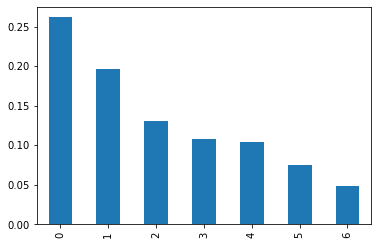

In [589]:
from sklearn.decomposition import PCA

pca = PCA(n_components=7)
components = pca.fit_transform(X)
pd.Series(pca.explained_variance_ratio_).plot.bar()

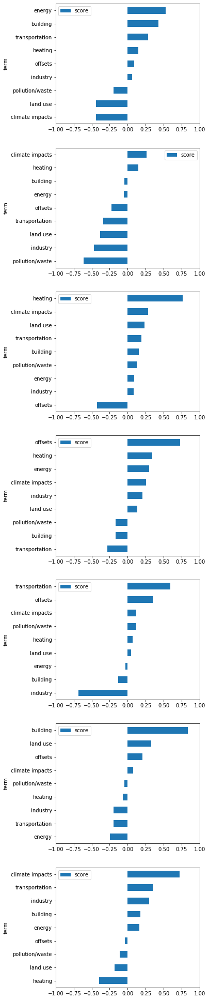

In [590]:
def show_topic_words(terms, components):
    num_topics = len(components)
    fig, axes = plt.subplots(nrows=num_topics, figsize=(5, num_topics * 5))
    for i, (comp, ax) in enumerate(zip(components, axes)):
        terms_comp = zip(terms, comp)
        sorted_terms = reversed(list(sorted(terms_comp, key= lambda x:x[1], reverse=True)[:20]))
        sorted_terms = pd.DataFrame(sorted_terms, columns=['term', 'score']).set_index('term')
        sorted_terms.plot.barh(y='score', ax=ax, xlim=(-1,1))
        
show_topic_words(X.columns, pca.components_)

In [591]:
components.shape

(122, 7)

## Topic representations
### Factor analysis

In [592]:
X

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
0,-1.221876,0.250586,-0.579034,0.445203,1.737725,-1.396198,0.436733,-0.832686,0.835775
1,-0.707200,4.517245,0.657964,-0.928655,0.948100,0.594881,0.030357,-0.855134,0.421212
2,1.438257,0.575353,-0.519768,0.136460,-1.461765,-0.298096,-0.629731,3.222371,-1.289233
3,-1.109080,-0.630702,0.134383,-0.574369,1.562406,-1.080859,1.275060,-0.646312,-0.550782
4,-0.726439,0.052210,-0.212270,-0.348520,-0.353063,1.131839,-0.004203,0.071135,-0.832900
...,...,...,...,...,...,...,...,...,...
117,-0.009784,-0.709382,0.556015,1.108261,0.303026,0.636089,0.610226,0.436597,-0.409388
118,-1.417516,-0.709382,-0.198597,-0.772976,2.640527,-1.215102,0.662677,-0.602031,-0.842066
119,-0.175903,-0.470347,1.548230,-0.735219,-0.714238,1.310242,0.781866,-0.597804,-0.151289
120,0.468875,-0.013297,-0.141437,-0.791671,0.081295,1.280665,0.079070,-0.553761,0.119709


In [593]:
!pip install factor-analyzer

In [594]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(X)
chi_square_value, p_value

(233.3317358197514, 4.155312642781715e-31)

In [595]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(X)
kmo_model

0.5597620556091267

In [596]:
from factor_analyzer.factor_analyzer import FactorAnalyzer

# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer(25, rotation=None)
fa.fit(X)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([2.35445876, 1.76708063, 1.17553476, 0.97011836, 0.93288444,
       0.678884  , 0.43716341, 0.41282058, 0.27105506])

In [597]:
help(FactorAnalyzer)

Help on class FactorAnalyzer in module factor_analyzer.factor_analyzer:

class FactorAnalyzer(sklearn.base.BaseEstimator, sklearn.base.TransformerMixin)
 |  FactorAnalyzer(n_factors=3, rotation='promax', method='minres', use_smc=True, is_corr_matrix=False, bounds=(0.005, 1), impute='median', rotation_kwargs=None)
 |  
 |  A FactorAnalyzer class, which -
 |      (1) Fits a factor analysis model using minres, maximum likelihood,
 |          or principal factor extraction and returns the loading matrix
 |      (2) Optionally performs a rotation, with method including:
 |  
 |          (a) varimax (orthogonal rotation)
 |          (b) promax (oblique rotation)
 |          (c) oblimin (oblique rotation)
 |          (d) oblimax (orthogonal rotation)
 |          (e) quartimin (oblique rotation)
 |          (f) quartimax (orthogonal rotation)
 |          (g) equamax (orthogonal rotation)
 |  
 |  Parameters
 |  ----------
 |  n_factors : int, optional
 |      The number of factors to select.
 

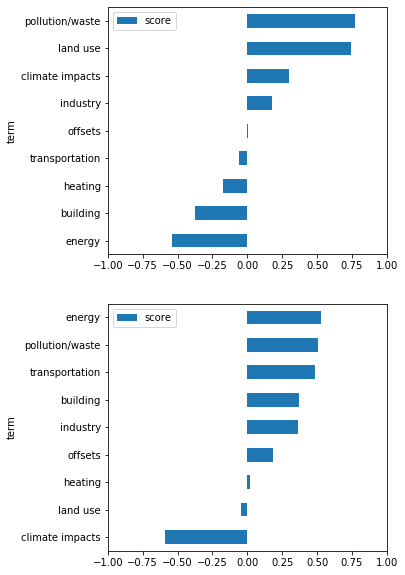

In [598]:
fa = FactorAnalyzer(n_factors=2, rotation='varimax')
fa.fit(X)
show_topic_words(X.columns, fa.loadings_.T)

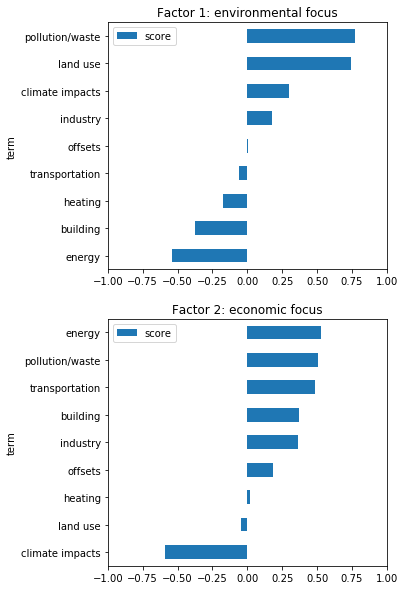

In [760]:
def show_topic_words(terms, components, titles):
    num_topics = len(components)
    fig, axes = plt.subplots(nrows=num_topics, figsize=(5, num_topics * 5))
    for i, (comp, ax, title) in enumerate(zip(components, axes, titles)):
        terms_comp = zip(terms, comp)
        sorted_terms = reversed(list(sorted(terms_comp, key= lambda x:x[1], reverse=True)[:20]))
        sorted_terms = pd.DataFrame(sorted_terms, columns=['term', 'score']).set_index('term')
        sorted_terms.plot.barh(y='score', ax=ax, xlim=(-1,1))
        ax.set_title(title)
fa = FactorAnalyzer(n_factors=2, rotation='varimax')
fa.fit(X)
show_topic_words(X.columns, fa.loadings_.T, ['Factor 1: environmental focus', 'Factor 2: economic focus'])

In [599]:
pd.DataFrame(fa.get_factor_variance(), index=['SS Loadings', 'Proportional Variance', 'Cumulative Variance'])

,0,1
SS Loadings,1.731371,1.414878
Proportional Variance,0.192375,0.157209
Cumulative Variance,0.192375,0.349583


In [600]:
!pip install adjustText

Text(154.25, 0.5, 'Factor 2: economic focus')

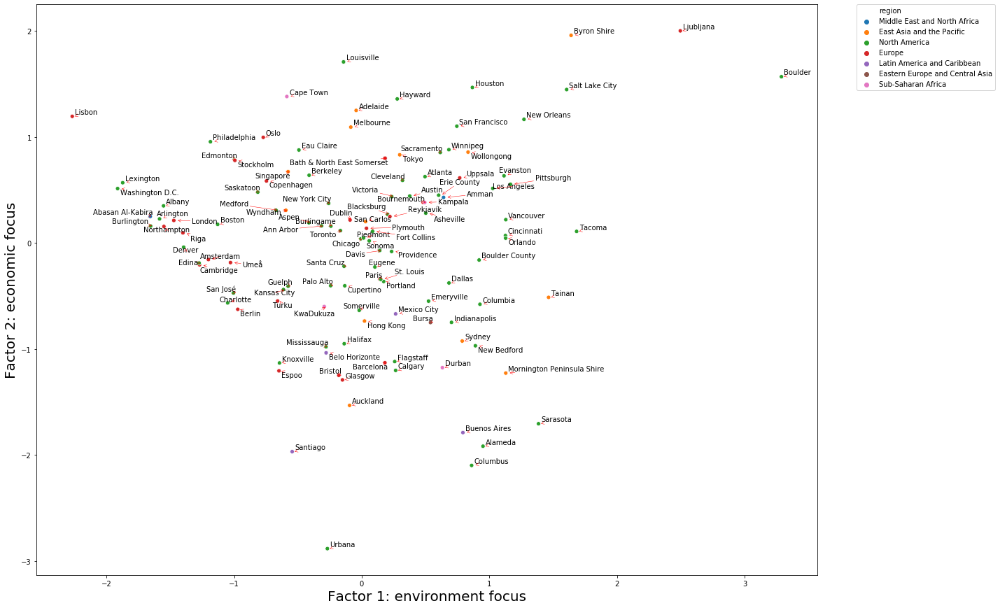

In [761]:
from adjustText import adjust_text

factors = fa.transform(X)
fig, ax = plt.subplots(figsize=(20,15))
sns.scatterplot(x=factors[:, 0], y=factors[:, 1], hue=inp_data['region'], markers=inp_data['city_name'], ax=ax)
texts =[]
for  point, city in zip(factors, inp_data['city_name']):
    texts.append(ax.text(point[0]+.02, point[1], str(city)))

plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='r', lw=0.5))
plt.xlabel('Factor 1: environment focus', size=20)
plt.ylabel('Factor 2: economic focus',size=20)

In [602]:
import statsmodels.api as sm

factors_df=pd.DataFrame(factors, columns=['environment centered', 'human centered'], index=inp_data.index)
reg = sm.OLS(factors_df['human centered'], sm.add_constant(factors_df['environment centered'])).fit()
test = reg.outlier_test()
#outliers = ((x[i],y[i]) for i,t in enumerate(test.icol(2)) if t < 0.5)
inp_data[test['bonf(p)']<0.5]

,text,city_name,doc,entity_type,country,iso,population,area,state,admin_1,...,region,baseline_emissions,baseline_year,density,country_percapita_gdp,netzero_target,tokens,lemmatized_tokens,doc_vec,emissions_per_capita
117,URBANA CLIMATE INHERITANCE RESOLUTION\nWHEREAS...,Urbana,"(URBANA, CLIMATE, INHERITANCE, RESOLUTION, \n,...",City,United States,USA,42014.0,5.697978,Illinois,"Champaign County, IL",...,North America,NaN,NaN,7373.492843,65118.4,True,"[CLIMATE, INHERITANCE, RESOLUTION, WHEREAS, ar...","[climate, inheritance, resolution, whereas, be...","[-0.06155894, 0.16273138, -0.083599135, -0.041...",NaN


In [603]:
from sklearn.decomposition import FactorAnalysis

fa = FactorAnalysis(n_components=2, random_state=3)
help(fa)

Help on FactorAnalysis in module sklearn.decomposition._factor_analysis object:

class FactorAnalysis(sklearn.base.TransformerMixin, sklearn.base.BaseEstimator)
 |  FactorAnalysis(n_components=None, *, tol=0.01, copy=True, max_iter=1000, noise_variance_init=None, svd_method='randomized', iterated_power=3, random_state=0)
 |  
 |  Factor Analysis (FA)
 |  
 |  A simple linear generative model with Gaussian latent variables.
 |  
 |  The observations are assumed to be caused by a linear transformation of
 |  lower dimensional latent factors and added Gaussian noise.
 |  Without loss of generality the factors are distributed according to a
 |  Gaussian with zero mean and unit covariance. The noise is also zero mean
 |  and has an arbitrary diagonal covariance matrix.
 |  
 |  If we would restrict the model further, by assuming that the Gaussian
 |  noise is even isotropic (all diagonal entries are the same) we would obtain
 |  :class:`PPCA`.
 |  
 |  FactorAnalysis performs a maximum like

In [604]:
factors = fa.fit_transform(X[['energy', 'building', 'land use', 'pollution/waste']])
fa.noise_variance_

array([0.34313247, 0.78285141, 0.33055913, 0.45156533])

In [605]:
fa.components_

array([[-0.65762707, -0.38638672,  0.79270055,  0.56453128],
       [ 0.46921681,  0.24255077,  0.17953089,  0.47070667]])

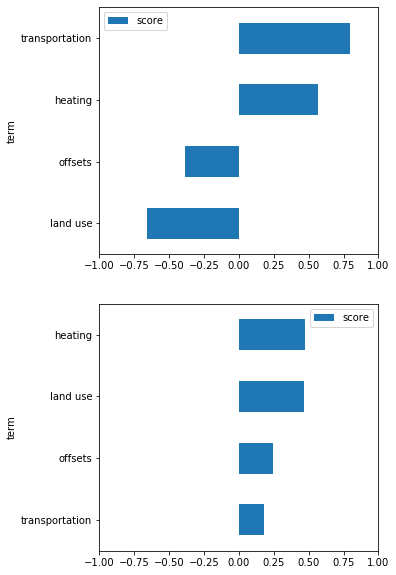

In [606]:
def show_topic_words(terms, components):
    num_topics = len(components)
    fig, axes = plt.subplots(nrows=num_topics, figsize=(5, num_topics * 5))
    for i, (comp, ax) in enumerate(zip(components, axes)):
        terms_comp = zip(terms, comp)
        sorted_terms = reversed(list(sorted(terms_comp, key= lambda x:x[1], reverse=True)[:20]))
        sorted_terms = pd.DataFrame(sorted_terms, columns=['term', 'score']).set_index('term')
        sorted_terms.plot.barh(y='score', ax=ax, xlim=(-1,1))
        
show_topic_words(X.columns, fa.components_)

In [607]:
components.shape

(122, 7)

## MDS

In [608]:
X

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
0,-1.221876,0.250586,-0.579034,0.445203,1.737725,-1.396198,0.436733,-0.832686,0.835775
1,-0.707200,4.517245,0.657964,-0.928655,0.948100,0.594881,0.030357,-0.855134,0.421212
2,1.438257,0.575353,-0.519768,0.136460,-1.461765,-0.298096,-0.629731,3.222371,-1.289233
3,-1.109080,-0.630702,0.134383,-0.574369,1.562406,-1.080859,1.275060,-0.646312,-0.550782
4,-0.726439,0.052210,-0.212270,-0.348520,-0.353063,1.131839,-0.004203,0.071135,-0.832900
...,...,...,...,...,...,...,...,...,...
117,-0.009784,-0.709382,0.556015,1.108261,0.303026,0.636089,0.610226,0.436597,-0.409388
118,-1.417516,-0.709382,-0.198597,-0.772976,2.640527,-1.215102,0.662677,-0.602031,-0.842066
119,-0.175903,-0.470347,1.548230,-0.735219,-0.714238,1.310242,0.781866,-0.597804,-0.151289
120,0.468875,-0.013297,-0.141437,-0.791671,0.081295,1.280665,0.079070,-0.553761,0.119709


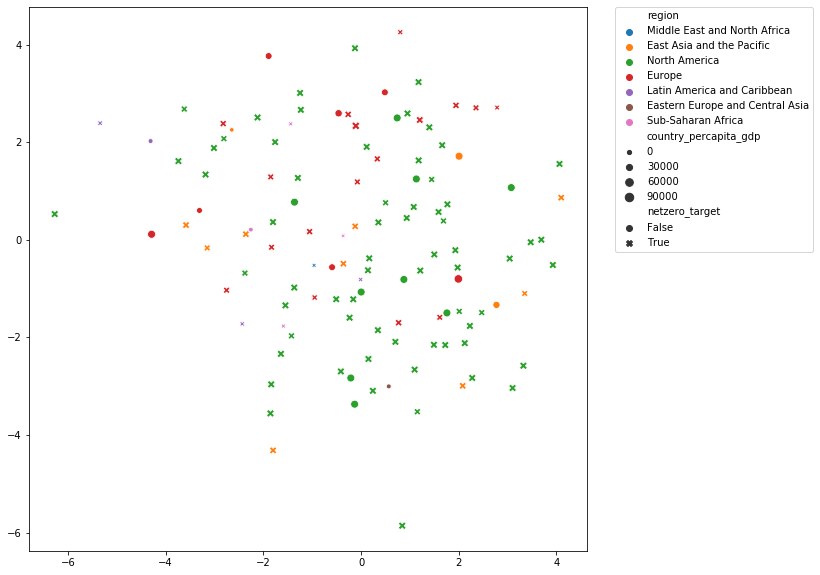

In [609]:
from sklearn.metrics.pairwise import euclidean_distances

X = pd.DataFrame(independent['tfidf'][None][True], columns=topics)
topic_dists = euclidean_distances(X)
mds = MDS( dissimilarity='precomputed')
mds_x = mds.fit_transform(topic_dists)
plt.figure(figsize=(10,10))
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'], size=inp_data['country_percapita_gdp'], style=inp_data['netzero_target'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

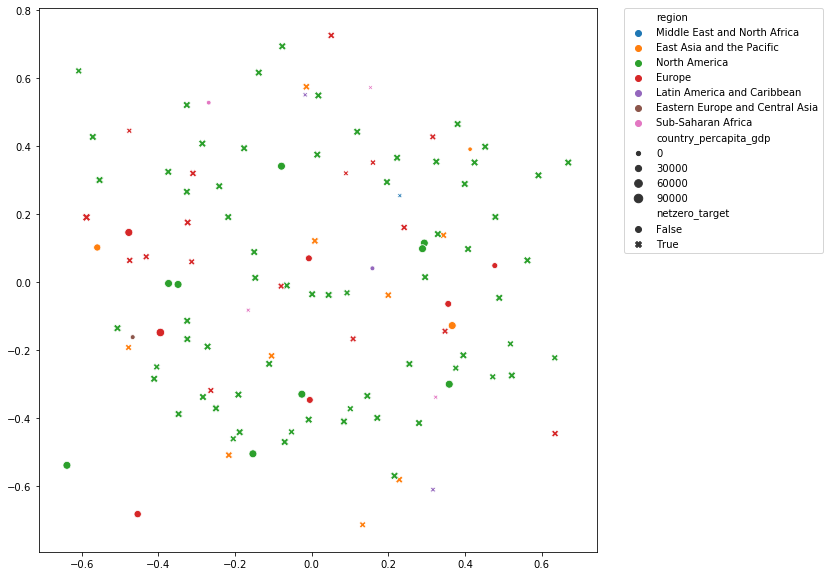

In [610]:
from sklearn.metrics.pairwise import euclidean_distances

X = pd.DataFrame(independent['count']['divide_by_doclength'][True], columns=topics)
topic_dists = euclidean_distances(X)
mds = MDS( dissimilarity='precomputed', metric=False)
mds_x = mds.fit_transform(topic_dists)
plt.figure(figsize=(10,10))
sns.scatterplot(mds_x[:, 0], mds_x[:, 1], hue=inp_data['region'], size=inp_data['country_percapita_gdp'], style=inp_data['netzero_target'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Raw 1-grams

In [611]:
# from sklearn.decomposition import PCA

# pca = PCA(n_components=7)
# components = pca.fit_transform(x.A)
# pd.Series(pca.explained_variance_ratio_).plot.bar()

In [612]:
# show_topic_words(cv.vocabulary_, pca.components_)

## Raw 2grams

In [613]:
# from sklearn.decomposition import PCA

# pca = PCA(n_components=7)
# components = pca.fit_transform(x_2g.A)
# pd.Series(pca.explained_variance_ratio_).plot.bar()

In [614]:
# show_topic_words(cv_2grams.vocabulary_, pca.components_)

## filtered terms

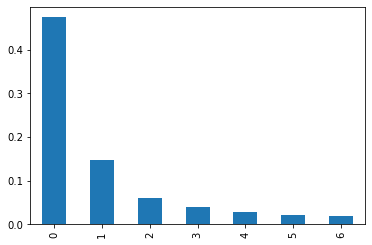

In [615]:
all_topic_terms =  [term for topic in topic_terms for term in topic_terms[topic]]
topic_word_idxs = [cv_2grams.vocabulary_[term] for term in all_topic_terms]
filtered_x = x_2g[:, topic_word_idxs]
components = pca.fit_transform(x_2g.A)
pd.Series(pca.explained_variance_ratio_).plot.bar()

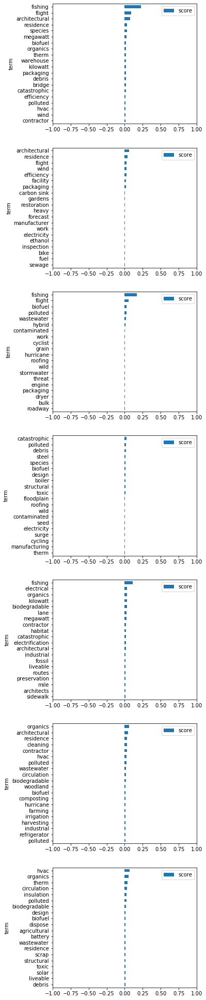

In [616]:
show_topic_words(all_topic_terms, pca.components_)

In [617]:
!pip install matplotlib==3.1.0

In [618]:
import matplotlib
print(matplotlib.__version__)

3.1.0


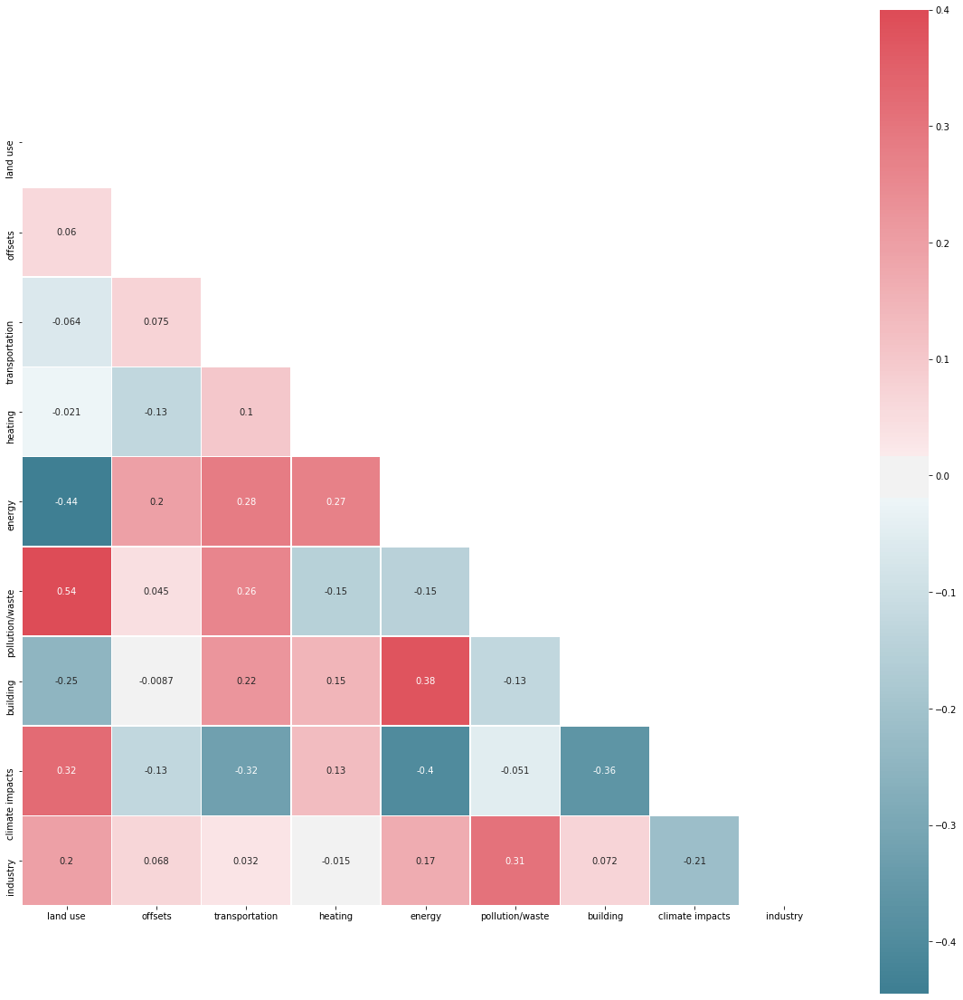

In [619]:
corr = X.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
cmap = sns.diverging_palette(220, 10, as_cmap=True)
fig, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.4, center=0, square=True, linewidths=.5, annot=True)
            #cbar_kws={"shrink": .5});

In [620]:
import statsmodels.api as sm

X

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
0,-1.221876,0.250586,-0.579034,0.445203,1.737725,-1.396198,0.436733,-0.832686,0.835775
1,-0.707200,4.517245,0.657964,-0.928655,0.948100,0.594881,0.030357,-0.855134,0.421212
2,1.438257,0.575353,-0.519768,0.136460,-1.461765,-0.298096,-0.629731,3.222371,-1.289233
3,-1.109080,-0.630702,0.134383,-0.574369,1.562406,-1.080859,1.275060,-0.646312,-0.550782
4,-0.726439,0.052210,-0.212270,-0.348520,-0.353063,1.131839,-0.004203,0.071135,-0.832900
...,...,...,...,...,...,...,...,...,...
117,-0.009784,-0.709382,0.556015,1.108261,0.303026,0.636089,0.610226,0.436597,-0.409388
118,-1.417516,-0.709382,-0.198597,-0.772976,2.640527,-1.215102,0.662677,-0.602031,-0.842066
119,-0.175903,-0.470347,1.548230,-0.735219,-0.714238,1.310242,0.781866,-0.597804,-0.151289
120,0.468875,-0.013297,-0.141437,-0.791671,0.081295,1.280665,0.079070,-0.553761,0.119709


In [621]:
help(sm.OLS)

Help on class OLS in module statsmodels.regression.linear_model:

class OLS(WLS)
 |  OLS(endog, exog=None, missing='none', hasconst=None, **kwargs)
 |  
 |  Ordinary Least Squares
 |  
 |  Parameters
 |  ----------
 |  endog : array_like
 |      A 1-d endogenous response variable. The dependent variable.
 |  exog : array_like
 |      A nobs x k array where `nobs` is the number of observations and `k`
 |      is the number of regressors. An intercept is not included by default
 |      and should be added by the user. See
 |      :func:`statsmodels.tools.add_constant`.
 |  missing : str
 |      Available options are 'none', 'drop', and 'raise'. If 'none', no nan
 |      checking is done. If 'drop', any observations with nans are dropped.
 |      If 'raise', an error is raised. Default is 'none'.
 |  hasconst : None or bool
 |      Indicates whether the RHS includes a user-supplied constant. If True,
 |      a constant is not checked for and k_constant is set to 1 and all
 |      result s

In [622]:
inp_data.columns

Index(['text', 'city_name', 'doc', 'entity_type', 'country', 'iso',
       'population', 'area', 'state', 'admin_1', 'initiatives_committed',
       'lat', 'lng', 'region', 'baseline_emissions', 'baseline_year',
       'density', 'country_percapita_gdp', 'netzero_target', 'tokens',
       'lemmatized_tokens', 'doc_vec', 'emissions_per_capita'],
      dtype='object')

In [623]:
numerical_Ys = ['population', 'density', 'emissions_per_capita', 'country_percapita_gdp']
categorical_Ys = ['netzero_target']

inp_data[numerical_Ys + categorical_Ys].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 122 entries, 0 to 123
Data columns (total 5 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   population             105 non-null    float64
 1   density                94 non-null     float64
 2   emissions_per_capita   60 non-null     float64
 3   country_percapita_gdp  120 non-null    float64
 4   netzero_target         122 non-null    bool   
dtypes: bool(1), float64(4)
memory usage: 4.9 KB


In [624]:
help(sm.OLS)

Help on class OLS in module statsmodels.regression.linear_model:

class OLS(WLS)
 |  OLS(endog, exog=None, missing='none', hasconst=None, **kwargs)
 |  
 |  Ordinary Least Squares
 |  
 |  Parameters
 |  ----------
 |  endog : array_like
 |      A 1-d endogenous response variable. The dependent variable.
 |  exog : array_like
 |      A nobs x k array where `nobs` is the number of observations and `k`
 |      is the number of regressors. An intercept is not included by default
 |      and should be added by the user. See
 |      :func:`statsmodels.tools.add_constant`.
 |  missing : str
 |      Available options are 'none', 'drop', and 'raise'. If 'none', no nan
 |      checking is done. If 'drop', any observations with nans are dropped.
 |      If 'raise', an error is raised. Default is 'none'.
 |  hasconst : None or bool
 |      Indicates whether the RHS includes a user-supplied constant. If True,
 |      a constant is not checked for and k_constant is set to 1 and all
 |      result s

In [625]:
inp_data['density']

0              NaN
1         7.341376
2      2918.175737
3      1779.173333
4      2261.904762
          ...     
119            NaN
120    4388.925043
121    1615.023272
122     365.038448
123     446.313653
Name: density, Length: 122, dtype: float64

In [626]:
for region in inp_data['region'].unique():
    print('\n\n\n{}'.format(region))
    print(inp_data[inp_data['region'] == region]['city_name'])




Middle East and North Africa
0    Abasan Al-Kabira
4               Amman
Name: city_name, dtype: object



East Asia and the Pacific
1                        Adelaide
11                       Auckland
28                    Byron Shire
60                      Hong Kong
75                      Melbourne
78     Mornington Peninsula Shire
97                     San Carlos
104                     Singapore
109                        Sydney
111                        Tainan
112                         Tokyo
122                    Wollongong
123                       Wyndham
Name: city_name, dtype: object



North America
2              Alameda
3               Albany
6            Ann Arbor
7            Arlington
8            Asheville
            ...       
117             Urbana
118          Vancouver
119           Victoria
120    Washington D.C.
121           Winnipeg
Name: city_name, Length: 74, dtype: object



Europe
5                       Amsterdam
13                      Barcelona


In [627]:
X.iloc[[2,3,4]]

,land use,offsets,transportation,heating,energy,pollution/waste,building,climate impacts,industry
2,1.438257,0.575353,-0.519768,0.136460,-1.461765,-0.298096,-0.629731,3.222371,-1.289233
3,-1.109080,-0.630702,0.134383,-0.574369,1.562406,-1.080859,1.275060,-0.646312,-0.550782
4,-0.726439,0.052210,-0.212270,-0.348520,-0.353063,1.131839,-0.004203,0.071135,-0.832900


In [628]:
inp_data.reset_index(inplace=True, drop=True)

## Linear Regression Continous characteristics ~ text variables

In [631]:
numerical_Ys

['population', 'density', 'emissions_per_capita', 'country_percapita_gdp']

In [632]:
help(np.concatenate)

Help on function concatenate in module numpy:

concatenate(...)
    concatenate((a1, a2, ...), axis=0, out=None)
    
    Join a sequence of arrays along an existing axis.
    
    Parameters
    ----------
    a1, a2, ... : sequence of array_like
        The arrays must have the same shape, except in the dimension
        corresponding to `axis` (the first, by default).
    axis : int, optional
        The axis along which the arrays will be joined.  If axis is None,
        arrays are flattened before use.  Default is 0.
    out : ndarray, optional
        If provided, the destination to place the result. The shape must be
        correct, matching that of what concatenate would have returned if no
        out argument were specified.
    
    Returns
    -------
    res : ndarray
        The concatenated array.
    
    See Also
    --------
    ma.concatenate : Concatenate function that preserves input masks.
    array_split : Split an array into multiple sub-arrays of equal or
   

In [633]:
inp_data['emissions_per_capita'] = inp_data['baseline_emissions'] / inp_data['population']
inp_data['emissions_per_capita']

0           NaN
1           NaN
2      4.654830
3           NaN
4      1.947368
         ...   
117    4.812512
118         NaN
119    7.176817
120         NaN
121    0.107300
Name: emissions_per_capita, Length: 122, dtype: float64

In [634]:
inp_data['emissions_per_capita'].notnull().sum()

60

In [635]:
np.std([0, 1, 1, 0, 0, 0])

0.4714045207910317

In [636]:
country_dummies = pd.get_dummies(inp_data.region)
country_dummies /= country_dummies.std()
country_dummies

,East Asia and the Pacific,Eastern Europe and Central Asia,Europe,Latin America and Caribbean,Middle East and North Africa,North America,Sub-Saharan Africa
0,0.000000,0.0,0.0,0.0,7.842725,0.000000,0.0
1,3.227659,0.0,0.0,0.0,0.000000,0.000000,0.0
2,0.000000,0.0,0.0,0.0,0.000000,2.038619,0.0
3,0.000000,0.0,0.0,0.0,0.000000,2.038619,0.0
4,0.000000,0.0,0.0,0.0,7.842725,0.000000,0.0
...,...,...,...,...,...,...,...
117,0.000000,0.0,0.0,0.0,0.000000,2.038619,0.0
118,0.000000,0.0,0.0,0.0,0.000000,2.038619,0.0
119,0.000000,0.0,0.0,0.0,0.000000,2.038619,0.0
120,3.227659,0.0,0.0,0.0,0.000000,0.000000,0.0


In [637]:
all_data = pd.concat([X, inp_data[numerical_Ys+categorical_Ys]], axis=1)
all_data = pd.concat([all_data, country_dummies], axis=1)

In [638]:
categorical_Ys

['netzero_target']

## Multivariate regression

In [639]:
numerical_Ys

['population', 'density', 'emissions_per_capita', 'country_percapita_gdp']

In [645]:
# ycol = 'country_percapita_gdp'
# xcols = topics #+ categorical_Ys
# Y = inp_data[inp_data[ycol].notnull()][ycol]
# # inp_X = all_data.iloc[list(Y.index)][xcols]
# inp_X = inp_X / (inp_X.std() + 1e-3)

# start_resmodel = sm.OLS(Y, inp_X, missing='drop')
# results_fu = start_resmodel.fit()
# results_fu.summary()
# # frames = []
# # alphas = np.arange(0, 1.0, 0.01).tolist()
# # for n in alphas:
# #     results_fr = start_resmodel.fit_regularized(L1_wt=1.0, alpha=n, start_params=results_fu.params)

# #     results_fr_fit = sm.regression.linear_model.OLSResults(start_resmodel, 
# #                                                            results_fr.params, 
# #                                                            start_resmodel.normalized_cov_params)
# # #     print(results_fr_fit.summary())
# #     frames.append(np.concatenate((results_fr.params, 
# #                                   [results_fr_fit.f_pvalue, results_fr_fit.ssr, results_fr_fit.rsquared_adj])))

# #     df = pd.DataFrame(frames, columns=list(inp_X.columns) + ['f_pval', 'ssr', 'rsquared_adj'])
# # df.index=alphas
# # df.index.name = 'alpha*'
# # print(df)
# # %matplotlib inline

# # fig, ax = plt.subplots(1, 4, figsize=(30, 4))

# # ax[0] = df.iloc[:, :-2].plot(ax=ax[0])
# # ax[0].set_title('Coefficient')
# # ax[0].legend(loc='upper center', bbox_to_anchor=(-0.5, 1.15))

# # ax[1] = df.iloc[:, -3].plot(ax=ax[1])
# # ax[1].set_title('f_pval')
# # ax[2] = df.iloc[:, -2].plot(ax=ax[2])
# # ax[2].set_title('ssr')
# # ax[3] = df.iloc[:, -1].plot(ax=ax[3])
# # ax[3].set_title('rsquared_adj')

In [647]:
# from scipy.stats import pearsonr
# import matplotlib.pyplot as plt 
# from scipy import stats

# fig, axes = plt.subplots(nrows=len(inp_X.columns), figsize=(5, 5*len(inp_X.columns)))

# from scipy import stats
# def r2(x, y):
#     return round(stats.pearsonr(x, y)[0] ** 2, 3)

# for ax, col in zip(axes, inp_X.columns):
# # get coeffs of linear fit
#     try:
#         slope, intercept, r_value, p_value, std_err = stats.linregress(inp_X[col], Y)
#         sns.regplot(x=inp_X[col], y=Y, ax=ax)
#         ax.set_title(col + ' R2: {} p: {}'.format(round(r_value, 3), round(p_value, r))
#     except:
#         pass

## None of these are significant (p<0.05), probably because our density/population data doesn't have much spread (mostly Europe/US). If we get population/emissions data for some of the poorer cities, which this doesn't have, we might do better.

## Net Zero Target Results

In [648]:
categorical_Ys

['netzero_target']

In [649]:
## TOPICS

In [650]:
import statsmodels.api as sm

In [651]:
inp_data['country_percapita_gdp']

0          NaN
1      54907.1
2      65118.4
3      65118.4
4       4330.3
        ...   
117    46194.7
118    65118.4
119    46194.7
120    54907.1
121    54907.1
Name: country_percapita_gdp, Length: 122, dtype: float64

In [652]:
ycol = 'netzero_target'
xcols = topics# + ['country_percapita_gdp'] + list(country_dummies.columns)
Y = inp_data[inp_data[ycol].notnull()][ycol]

for representation in ['count', 'tfidf']:
    for postprocess in [None, 'divide_by_doclength']:
        for standardize in [False, True]:
            inp_X = independent[representation][postprocess][standardize]
            inp_X = pd.DataFrame(inp_X, columns=topics, index=Y.index)
#             inp_X = pd.concat([inp_X, country_dummies, inp_data[['country_percapita_gdp']]], axis=1)
            inp_X = pd.concat([inp_X, country_dummies], axis=1)
            for col in inp_X:
                this_Y = Y[inp_X[col].notnull()]
                inp_X = inp_X[inp_X[col].notnull()]
            #inp_X = inp_X.iloc[list(Y.index)][xcols]
            
            #inp_X = all_data.iloc[list(Y.index)][xcols]
            print(representation)
            print(postprocess)
            print(standardize)
            #inp_X = sm.add_constant(inp_X)
            start_resmodel = sm.Logit(this_Y, inp_X)
            try:
                results_fu = start_resmodel.fit(missing='drop')
                
                print(results_fu.summary())
            except:
                pass

count
None
False
         Current function value: 0.404999
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:         netzero_target   No. Observations:                  122
Model:                          Logit   Df Residuals:                      106
Method:                           MLE   Df Model:                           15
Date:                Thu, 15 Oct 2020   Pseudo R-squ.:                  0.1832
Time:                        11:56:33   Log-Likelihood:                -49.410
converged:                      False   LL-Null:                       -60.490
Covariance Type:            nonrobust   LLR p-value:                    0.1036
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
land use                           -0.0029      0.003     -0.966      0.334      -0.0

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "



None
True
         Current function value: 0.426173
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:         netzero_target   No. Observations:                  122
Model:                          Logit   Df Residuals:                      106
Method:                           MLE   Df Model:                           15
Date:                Thu, 15 Oct 2020   Pseudo R-squ.:                  0.1405
Time:                        11:56:33   Log-Likelihood:                -51.993
converged:                      False   LL-Null:                       -60.490
Covariance Type:            nonrobust   LLR p-value:                    0.3192
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
land use                           -0.7157      0.496     -1.443      0.149      -1.688    

/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/discrete/discrete_model.py:1800: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


In [653]:
x_2g.toarray()

array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  3,  1, ...,  0,  0,  0],
       [ 0,  8, 13, ...,  4,  1,  0],
       ...,
       [ 8,  2, 10, ..., 10,  0,  0],
       [ 0,  1,  3, ...,  0,  0,  0],
       [ 0,  0,  1, ...,  0,  0,  0]])

In [654]:
# start_resmodel = sm.Logit(Y, sm.add_constant(x_2g.toarray()))
# res = start_resmodel.fit()
# res.summary()

In [655]:
Y.isnull().sum()

0

In [656]:
inp_X.isnull().sum()

land use                           0
offsets                            0
transportation                     0
heating                            0
energy                             0
pollution/waste                    0
building                           0
climate impacts                    0
industry                           0
East Asia and the Pacific          0
Eastern Europe and Central Asia    0
Europe                             0
Latin America and Caribbean        0
Middle East and North Africa       0
North America                      0
Sub-Saharan Africa                 0
dtype: int64

In [657]:
components = components[:, Y]

IndexError: boolean index did not match indexed array along dimension 1; dimension is 7 but corresponding boolean dimension is 122

In [658]:
start_resmodel = sm.Logit(Y, inp_X)
results_fu = start_resmodel.fit(missing='drop')

results_fu.summary()

         Current function value: 0.426383
         Iterations: 35


/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:567: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warn("Maximum Likelihood optimization failed to converge. "


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:         netzero_target   No. Observations:                  122
Model:                          Logit   Df Residuals:                      106
Method:                           MLE   Df Model:                           15
Date:                Thu, 15 Oct 2020   Pseudo R-squ.:                  0.1401
Time:                        11:56:37   Log-Likelihood:                -52.019
converged:                      False   LL-Null:                       -60.490
Covariance Type:            nonrobust   LLR p-value:                    0.3223
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
land use                           -0.0486      0.807     -0.060      0.952      -1.630       1.533
offsets                            -0.1595      0.448     -0.356      0.722      -1.037       0.718
transportation                     -0.9731      0.875     -1.112      0.266      -2.688       0.741
heating                            -0.9052      0.676     -1.338      0.181      -2.231       0.421
energy                              1.4657      1.976      0.742      0.458      -2.407       5.338
pollution/waste                    -0.1109      0.875     -0.127      0.899      -1.826       1.605
building                            0.5477      0.966      0.567      0.571      -1.346       2.442
climate impacts                     3.4599      2.630      1.316      0.188      -1.695       8.614
industry                            0.0012      0.517      0.002      0.998      -1.012       1.015
East Asia and the Pacific           0.3459      0.232      1.492      0.136      -0.109       0.800
Eastern Europe and Central Asia    -2.3563   4.79e+04  -4.92e-05      1.000   -9.38e+04    9.38e+04
Europe                              0.7115      0.280      2.537      0.011       0.162       1.261
Latin America and Caribbean         0.0825      0.240      0.343      0.731      -0.389       0.553
Middle East and North Africa        0.0520      0.188      0.277      0.782      -0.316       0.420
North America                       1.2354      0.261      4.734      0.000       0.724       1.747
Sub-Saharan Africa                  0.1536      0.234      0.656      0.512      -0.305       0.613
===================================================================================================
"""

In [659]:
## componenets

In [660]:
all_data[ycol].isnull().sum()

0

In [661]:
Y.shape

(122,)

In [662]:
Y = inp_data[inp_data[ycol].notnull()][ycol]
inp_X = pd.DataFrame(components, columns=['component{}'.format(i) for i in range(7)])

In [663]:
start_resmodel = sm.Logit(Y, inp_X)
results_fu = start_resmodel.fit(missing='drop')

results_fu.summary()

         Current function value: inf
         Iterations: 35


LinAlgError: Singular matrix

In [664]:
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold


kfold = StratifiedKFold(n_splits=4, random_state=3, shuffle=True)

for train_idx, test_idx in kfold.split(inp_X, Y):
    model = LogisticRegressionCV(class_weight='balanced')
    model.fit(inp_X.iloc[train_idx], Y.iloc[train_idx])
    ps = model.predict(inp_X.iloc[test_idx])
    print(classification_report(Y.iloc[test_idx], ps))

              precision    recall  f1-score   support

       False       0.24      0.67      0.35         6
        True       0.86      0.48      0.62        25

    accuracy                           0.52        31
   macro avg       0.55      0.57      0.48        31
weighted avg       0.74      0.52      0.56        31

              precision    recall  f1-score   support

       False       0.25      0.50      0.33         6
        True       0.84      0.64      0.73        25

    accuracy                           0.61        31
   macro avg       0.55      0.57      0.53        31
weighted avg       0.73      0.61      0.65        31

              precision    recall  f1-score   support

       False       0.33      0.83      0.48         6
        True       0.93      0.58      0.72        24

    accuracy                           0.63        30
   macro avg       0.63      0.71      0.60        30
weighted avg       0.81      0.63      0.67        30

              preci

## ML MODEL

In [665]:
import sklearn

list(sklearn.metrics.SCORERS.keys())

['explained_variance',
 'r2',
 'max_error',
 'neg_median_absolute_error',
 'neg_mean_absolute_error',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_root_mean_squared_error',
 'neg_mean_poisson_deviance',
 'neg_mean_gamma_deviance',
 'accuracy',
 'roc_auc',
 'roc_auc_ovr',
 'roc_auc_ovo',
 'roc_auc_ovr_weighted',
 'roc_auc_ovo_weighted',
 'balanced_accuracy',
 'average_precision',
 'neg_log_loss',
 'neg_brier_score',
 'adjusted_rand_score',
 'homogeneity_score',
 'completeness_score',
 'v_measure_score',
 'mutual_info_score',
 'adjusted_mutual_info_score',
 'normalized_mutual_info_score',
 'fowlkes_mallows_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted']

In [666]:
import nltk

nltk.Text(['hello', 'there', 'good', 'sir', '.', '\n', 'What', 'are', 'you', 'doing', 'today', '?']).concordance('good')

Displaying 1 of 1 matches:
hello there good sir . 
 What are you doing today ?


In [667]:
inp_data['lemmatized_tokens'].name

'lemmatized_tokens'

In [668]:
!pip install tabulate

In [669]:
len(keyword_set)

10796

In [670]:
normalized_x2g.shape

(122, 10796)

In [671]:
vocab_1g = [p[0] for p in sorted(cv.vocabulary_.items(), key=lambda p: p[1])]

In [672]:
independent['tfidf']['divide_by_doclength'][True].shape

(122, 9)

In [673]:
import sklearn

print(sklearn.__path__)

['/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn']


In [674]:
print('hell')

hell


In [675]:
np.array([[3,4,5]]).sorted()

AttributeError: 'numpy.ndarray' object has no attribute 'sorted'

In [676]:
lemattized_text = inp_data['lemmatized_tokens'].apply(' '.join)
lemattized_text.str.contains('circular')

0      False
1       True
2       True
3      False
4      False
       ...  
117     True
118    False
119     True
120    False
121    False
Name: lemmatized_tokens, Length: 122, dtype: bool

In [677]:
rand = np.random.random(size=(3,3,3))
rand

array([[[0.79292155, 0.69157498, 0.73318915],
        [0.3505767 , 0.35929764, 0.78878378],
        [0.99538087, 0.78861837, 0.94943627]],

       [[0.61753897, 0.18214393, 0.53878859],
        [0.96935473, 0.40049232, 0.8280413 ],
        [0.54331118, 0.34984894, 0.66268983]],

       [[0.78956932, 0.01927078, 0.85583623],
        [0.44531212, 0.58209291, 0.34820553],
        [0.08518809, 0.50836374, 0.61536704]]])

In [678]:
rand[:,1, np.array([1,2])]


array([[0.35929764, 0.78878378],
       [0.40049232, 0.8280413 ],
       [0.58209291, 0.34820553]])

In [679]:

from sklearn.model_selection import GridSearchCV

help(GridSearchCV)

Help on class GridSearchCV in module sklearn.model_selection._search:

class GridSearchCV(BaseSearchCV)
 |  GridSearchCV(estimator, param_grid, *, scoring=None, n_jobs=None, iid='deprecated', refit=True, cv=None, verbose=0, pre_dispatch='2*n_jobs', error_score=nan, return_train_score=False)
 |  
 |  Exhaustive search over specified parameter values for an estimator.
 |  
 |  Important members are fit, predict.
 |  
 |  GridSearchCV implements a "fit" and a "score" method.
 |  It also implements "predict", "predict_proba", "decision_function",
 |  "transform" and "inverse_transform" if they are implemented in the
 |  estimator used.
 |  
 |  The parameters of the estimator used to apply these methods are optimized
 |  by cross-validated grid-search over a parameter grid.
 |  
 |  Read more in the :ref:`User Guide <grid_search>`.
 |  
 |  Parameters
 |  ----------
 |  estimator : estimator object.
 |      This is assumed to implement the scikit-learn estimator interface.
 |      Either e

[21.5443469]


,No Target,Target
precision,1.000000,0.960784
recall,0.833333,1.000000
f1-score,0.909091,0.980000
support,24.000000,98.000000


/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 24 members, which is less than n_splits=50.
  warnings.warn(("The least populated class in y has only %d"


                   pval       coef
term                              
annual reduction  0.002   0.365776
restore           0.000   0.512108
leader            0.000   0.966710
social housing    0.000   0.973744
deadline          0.004   1.016098
long term         0.349   1.406502
quality life      0.000   2.613268
message           0.000   6.371873
corporation       0.000   7.754259
neighbourhood     0.000  12.796427
past year         0.000  17.371483
transition        0.000  24.593171
circular          0.000  29.700352


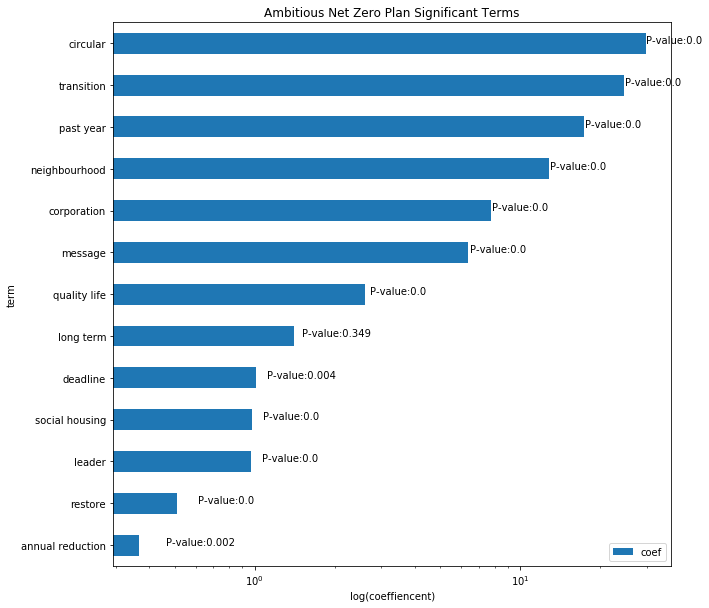

In [756]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from IPython.display import display, HTML
from sklearn.feature_selection import chi2

X_inp = normalized_x2g
kws = [term for term, _ in sorted(cv_2grams.vocabulary_.items(), key= lambda p: p[1])]

def visualize_feat_scores(term_data, out_file='significant_term_examples.html'):
    fig, ax = plt.subplots(figsize=(10, 10))
    term_data.plot.barh(y='coef', ax=ax, logx=True)
    lemattized_text = inp_data['lemmatized_tokens'].apply(' '.join)
    term_examples = []
    for i, (term, p, coef) in enumerate(zip(term_data.index, term_data['pval'], term_data['coef'])):
        contains = lemattized_text.str.contains(term)
        relevant_lemattized_text = lemattized_text[contains]
        tok_offsets = relevant_lemattized_text.apply(lambda text: len(text[:text.index(term)].split(' ')))
        tok_offsets = tok_offsets.rename('term_offset')
        relevant = pd.concat([inp_data[contains], tok_offsets], axis=1)
        containing_sent = relevant.apply(lambda row:
            row['tokens'][row['term_offset']].sent.text, axis=1)
        containing_sent = containing_sent.str.replace('\n', ' ')
#         print(containing_sent.tolist())
        for t in term.split(' '):
            #bolded =  '\033[1m'+t+'\033[0m'
            bolded =  '<b>'+t+'</b>'
            containing_sent = containing_sent[containing_sent.str.lower().str.contains(t)].str.lower().str.replace(t, bolded)
#             print(t)
#             print(containing_sent.tolist())
#         containing_sent = ['tokens'].apply(
#             lambda ts: ts[tok_offset].sent.text
        ax.annotate('P-value:{}'.format(p), (coef+0.1, i))
        term_examples.append((term , '<br><br>'.join(containing_sent.tolist())))
    out = pd.DataFrame(term_examples, columns=['term', 'examples']).iloc[::-1]#.set_index('term')
    ax.set_title('Ambitious Net Zero Plan Significant Terms')
    ax.set_xlabel('log(coeffiencent)')
#     for _, row in out.iterrows():
#         print('\n\n\n')
#         print('\033[4m' + row['term'] + '\033[0m')
#         print(row['examples'])
    with open(out_file, 'w') as f:
        f.write(out.set_index('term').to_html(escape=False))
        
def fit_logcv(x, kws, x_counts):
#     Cs = np.logspace(-5, 0, 10)
#     print(Cs)
    Cs=None
    logit = LogisticRegressionCV(penalty='l1', solver='liblinear', max_iter=10000, random_state=1,
                                 scoring='balanced_accuracy', refit=True)
    logit.fit(x, Y)
    print(logit.C_)
    results = pd.DataFrame(classification_report(Y, logit.predict(x), output_dict=True))
    results = results.rename({'False': 'No Target', 'True': 'Target'}, axis='columns')
    display(results[['No Target', 'Target']])
    folds = StratifiedKFold(n_splits=50, random_state=1).split(x, Y)
    imp_term_idxes = np.where(logit.coef_>0)[1]
    coefs = []
    
    for train_idx, test_idx in folds:
        estimator=LogisticRegression(
            penalty='l1', solver='liblinear', max_iter=10000, random_state=1, C=logit.C_[0])
        estimator.fit(x[train_idx], Y[train_idx])
        coefs.append(estimator.coef_[0, imp_term_idxes])
        
    coefs = np.array(coefs)
        
    scores, pvals = chi2(x_counts, Y)
    scores = sorted([(kws[idx],  round(pvals[idx], 3), logit.coef_[0, idx]) 
                     for i, idx in enumerate(imp_term_idxes)], 
                    key=lambda p: p[1], reverse=True)
    term_data = pd.DataFrame(scores, columns=['term', 'pval', 'coef']).sort_values(by='coef', ascending=True).set_index('term')
    print(term_data)
    visualize_feat_scores(term_data)
    
fit_logcv(X_inp, kws, x_2g)

In [742]:
n = 0.00003092092
round(n, abs(round(float(np.log10(n)), 0)))

TypeError: 'float' object cannot be interpreted as an integer

[15]


,True
precision,0.942308
recall,1.000000
f1-score,0.970297
support,98.000000


/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:293: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  warnings.warn(
/Users/siddharthsachdeva/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_split.py:670: UserWarning: The least populated class in y has only 24 members, which is less than n_splits=50.
  warnings.warn(("The least populated class in y has only %d"


                       pval       coef
term                                  
med            1.753205e-14   0.904397
restore        8.592567e-07   2.858537
message        2.406455e-06   2.861360
corporation    6.810250e-14   3.116593
gpc            4.161178e-06   4.584381
downtown       1.628497e-13   5.480689
leader         3.104346e-06   7.647258
neighbourhood  5.000000e-19  11.788313
organic        1.729574e-04  13.846230
circular       3.100000e-19  21.549118
transition     2.221452e-09  25.611418


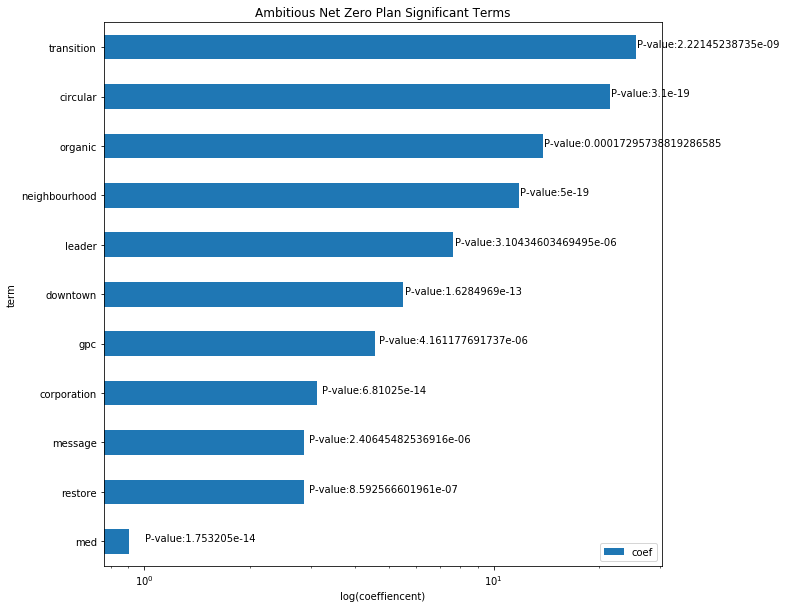

In [752]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from IPython.display import display, HTML
from sklearn.feature_selection import chi2

X_inp = normalized_x
kws = [term for term, _ in sorted(cv.vocabulary_.items(), key= lambda p: p[1])]

def visualize_feat_scores(term_data, out_file='significant_term_examples.html'):
    fig, ax = plt.subplots(figsize=(10, 10))
    term_data.plot.barh(y='coef', ax=ax, logx=True)
    lemattized_text = inp_data['lemmatized_tokens'].apply(' '.join)
    term_examples = []
    for i, (term, p, coef) in enumerate(zip(term_data.index, term_data['pval'], term_data['coef'])):
        contains = lemattized_text.str.contains(term)
        relevant_lemattized_text = lemattized_text[contains]
        tok_offsets = relevant_lemattized_text.apply(lambda text: len(text[:text.index(term)].split(' ')))
        tok_offsets = tok_offsets.rename('term_offset')
        relevant = pd.concat([inp_data[contains], tok_offsets], axis=1)
        containing_sent = relevant.apply(lambda row:
            row['tokens'][row['term_offset']].sent.text, axis=1)
        containing_sent = containing_sent.str.replace('\n', ' ')
#         print(containing_sent.tolist())
        for t in term.split(' '):
            #bolded =  '\033[1m'+t+'\033[0m'
            bolded =  '<b>'+t+'</b>'
            containing_sent = containing_sent[containing_sent.str.lower().str.contains(t)].str.lower().str.replace(t, bolded)
            
#             print(t)
#             print(containing_sent.tolist())
#         containing_sent = ['tokens'].apply(
#             lambda ts: ts[tok_offset].sent.text
        ax.annotate('P-value:{}'.format(p), (coef+0.1, i))
        term_examples.append((term , '<br><br>'.join(containing_sent.tolist())))
    out = pd.DataFrame(term_examples, columns=['term', 'examples']).iloc[::-1]#.set_index('term')
    ax.set_title('Ambitious Net Zero Plan Significant Terms')
    ax.set_xlabel('log(coeffiencent)')
#     for _, row in out.iterrows():
#         print('\n\n\n')
#         print('\033[4m' + row['term'] + '\033[0m')
#         print(row['examples'])
    with open(out_file, 'w') as f:
        f.write(out.set_index('term').to_html(escape=False))
        
def fit_logcv(x, kws, x_counts):
#     Cs = np.logspace(-5, 0, 10)
#     print(Cs)
    Cs=None
    logit = LogisticRegressionCV(penalty='l1', solver='liblinear', max_iter=10000, random_state=1,
                                 scoring='balanced_accuracy', refit=True, Cs=[15])
    logit.fit(x, Y)
    print(logit.C_)
    display(HTML(pd.DataFrame(classification_report(Y, logit.predict(x), output_dict=True))[['True']].to_html()))
    folds = StratifiedKFold(n_splits=50, random_state=1).split(x, Y)
    imp_term_idxes = np.where(logit.coef_>0)[1]
    coefs = []
    
    for train_idx, test_idx in folds:
        estimator=LogisticRegression(
            penalty='l1', solver='liblinear', max_iter=10000, random_state=1, C=logit.C_[0])
        estimator.fit(x[train_idx], Y[train_idx])
        coefs.append(estimator.coef_[0, imp_term_idxes])
        
    coefs = np.array(coefs)
        
    scores, pvals = chi2(x_counts, Y)
    scores = sorted([(kws[idx],  round(pvals[idx], len(str(pvals[idx]))-2), logit.coef_[0, idx]) 
                     for i, idx in enumerate(imp_term_idxes)], 
                    key=lambda p: p[1], reverse=True)
    term_data = pd.DataFrame(scores, columns=['term', 'pval', 'coef']).sort_values(by='coef', ascending=True).set_index('term')
    print(term_data)
    visualize_feat_scores(term_data)
    
fit_logcv(X_inp, kws, x)

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(topics), figsize=(len(topics)*10, 5))

for topic, ax in zip(topics, axes):
    sns.displot(all_data[[topic, 'netzero_target']], x=topic, hue='netzero_target', element='step', ax=ax)

In [ ]:
all_data.columns

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(topics), figsize=(5, len(topics)*10))

for topic, ax in zip(topics, axes):
    sns.scatterplot(x=all_data[topic], y=all_data['country_percapita_gdp'], ax=ax)

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=len(topics), figsize=(5, len(topics)*10))

for topic, ax in zip(topics, axes):
    sns.scatterplot(x=all_data[topic], y=all_data['density'], ax=ax)

## Clustering

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(all_data[topics])
    score = silhouette_score(all_data[topics], clusters)
    scores.append((n, score))
scores

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(components)
    score = silhouette_score(components, clusters)
    scores.append((n, score))
pd.DataFrame(scores).set_index(0).plot()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(x)
    score = silhouette_score(x, clusters)
    scores.append((n, score))
pd.DataFrame(scores).set_index(0).plot()

In [ ]:
km = KMeans(n_clusters=2)

clusters = km.fit_predict(x)
pd.Series(clusters).value_counts()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(normalized_x)
    score = silhouette_score(normalized_x, clusters)
    scores.append((n, score))
pd.DataFrame(scores).set_index(0).plot()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(x_2g)
    score = silhouette_score(x_2g, clusters)
    scores.append((n, score))
pd.DataFrame(scores).set_index(0).plot()

In [ ]:
km = KMeans(n_clusters=2)

clusters = km.fit_predict(x_2g)
pd.Series(clusters).value_counts()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

scores = []
for n in range(2, 20):
    kmeans = KMeans(n_clusters=n)
    clusters = kmeans.fit_predict(normalized_x2g)
    score = silhouette_score(normalized_x2g, clusters)
    scores.append((n, score))
pd.DataFrame(scores).set_index(0).plot()

In [ ]:
km = KMeans(n_clusters=3)

clusters = km.fit_predict(normalized_x2g)
pd.Series(clusters).value_counts()

In [ ]:
len(keyword_set)

In [ ]:
for row in km.cluster_centers_:
    print()
    print([keyword_set[idx] for idx, _ in sorted(enumerate(row), key=lambda p: p[1], reverse=True)][:10])

In [ ]:
# 1=  Target specified (specific target recorded in a reporting platform - includes a specific emissions reductions goal and target year)

# 2 = Legislative commitment (target is enshired in formal legislation or policy)

# 3 = Target under development (actor has ""commited to commit"" - e.g., joining an ICI without setting an individual target, or noting in a reporting platform that a net zero commitment is forthcoming). Likely just the NAZCA2020 actors.

# 4= Net zero plan (Does the net zero target mention a plan for implementation (whether enshrined in formal policy document or otherwise(?))

# NA= no net zero target (e.g., has interim 2030 target that is alinged to a 1.5 or 2C pathway, but has not set a net zero target)"

# -7777 guessed

inp_data['net_zero_target_status'].value_counts()

In [ ]:
for label, num in [('target specified', 1), ('legislative commitment', 2), ('net zero plan', 4)]:
    inp_data[label] = inp_data['net_zero_target_status'].str.contains(str(num), na=False)
    print(inp_data[label].value_counts())

In [ ]:
tgts = ['reduction>80', 'target specified', 'legislative commitment', 'net zero plan']

In [ ]:
def fit_logit_model(X, ycol):
    Y = inp_data[inp_data[ycol].notnull()][ycol]
    print(Y)
    inp_X = X.iloc[list(Y.index)]
    model = sm.OLS(Y, inp_X)
    res = model.fit()
    return res.summary()

for tgt in tgts:
    print('\n\n\n')
    print(tgt)
    print(fit_logit_model(X[['heating', 'energy', 'urban', 'land', 'waste']], tgt))

## More Cities

* Delhi: http://moef.gov.in/wp-content/uploads/2017/08/Delhi-State-Action-Plan-on-Cimate-Change.pdf
* Karnataka: http://taskmediator.com/op/op.Download.php?documentid=2418&version=1

## Latent Semantic Analysis

### Tfidf Features

In [ ]:
from sklearn.decomposition import TruncatedSVD
import matplotlib.pyplot as plt

svd_model= TruncatedSVD(n_components=30, algorithm='randomized', n_iter=100, random_state=122)
svd_model.fit(normalized_x)
pd.Series(svd_model.singular_values_).plot.bar()

In [ ]:
svd_model= TruncatedSVD(n_components=8, algorithm='randomized', n_iter=100, random_state=122)
svd_model.fit(normalized_x)

def show_topic_words(terms, components):
    num_topics = len(components)
    fig, axes = plt.subplots(nrows=num_topics, figsize=(5, num_topics * 5))
    for i, (comp, ax) in enumerate(zip(components, axes)):
        terms_comp = zip(terms, comp)
        sorted_terms = reversed(list(sorted(terms_comp, key= lambda x:x[1], reverse=True)[:20]))
        sorted_terms = pd.DataFrame(sorted_terms, columns=['term', 'score']).set_index('term')
        sorted_terms.plot.barh(y='score', ax=ax)
        ax.set_title("Topic "+str(i)+": ")
show_topic_words(terms, svd_model.components_)

In [ ]:
from sklearn.decomposition import TruncatedSVD

svd_counts_model= TruncatedSVD(n_components=30, algorithm='randomized', n_iter=100, random_state=122)
svd_counts_model.fit(x)
pd.Series(svd_counts_model.singular_values_).plot.bar()

In [ ]:
svd_counts_model= TruncatedSVD(n_components=6, algorithm='randomized', n_iter=100, random_state=122)
x_lsa = svd_counts_model.fit_transform(x)
show_topic_words(terms, svd_counts_model.components_)

In [ ]:
topic_names = [
    'climate action plan',
    'questions/concerns', 
    'emissions reductions targets',
    'community/justice', 
    'project management', 
    'adaptation/resilience', 
]

In [644]:
for t in topic_names:
    print(t)

NameError: name 'topic_names' is not defined

## LDA

## Clustering

## Cluster tfidf vecs

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

data = []
for n_clusters in tqdm(range(2, 20)):
    kmeans = KMeans(n_clusters=n_clusters, random_state=122)
    labels = kmeans.fit_predict(normalized_x)
    score = silhouette_score(normalized_x, labels, metric='cosine') 
    data.append((n_clusters, score))

In [ ]:
pd.DataFrame(data, columns=['n_clusters', 'score']).set_index('n_clusters').plot()

In [ ]:
kmeans = KMeans(n_clusters=12, random_state=122)
inp_data['labels'] = kmeans.fit_predict(normalized_x)

In [ ]:
def show_cluster_words(terms, components, df):
    num_topics = len(components)
    fig, axes = plt.subplots(nrows=num_topics, figsize=(5, num_topics * 5))
    for i, (comp, ax) in enumerate(zip(components, axes)):
        terms_comp = zip(terms, comp)
        sorted_terms = reversed(list(sorted(terms_comp, key= lambda x:x[1], reverse=True)[:20]))
        sorted_terms = pd.DataFrame(sorted_terms, columns=['term', 'score']).set_index('term')
        sorted_terms.plot.barh(y='score', ax=ax)
        cities = df[df['labels'] == i]['city'].tolist()
        city_str = ""
        for c in range(0, len(cities), 5):
            city_str += ','.join(cities[c:c+5]) + '\n'
        city_str = city_str.strip()
        ax.set_title("C:"+str(i)+":\n" + city_str)

show_cluster_words(terms, kmeans.cluster_centers_, inp_data)

## Cluster topic vecs

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

data = []
for n_clusters in range(2, 20):
    kmeans = KMeans(n_clusters=n_clusters, random_state=122)
    labels = kmeans.fit_predict(x_lsa)
    score = silhouette_score(x_lsa, labels, metric='cosine') 
    data.append((n_clusters, score))
pd.DataFrame(data, columns=['n_clusters', 'score']).set_index('n_clusters').plot()

In [ ]:
kmeans = KMeans(n_clusters=3)
inp_data['labels'] = kmeans.fit_predict(x_lsa)
show_cluster_words(topic_names, kmeans.cluster_centers_, inp_data)

## Visualize Similarity Graph

## Latent Dirichlet Allocation

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation

help(LatentDirichletAllocation)

### Tfidf Features

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=10)
lda.fit(normalized_x)
            
terms = cv.get_feature_names()
show_topic_words(terms, lda.components_)

### Count Features

In [ ]:
from sklearn.decomposition import TruncatedSVD
from tqdm import tqdm

best_score = None
best_n = None
for n_topics in tqdm(range(2, 11)):
    lda= LatentDirichletAllocation(n_components=n_topics, random_state=30)
    lda.fit(x)
    s = lda.score(x)
    if best_score is None or s > best_score:
        best_score = s
        best_n = n_topics

In [ ]:
best_n

In [ ]:
lda= LatentDirichletAllocation(n_components=best_n, random_state=30)
lda.fit(x)
show_topic_words(terms, lda.components_)

In [ ]:
netzero_targets['region']